# Linear Regression

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

from sklearn.metrics import mean_squared_error,mean_absolute_error


In [2]:
from sklearn.datasets import load_boston

In [3]:
boston=load_boston()

In [22]:
boston.keys()

dict_keys(['data', 'target', 'feature_names', 'DESCR', 'filename'])

In [24]:
boston.data (# input data in numpy format and its called x data)

array([[6.3200e-03, 1.8000e+01, 2.3100e+00, ..., 1.5300e+01, 3.9690e+02,
        4.9800e+00],
       [2.7310e-02, 0.0000e+00, 7.0700e+00, ..., 1.7800e+01, 3.9690e+02,
        9.1400e+00],
       [2.7290e-02, 0.0000e+00, 7.0700e+00, ..., 1.7800e+01, 3.9283e+02,
        4.0300e+00],
       ...,
       [6.0760e-02, 0.0000e+00, 1.1930e+01, ..., 2.1000e+01, 3.9690e+02,
        5.6400e+00],
       [1.0959e-01, 0.0000e+00, 1.1930e+01, ..., 2.1000e+01, 3.9345e+02,
        6.4800e+00],
       [4.7410e-02, 0.0000e+00, 1.1930e+01, ..., 2.1000e+01, 3.9690e+02,
        7.8800e+00]])

In [7]:
boston.target      (# house prices and its called y data)

array([24. , 21.6, 34.7, 33.4, 36.2, 28.7, 22.9, 27.1, 16.5, 18.9, 15. ,
       18.9, 21.7, 20.4, 18.2, 19.9, 23.1, 17.5, 20.2, 18.2, 13.6, 19.6,
       15.2, 14.5, 15.6, 13.9, 16.6, 14.8, 18.4, 21. , 12.7, 14.5, 13.2,
       13.1, 13.5, 18.9, 20. , 21. , 24.7, 30.8, 34.9, 26.6, 25.3, 24.7,
       21.2, 19.3, 20. , 16.6, 14.4, 19.4, 19.7, 20.5, 25. , 23.4, 18.9,
       35.4, 24.7, 31.6, 23.3, 19.6, 18.7, 16. , 22.2, 25. , 33. , 23.5,
       19.4, 22. , 17.4, 20.9, 24.2, 21.7, 22.8, 23.4, 24.1, 21.4, 20. ,
       20.8, 21.2, 20.3, 28. , 23.9, 24.8, 22.9, 23.9, 26.6, 22.5, 22.2,
       23.6, 28.7, 22.6, 22. , 22.9, 25. , 20.6, 28.4, 21.4, 38.7, 43.8,
       33.2, 27.5, 26.5, 18.6, 19.3, 20.1, 19.5, 19.5, 20.4, 19.8, 19.4,
       21.7, 22.8, 18.8, 18.7, 18.5, 18.3, 21.2, 19.2, 20.4, 19.3, 22. ,
       20.3, 20.5, 17.3, 18.8, 21.4, 15.7, 16.2, 18. , 14.3, 19.2, 19.6,
       23. , 18.4, 15.6, 18.1, 17.4, 17.1, 13.3, 17.8, 14. , 14.4, 13.4,
       15.6, 11.8, 13.8, 15.6, 14.6, 17.8, 15.4, 21

In [8]:
boston.feature_names

array(['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD',
       'TAX', 'PTRATIO', 'B', 'LSTAT'], dtype='<U7')

In [9]:
boston

{'data': array([[6.3200e-03, 1.8000e+01, 2.3100e+00, ..., 1.5300e+01, 3.9690e+02,
         4.9800e+00],
        [2.7310e-02, 0.0000e+00, 7.0700e+00, ..., 1.7800e+01, 3.9690e+02,
         9.1400e+00],
        [2.7290e-02, 0.0000e+00, 7.0700e+00, ..., 1.7800e+01, 3.9283e+02,
         4.0300e+00],
        ...,
        [6.0760e-02, 0.0000e+00, 1.1930e+01, ..., 2.1000e+01, 3.9690e+02,
         5.6400e+00],
        [1.0959e-01, 0.0000e+00, 1.1930e+01, ..., 2.1000e+01, 3.9345e+02,
         6.4800e+00],
        [4.7410e-02, 0.0000e+00, 1.1930e+01, ..., 2.1000e+01, 3.9690e+02,
         7.8800e+00]]),
 'target': array([24. , 21.6, 34.7, 33.4, 36.2, 28.7, 22.9, 27.1, 16.5, 18.9, 15. ,
        18.9, 21.7, 20.4, 18.2, 19.9, 23.1, 17.5, 20.2, 18.2, 13.6, 19.6,
        15.2, 14.5, 15.6, 13.9, 16.6, 14.8, 18.4, 21. , 12.7, 14.5, 13.2,
        13.1, 13.5, 18.9, 20. , 21. , 24.7, 30.8, 34.9, 26.6, 25.3, 24.7,
        21.2, 19.3, 20. , 16.6, 14.4, 19.4, 19.7, 20.5, 25. , 23.4, 18.9,
        35.4, 24.7, 3

In [4]:
bosdf=pd.DataFrame(boston.data)

In [5]:
bosdf

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33
...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,0.06263,0.0,11.93,0.0,0.573,6.593,69.1,2.4786,1.0,273.0,21.0,391.99,9.67
502,0.04527,0.0,11.93,0.0,0.573,6.120,76.7,2.2875,1.0,273.0,21.0,396.90,9.08
503,0.06076,0.0,11.93,0.0,0.573,6.976,91.0,2.1675,1.0,273.0,21.0,396.90,5.64
504,0.10959,0.0,11.93,0.0,0.573,6.794,89.3,2.3889,1.0,273.0,21.0,393.45,6.48


In [12]:
 pd.DataFrame?

In [21]:
bosdf=pd.DataFrame(boston.data,columns=boston.feature_names)

In [22]:
bosdf

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
0,-5.064036,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98
1,-3.600502,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14
2,-3.601235,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03
3,-3.430523,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94
4,-2.672924,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33
...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,-2.770511,0.0,11.93,0.0,0.573,6.593,69.1,2.4786,1.0,273.0,21.0,391.99,9.67
502,-3.095111,0.0,11.93,0.0,0.573,6.120,76.7,2.2875,1.0,273.0,21.0,396.90,9.08
503,-2.800824,0.0,11.93,0.0,0.573,6.976,91.0,2.1675,1.0,273.0,21.0,396.90,5.64
504,-2.211009,0.0,11.93,0.0,0.573,6.794,89.3,2.3889,1.0,273.0,21.0,393.45,6.48


In [25]:
bosdf['target']=pd.DataFrame(boston.target)(#target column added means y(houseprice) and rest are x )

In [26]:
bosdf

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,target
0,-5.064036,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0
1,-3.600502,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6
2,-3.601235,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7
3,-3.430523,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94,33.4
4,-2.672924,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,-2.770511,0.0,11.93,0.0,0.573,6.593,69.1,2.4786,1.0,273.0,21.0,391.99,9.67,22.4
502,-3.095111,0.0,11.93,0.0,0.573,6.120,76.7,2.2875,1.0,273.0,21.0,396.90,9.08,20.6
503,-2.800824,0.0,11.93,0.0,0.573,6.976,91.0,2.1675,1.0,273.0,21.0,396.90,5.64,23.9
504,-2.211009,0.0,11.93,0.0,0.573,6.794,89.3,2.3889,1.0,273.0,21.0,393.45,6.48,22.0


In [18]:
bosdf.shape

(506, 14)

In [20]:
bosdf.dtypes

CRIM       float64
ZN         float64
INDUS      float64
CHAS       float64
NOX        float64
RM         float64
AGE        float64
DIS        float64
RAD        float64
TAX        float64
PTRATIO    float64
B          float64
LSTAT      float64
target     float64
dtype: object

Summary Statistics

In [21]:
bosdf.describe()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,target
count,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000
mean,3.613524,11.363636,11.136779,0.069170,0.554695,6.284634,68.574901,3.795043,9.549407,408.237154,18.455534,356.674032,12.653063,22.532806
std,8.601545,23.322453,6.860353,0.253994,0.115878,0.702617,28.148861,2.105710,8.707259,168.537116,2.164946,91.294864,7.141062,9.197104
min,0.006320,0.000000,0.460000,0.000000,0.385000,3.561000,2.900000,1.129600,1.000000,187.000000,12.600000,0.320000,1.730000,5.000000
25%,0.082045,0.000000,5.190000,0.000000,0.449000,5.885500,45.025000,2.100175,4.000000,279.000000,17.400000,375.377500,6.950000,17.025000
50%,0.256510,0.000000,9.690000,0.000000,0.538000,6.208500,77.500000,3.207450,5.000000,330.000000,19.050000,391.440000,11.360000,21.200000
75%,3.677083,12.500000,18.100000,0.000000,0.624000,6.623500,94.075000,5.188425,24.000000,666.000000,20.200000,396.225000,16.955000,25.000000
max,88.976200,100.000000,27.740000,1.000000,0.871000,8.780000,100.000000,12.126500,24.000000,711.000000,22.000000,396.900000,37.970000,50.000000


High standard deviation are present in ZN,INDUS,AGE, TAX variables, means data is spread too much. Range is high.
crim, indus, Rad has mean greater than median, it means crim variable has right skewed data large gap between 75th percentile and max in CRIM,ZN,INDUS,hence outliers are present

In [22]:
bosdf.isnull().sum()

CRIM       0
ZN         0
INDUS      0
CHAS       0
NOX        0
RM         0
AGE        0
DIS        0
RAD        0
TAX        0
PTRATIO    0
B          0
LSTAT      0
target     0
dtype: int64

<AxesSubplot:>

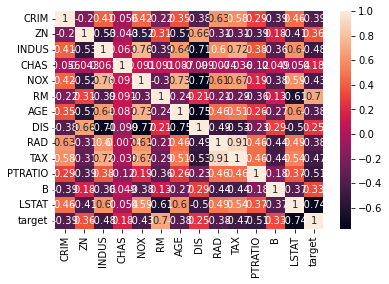

In [24]:
sns.heatmap(bosdf.corr(),annot=True)

In [25]:
x=bosdf.iloc[:,0:-1]
x

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33
...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,0.06263,0.0,11.93,0.0,0.573,6.593,69.1,2.4786,1.0,273.0,21.0,391.99,9.67
502,0.04527,0.0,11.93,0.0,0.573,6.120,76.7,2.2875,1.0,273.0,21.0,396.90,9.08
503,0.06076,0.0,11.93,0.0,0.573,6.976,91.0,2.1675,1.0,273.0,21.0,396.90,5.64
504,0.10959,0.0,11.93,0.0,0.573,6.794,89.3,2.3889,1.0,273.0,21.0,393.45,6.48


In [26]:
y=bosdf.iloc[:,-1]

In [27]:
y

0      24.0
1      21.6
2      34.7
3      33.4
4      36.2
       ... 
501    22.4
502    20.6
503    23.9
504    22.0
505    11.9
Name: target, Length: 506, dtype: float64

In [10]:
bosdf.skew()

CRIM       5.223149
ZN         2.225666
INDUS      0.295022
CHAS       3.405904
NOX        0.729308
RM         0.403612
AGE       -0.598963
DIS        1.011781
RAD        1.004815
TAX        0.669956
PTRATIO   -0.802325
B         -2.890374
LSTAT      0.906460
dtype: float64

<AxesSubplot:>

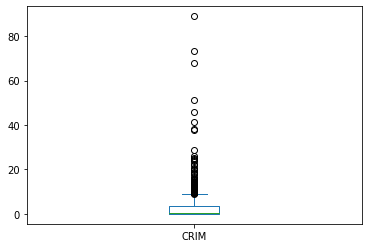

In [12]:
bosdf['CRIM'].plot.box()

<AxesSubplot:>

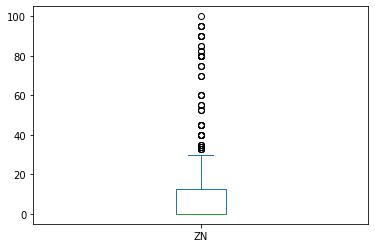

In [13]:
bosdf['ZN'].plot.box()

<AxesSubplot:ylabel='Frequency'>

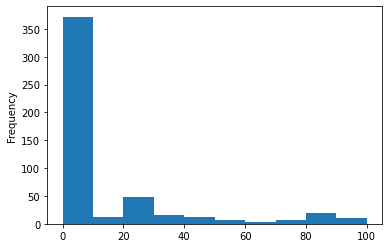

In [9]:
bosdf['ZN'].plot.hist()

<AxesSubplot:ylabel='Frequency'>

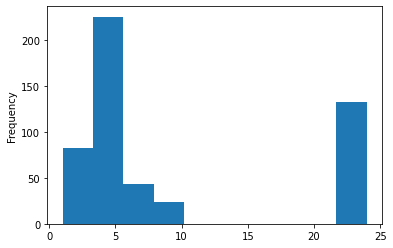

In [10]:
bosdf['RAD'].plot.hist()

In [14]:
bosdf.plot?

CRIM          AxesSubplot(0.125,0.536818;0.0945122x0.343182)
ZN         AxesSubplot(0.238415,0.536818;0.0945122x0.343182)
INDUS      AxesSubplot(0.351829,0.536818;0.0945122x0.343182)
CHAS       AxesSubplot(0.465244,0.536818;0.0945122x0.343182)
NOX        AxesSubplot(0.578659,0.536818;0.0945122x0.343182)
RM         AxesSubplot(0.692073,0.536818;0.0945122x0.343182)
AGE        AxesSubplot(0.805488,0.536818;0.0945122x0.343182)
DIS              AxesSubplot(0.125,0.125;0.0945122x0.343182)
RAD           AxesSubplot(0.238415,0.125;0.0945122x0.343182)
TAX           AxesSubplot(0.351829,0.125;0.0945122x0.343182)
PTRATIO       AxesSubplot(0.465244,0.125;0.0945122x0.343182)
B             AxesSubplot(0.578659,0.125;0.0945122x0.343182)
LSTAT         AxesSubplot(0.692073,0.125;0.0945122x0.343182)
dtype: object

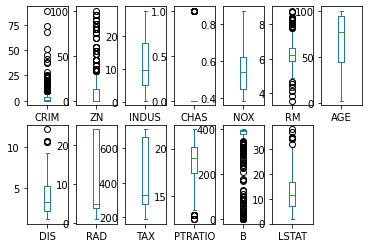

In [15]:
bosdf.plot(kind='box',subplots=True,layout=(2,7))

In [6]:
#removing outliers
from scipy.stats import zscore
z=np.abs(zscore(bosdf))
z

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,0.419782,0.284830,1.287909,0.272599,0.144217,0.413672,0.120013,0.140214,0.982843,0.666608,1.459000,0.441052,1.075562
1,0.417339,0.487722,0.593381,0.272599,0.740262,0.194274,0.367166,0.557160,0.867883,0.987329,0.303094,0.441052,0.492439
2,0.417342,0.487722,0.593381,0.272599,0.740262,1.282714,0.265812,0.557160,0.867883,0.987329,0.303094,0.396427,1.208727
3,0.416750,0.487722,1.306878,0.272599,0.835284,1.016303,0.809889,1.077737,0.752922,1.106115,0.113032,0.416163,1.361517
4,0.412482,0.487722,1.306878,0.272599,0.835284,1.228577,0.511180,1.077737,0.752922,1.106115,0.113032,0.441052,1.026501
...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,0.413229,0.487722,0.115738,0.272599,0.158124,0.439316,0.018673,0.625796,0.982843,0.803212,1.176466,0.387217,0.418147
502,0.415249,0.487722,0.115738,0.272599,0.158124,0.234548,0.288933,0.716639,0.982843,0.803212,1.176466,0.441052,0.500850
503,0.413447,0.487722,0.115738,0.272599,0.158124,0.984960,0.797449,0.773684,0.982843,0.803212,1.176466,0.441052,0.983048
504,0.407764,0.487722,0.115738,0.272599,0.158124,0.725672,0.736996,0.668437,0.982843,0.803212,1.176466,0.403225,0.865302


In [9]:
#threshold for zscore values ---- above 3  are considered outliers
threshold=3
print(np.where(z>3))

(array([ 55,  56,  57, 102, 141, 142, 152, 154, 155, 160, 162, 163, 199,
       200, 201, 202, 203, 204, 208, 209, 210, 211, 212, 216, 218, 219,
       220, 221, 222, 225, 234, 236, 256, 257, 262, 269, 273, 274, 276,
       277, 282, 283, 283, 284, 347, 351, 352, 353, 353, 354, 355, 356,
       357, 358, 363, 364, 364, 365, 367, 369, 370, 372, 373, 374, 374,
       380, 398, 404, 405, 406, 410, 410, 411, 412, 412, 414, 414, 415,
       416, 418, 418, 419, 423, 424, 425, 426, 427, 427, 429, 431, 436,
       437, 438, 445, 450, 454, 455, 456, 457, 466], dtype=int64), array([ 1,  1,  1, 11, 12,  3,  3,  3,  3,  3,  3,  3,  1,  1,  1,  1,  1,
        1,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  5,  3,  3,  1,  5,
        5,  3,  3,  3,  3,  3,  3,  1,  3,  1,  1,  7,  7,  1,  7,  7,  7,
        3,  3,  3,  3,  3,  5,  5,  5,  3,  3,  3, 12,  5, 12,  0,  0,  0,
        0,  5,  0, 11, 11, 11, 12,  0, 12, 11, 11,  0, 11, 11, 11, 11, 11,
       11,  0, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11

In [10]:
z.iloc[55][1]

3.375038763517309

In [11]:
bosdf.skew()

CRIM       5.223149
ZN         2.225666
INDUS      0.295022
CHAS       3.405904
NOX        0.729308
RM         0.403612
AGE       -0.598963
DIS        1.011781
RAD        1.004815
TAX        0.669956
PTRATIO   -0.802325
B         -2.890374
LSTAT      0.906460
dtype: float64

In [12]:
# bosdf['CRIM']=np.log(bos['CRIM'])
# bosdf['CRIM'].plot.hist()

In [ ]:
from scipy.stats import boxcox
# 0---log transform
# .5---square root transform

bosdf['CRIM']=boxcox(bosdf['CRIM'],0)

<AxesSubplot:ylabel='Frequency'>

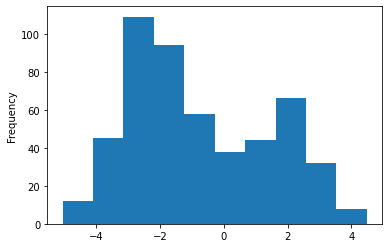

In [19]:
bosdf['CRIM'].plot.hist()

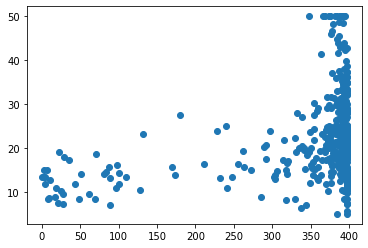

In [28]:
plt.scatter(bosdf['B'],bosdf['target'])
plt.show()

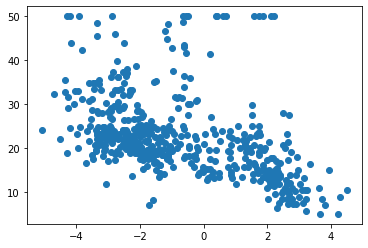

In [29]:
plt.scatter(bosdf['CRIM'],bosdf['target'])
plt.show()

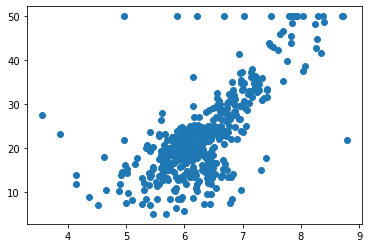

In [31]:
x=bosdf['RM']
y=bosdf['target']
plt.scatter(x,y)
plt.show()

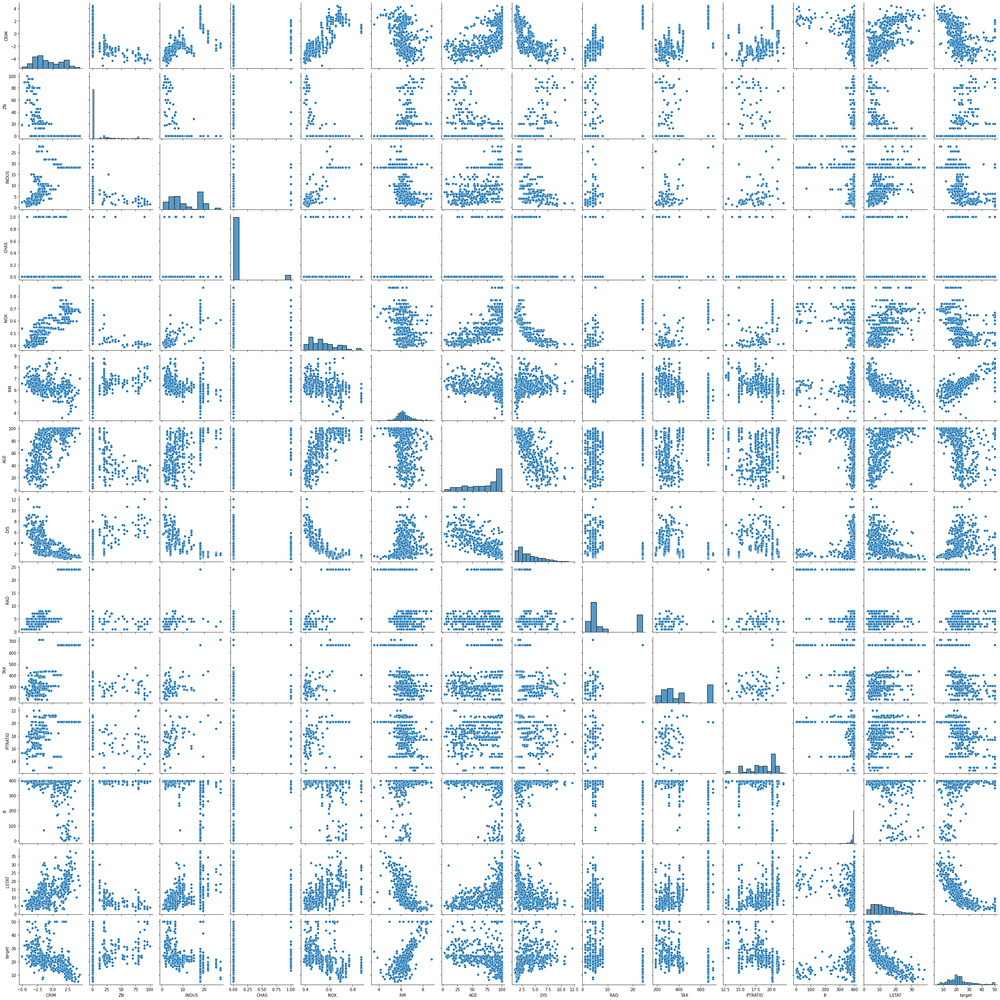

In [32]:
sns.pairplot(bosdf)

In [33]:
# plt.figure?

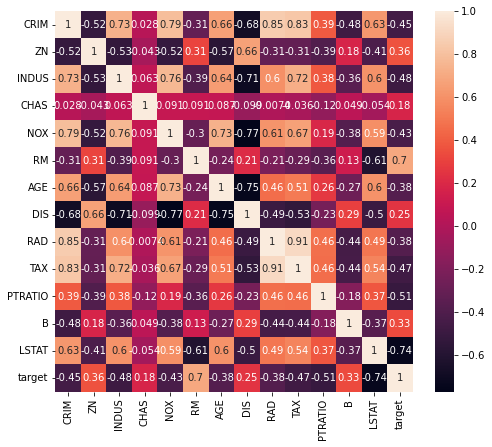

In [34]:
corr_hmap=bosdf.corr()
plt.figure(figsize=(8,7))
sns.heatmap(corr_hmap,annot=True)
plt.show()

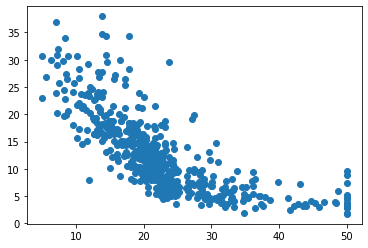

In [36]:
plt.scatter(bosdf['target'],bosdf['LSTAT'])
plt.show()

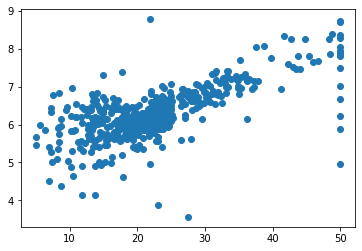

In [37]:
plt.scatter(bosdf['target'],bosdf['RM'])
plt.show()

In [38]:
# drop the Lstat, because lstat has maximum -ve point
bosdf.drop('LSTAT',axis=1,inplace=True)


In [39]:
# lstat dropped
bosdf.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,target
0,-5.064036,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,24.0
1,-3.600502,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,21.6
2,-3.601235,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,34.7
3,-3.430523,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,33.4
4,-2.672924,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,36.2


In [40]:
bosdf_new=bosdf[(z<3).all(axis=1)] #removing outliers

In [41]:
bosdf.shape

(506, 13)

In [42]:
bosdf_new.shape

(415, 13)

In [43]:
bosdf=bosdf_new
bosdf.shape

(415, 13)

In [44]:
x=bosdf.iloc[:,0:-1]
x.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B
0,-5.064036,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90
1,-3.600502,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90
2,-3.601235,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83
3,-3.430523,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63
4,-2.672924,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90


In [45]:
y=bosdf.iloc[:,-1]
y.head()

0    24.0
1    21.6
2    34.7
3    33.4
4    36.2
Name: target, dtype: float64

In [46]:
x.shape

(415, 12)

In [47]:
y.shape

(415,)

In [48]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.33,random_state=42)

In [49]:
x_train.shape

(278, 12)

In [50]:
y_train.shape

(278,)

In [51]:
x_test.shape

(137, 12)

In [52]:
y_test.shape

(137,)

In [54]:
lm=LinearRegression()

In [55]:
lm.fit(x_train,y_train)

LinearRegression()

In [56]:
lm.coef_

array([ 4.14796426e-01, -9.48452702e-03, -4.06227602e-02,  5.72909775e-14,
       -1.23983569e+01,  8.31144766e+00, -6.77907881e-02, -1.13441493e+00,
        5.01745969e-02, -1.14702471e-02, -7.86910388e-01,  9.22717357e-03])

In [57]:
lm.intercept_

1.8854666465849448

In [59]:
bosdf.columns

Index(['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX',
       'PTRATIO', 'B', 'target'],
      dtype='object')

In [60]:
lm.score(x_train,y_train)

0.7450145138939896

In [61]:
# predict the value
pred=lm.predict(x_test)
print("Predicted result price:",pred)
print("actual price",y_test)

Predicted result price: [20.52442424 14.50954987 31.48981889 18.38422384 13.11595168 20.74166358
 17.31106356 25.10782451 29.63472112 10.80717631 17.72388147 15.66550921
  8.98488733 24.2796744  28.0476132  10.66047743 25.72749894 27.39232049
 24.82886327 14.00150342 21.74381609 19.10692104 23.56431589 12.02612149
 21.95599491 21.65951382 31.75447852 27.59747081 22.12417845 25.11716752
 32.44831628 14.71524841 13.54990408 26.20905344 15.60321561 15.05490348
 26.86359361 22.35845603 13.86144763 18.99549243 17.0945682  18.05130457
 20.53768755 26.7156161  17.09451963 26.13236614 19.94441974 19.53061132
 17.73605627 24.45928944 20.77561576 19.08973639 39.75458281 13.43911029
 19.02561668 22.10396188 18.67498499 41.20330795 20.14021397 18.15193296
 26.50489232 16.78844208 24.55486022 27.9783275  14.51500777  5.34938429
 34.18098705 19.63353383 19.10870329 22.45899667 35.32998138 19.93681787
 24.22017841 24.67056111 15.35382945 22.52605265 16.4249922  17.9233105
 22.49542546 16.40495667 17.

In [62]:
print('error:')
print('Mean absolute error:',mean_absolute_error(y_test,pred))
print('Mean squared error:',mean_squared_error(y_test,pred))

print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred)))

error:
Mean absolute error: 2.828070501926145
Mean squared error: 25.677469856868516
Root Mean Squared Error: 5.067294135617995


In [64]:
# r2 score ----coefficient of determination
# is the proportion of the variance in the dependent variable that is predictable from independent variable(s)
# i.e. change coming in y whenver x is being changed

from sklearn.metrics import r2_score
print(r2_score(y_test,pred))

0.5559219963471589


In [66]:
# predict the house price by providing the values
t=np.array([0.00032,18.0,0.3,0.0,0.538,6.767,65.2,4.0900,1.0,296.0,15.3,396.90])

In [67]:
t.shape

(12,)

In [68]:
t.shape

(12,)

In [69]:
t=t.reshape(1,-1) (#1 row, -1 many columns)

In [70]:
t.shape

(1, 12)

In [71]:
lm.predict(t)

array([30.4937426])

# Logistic Regression

In [48]:
import numpy as np
import pandas as pd
import sklearn
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report

from sklearn.model_selection import train_test_split

import warnings
warnings.filterwarnings('ignore')

# Cancer Detection using machine learning

What is Breast Cancer?
Cancer occurs when changes called mutations take place in genes that regulate cell growth. The mutations let the cells divide and multiply in an uncontrolled, chaotic way. The cells keep on proliferating, producing copies that get progressively more abnormal. In most cases, the cell copies eventually end up forming a tumor.

As breast cancer tumors mature, they may metastasize (spread) to other parts of the body. The primary route of metastasis is the lymphatic system which, ironically enough, is also the body's primary system for producing and transporting white blood cells and other cancer-fighting immune system cells throughout the body. Metastasized cancer cells that aren't destroyed by the lymphatic system's white blood cells move through the lymphatic vessels and settle in remote body locations, forming new tumors and perpetuating the disease process.
Breast cancer is the most commonly occurring cancer in women and the second most common cancer overall. There were over 2 million new cases in 2018.

The Projects Features Detection of Breast Cancer Using Machine Learning.The dataset used in this project is from Breast Cancer Wisconsin (Diagnostic) Data Set, however it can be directly accessed from Scikit learn library's collection of datasets as...

sklearn.datasets.load_breast_cancer

In [3]:
from sklearn.datasets import load_breast_cancer

In [6]:
dscancer=load_breast_cancer()

In [7]:
dscancer     #data=input i.e. x, target=lable target output i.e. y

{'data': array([[1.799e+01, 1.038e+01, 1.228e+02, ..., 2.654e-01, 4.601e-01,
         1.189e-01],
        [2.057e+01, 1.777e+01, 1.329e+02, ..., 1.860e-01, 2.750e-01,
         8.902e-02],
        [1.969e+01, 2.125e+01, 1.300e+02, ..., 2.430e-01, 3.613e-01,
         8.758e-02],
        ...,
        [1.660e+01, 2.808e+01, 1.083e+02, ..., 1.418e-01, 2.218e-01,
         7.820e-02],
        [2.060e+01, 2.933e+01, 1.401e+02, ..., 2.650e-01, 4.087e-01,
         1.240e-01],
        [7.760e+00, 2.454e+01, 4.792e+01, ..., 0.000e+00, 2.871e-01,
         7.039e-02]]),
 'target': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
        0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0,
        1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0,
        1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1,
        1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0

In [8]:
dscancer.keys()

dict_keys(['data', 'target', 'frame', 'target_names', 'DESCR', 'feature_names', 'filename'])

In [9]:
dscancer.data

array([[1.799e+01, 1.038e+01, 1.228e+02, ..., 2.654e-01, 4.601e-01,
        1.189e-01],
       [2.057e+01, 1.777e+01, 1.329e+02, ..., 1.860e-01, 2.750e-01,
        8.902e-02],
       [1.969e+01, 2.125e+01, 1.300e+02, ..., 2.430e-01, 3.613e-01,
        8.758e-02],
       ...,
       [1.660e+01, 2.808e+01, 1.083e+02, ..., 1.418e-01, 2.218e-01,
        7.820e-02],
       [2.060e+01, 2.933e+01, 1.401e+02, ..., 2.650e-01, 4.087e-01,
        1.240e-01],
       [7.760e+00, 2.454e+01, 4.792e+01, ..., 0.000e+00, 2.871e-01,
        7.039e-02]])

In [10]:
dscancer.target

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0,
       1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0,
       1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0,
       0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1,
       1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0,
       0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0,
       1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0,

In [11]:
dscancer.feature_names

array(['mean radius', 'mean texture', 'mean perimeter', 'mean area',
       'mean smoothness', 'mean compactness', 'mean concavity',
       'mean concave points', 'mean symmetry', 'mean fractal dimension',
       'radius error', 'texture error', 'perimeter error', 'area error',
       'smoothness error', 'compactness error', 'concavity error',
       'concave points error', 'symmetry error',
       'fractal dimension error', 'worst radius', 'worst texture',
       'worst perimeter', 'worst area', 'worst smoothness',
       'worst compactness', 'worst concavity', 'worst concave points',
       'worst symmetry', 'worst fractal dimension'], dtype='<U23')

In [13]:
ds=pd.DataFrame(data=dscancer.data)

In [14]:
ds

,0,1,2,3,4,5,6,7,8,9,...,20,21,22,23,24,25,26,27,28,29
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [16]:
ds=pd.DataFrame(data=dscancer.data,columns=dscancer.feature_names)

In [17]:
ds

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [18]:
ds['target']=pd.DataFrame(data=dscancer.target)       #target is y and rest are x

In [19]:
ds

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890,0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902,0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758,0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300,0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,0
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,0
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,0
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,0


In [30]:
ds.shape

(569, 31)

In [31]:
ds.dtypes

mean radius                float64
mean texture               float64
mean perimeter             float64
mean area                  float64
mean smoothness            float64
mean compactness           float64
mean concavity             float64
mean concave points        float64
mean symmetry              float64
mean fractal dimension     float64
radius error               float64
texture error              float64
perimeter error            float64
area error                 float64
smoothness error           float64
compactness error          float64
concavity error            float64
concave points error       float64
symmetry error             float64
fractal dimension error    float64
worst radius               float64
worst texture              float64
worst perimeter            float64
worst area                 float64
worst smoothness           float64
worst compactness          float64
worst concavity            float64
worst concave points       float64
worst symmetry      

In [32]:
ds.isnull().sum()

mean radius                0
mean texture               0
mean perimeter             0
mean area                  0
mean smoothness            0
mean compactness           0
mean concavity             0
mean concave points        0
mean symmetry              0
mean fractal dimension     0
radius error               0
texture error              0
perimeter error            0
area error                 0
smoothness error           0
compactness error          0
concavity error            0
concave points error       0
symmetry error             0
fractal dimension error    0
worst radius               0
worst texture              0
worst perimeter            0
worst area                 0
worst smoothness           0
worst compactness          0
worst concavity            0
worst concave points       0
worst symmetry             0
worst fractal dimension    0
target                     0
dtype: int64

In [21]:
# split data
x=ds.iloc[:,0:30] #or[:,0:-1]

In [22]:
x

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [24]:
y=ds.iloc[:,-1]

In [25]:
y

0      0
1      0
2      0
3      0
4      0
      ..
564    0
565    0
566    0
567    0
568    1
Name: target, Length: 569, dtype: int32

In [33]:
x.shape

(569, 30)

In [26]:
corr1=ds.corr()

In [27]:
corr1

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
mean radius,1.000000,0.323782,0.997855,0.987357,0.170581,0.506124,0.676764,0.822529,0.147741,-0.311631,...,0.297008,0.965137,0.941082,0.119616,0.413463,0.526911,0.744214,0.163953,0.007066,-0.730029
mean texture,0.323782,1.000000,0.329533,0.321086,-0.023389,0.236702,0.302418,0.293464,0.071401,-0.076437,...,0.912045,0.358040,0.343546,0.077503,0.277830,0.301025,0.295316,0.105008,0.119205,-0.415185
mean perimeter,0.997855,0.329533,1.000000,0.986507,0.207278,0.556936,0.716136,0.850977,0.183027,-0.261477,...,0.303038,0.970387,0.941550,0.150549,0.455774,0.563879,0.771241,0.189115,0.051019,-0.742636
mean area,0.987357,0.321086,0.986507,1.000000,0.177028,0.498502,0.685983,0.823269,0.151293,-0.283110,...,0.287489,0.959120,0.959213,0.123523,0.390410,0.512606,0.722017,0.143570,0.003738,-0.708984
mean smoothness,0.170581,-0.023389,0.207278,0.177028,1.000000,0.659123,0.521984,0.553695,0.557775,0.584792,...,0.036072,0.238853,0.206718,0.805324,0.472468,0.434926,0.503053,0.394309,0.499316,-0.358560
mean compactness,0.506124,0.236702,0.556936,0.498502,0.659123,1.000000,0.883121,0.831135,0.602641,0.565369,...,0.248133,0.590210,0.509604,0.565541,0.865809,0.816275,0.815573,0.510223,0.687382,-0.596534
mean concavity,0.676764,0.302418,0.716136,0.685983,0.521984,0.883121,1.000000,0.921391,0.500667,0.336783,...,0.299879,0.729565,0.675987,0.448822,0.754968,0.884103,0.861323,0.409464,0.514930,-0.696360
mean concave points,0.822529,0.293464,0.850977,0.823269,0.553695,0.831135,0.921391,1.000000,0.462497,0.166917,...,0.292752,0.855923,0.809630,0.452753,0.667454,0.752399,0.910155,0.375744,0.368661,-0.776614
mean symmetry,0.147741,0.071401,0.183027,0.151293,0.557775,0.602641,0.500667,0.462497,1.000000,0.479921,...,0.090651,0.219169,0.177193,0.426675,0.473200,0.433721,0.430297,0.699826,0.438413,-0.330499
mean fractal dimension,-0.311631,-0.076437,-0.261477,-0.283110,0.584792,0.565369,0.336783,0.166917,0.479921,1.000000,...,-0.051269,-0.205151,-0.231854,0.504942,0.458798,0.346234,0.175325,0.334019,0.767297,0.012838


<AxesSubplot:>

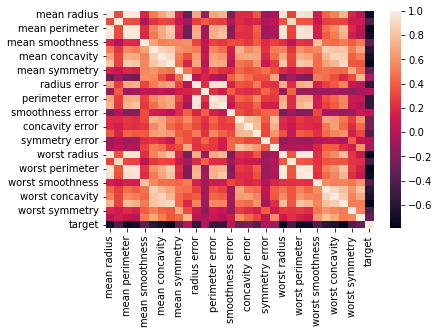

In [28]:
sns.heatmap(corr1)

<AxesSubplot:>

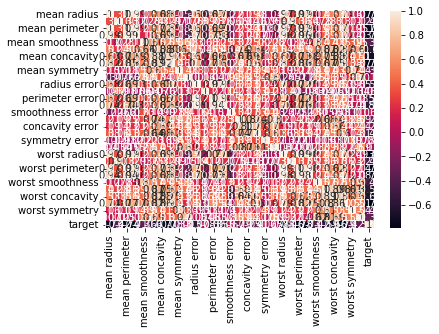

In [29]:
sns.heatmap(corr1,annot=True)

In [41]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=45)  #45 seed value

In [37]:
x_train.shape

(398, 30)

In [42]:
x_test.shape

(171, 30)

In [43]:
y_train.shape

(398,)

In [44]:
y_test.shape

(171,)

In [45]:
lg=LogisticRegression()

In [49]:
lg.fit(x_train,y_train)

LogisticRegression()

In [50]:
lg.predict(x_test)

array([1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0,
       1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1,
       0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1,
       1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0,
       0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1,
       1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1])

In [51]:
pred=lg.predict(x_test)

In [52]:
pred

array([1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0,
       1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1,
       0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1,
       1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0,
       0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1,
       1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1])

In [53]:
accuracy_score(y_test,pred)

0.9473684210526315

In [54]:
round(accuracy_score(y_test,pred),3)

0.947

In [55]:
confusion_matrix(y_test,pred)

array([[ 53,   8],
       [  1, 109]], dtype=int64)

In [58]:
print(classification_report(y_test,pred))

              precision    recall  f1-score   support

           0       0.98      0.87      0.92        61
           1       0.93      0.99      0.96       110

    accuracy                           0.95       171
   macro avg       0.96      0.93      0.94       171
weighted avg       0.95      0.95      0.95       171



<AxesSubplot:>

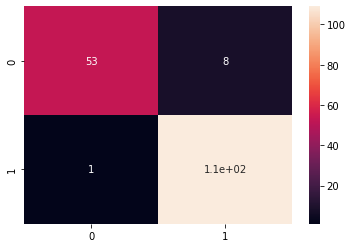

In [76]:
p=confusion_matrix(y_test,pred)
sns.heatmap(p,annot=True)

In [59]:
# sns.pairplot(dscancer)

In [60]:
# sns.pairplot(dscancer,hue='target')

<AxesSubplot:ylabel='count'>

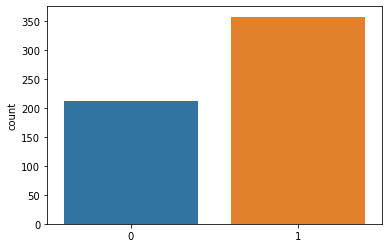

In [61]:
sns.countplot(dscancer['target'])

<AxesSubplot:>

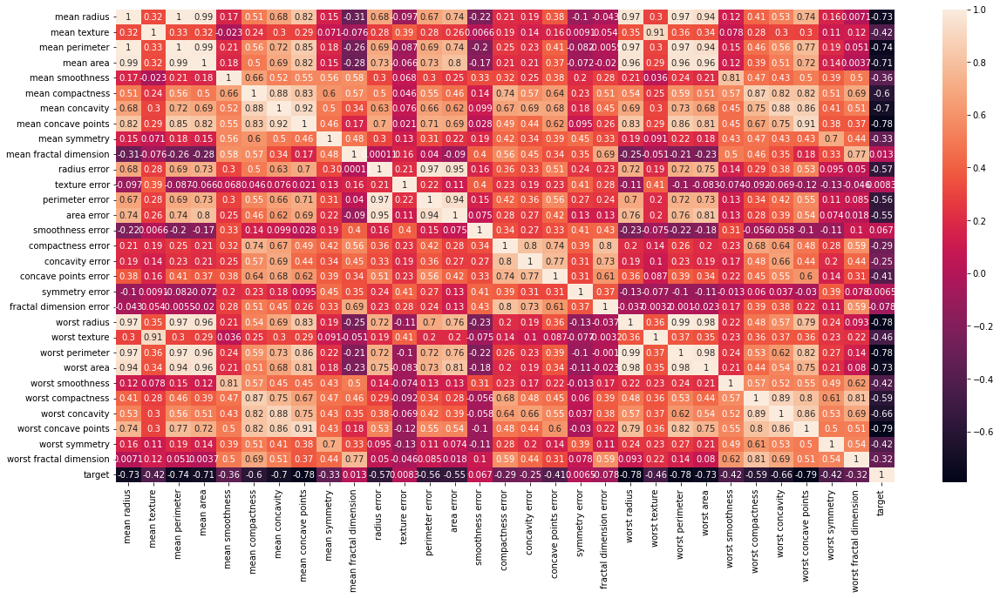

In [69]:
plt.figure(figsize=(20,10))
sns.heatmap(ds.corr(),annot=True)

In [71]:
x=ds.drop(['target'],axis=1)

In [72]:
x

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [73]:
y=ds['target']

In [74]:
y

0      0
1      0
2      0
3      0
4      0
      ..
564    0
565    0
566    0
567    0
568    1
Name: target, Length: 569, dtype: int32

In [77]:
def cancerpredict(p):
    p=p.reshape(1,-1) 
    pred=lg.predict(p)
    print('Predicted value:',pred)
    if pred == 0:
        print('The person does not have cancer')
    else:
        print('The person si suffering from the cancer')
        
            

In [ ]:
#continue......not getting file

# Classification

Naive - Bayes Algorithm

In [1]:
import numpy as np
import pandas as pd

import sklearn
import seaborn as sns

from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report

from sklearn.datasets import load_iris

In [2]:
ds=load_iris()

In [3]:
ds.keys()

dict_keys(['data', 'target', 'frame', 'target_names', 'DESCR', 'feature_names', 'filename'])

In [51]:
ds.target_names

array(['setosa', 'versicolor', 'virginica'], dtype='<U10')

In [4]:
ds.data

array([[5.1, 3.5, 1.4, 0.2],
       [4.9, 3. , 1.4, 0.2],
       [4.7, 3.2, 1.3, 0.2],
       [4.6, 3.1, 1.5, 0.2],
       [5. , 3.6, 1.4, 0.2],
       [5.4, 3.9, 1.7, 0.4],
       [4.6, 3.4, 1.4, 0.3],
       [5. , 3.4, 1.5, 0.2],
       [4.4, 2.9, 1.4, 0.2],
       [4.9, 3.1, 1.5, 0.1],
       [5.4, 3.7, 1.5, 0.2],
       [4.8, 3.4, 1.6, 0.2],
       [4.8, 3. , 1.4, 0.1],
       [4.3, 3. , 1.1, 0.1],
       [5.8, 4. , 1.2, 0.2],
       [5.7, 4.4, 1.5, 0.4],
       [5.4, 3.9, 1.3, 0.4],
       [5.1, 3.5, 1.4, 0.3],
       [5.7, 3.8, 1.7, 0.3],
       [5.1, 3.8, 1.5, 0.3],
       [5.4, 3.4, 1.7, 0.2],
       [5.1, 3.7, 1.5, 0.4],
       [4.6, 3.6, 1. , 0.2],
       [5.1, 3.3, 1.7, 0.5],
       [4.8, 3.4, 1.9, 0.2],
       [5. , 3. , 1.6, 0.2],
       [5. , 3.4, 1.6, 0.4],
       [5.2, 3.5, 1.5, 0.2],
       [5.2, 3.4, 1.4, 0.2],
       [4.7, 3.2, 1.6, 0.2],
       [4.8, 3.1, 1.6, 0.2],
       [5.4, 3.4, 1.5, 0.4],
       [5.2, 4.1, 1.5, 0.1],
       [5.5, 4.2, 1.4, 0.2],
       [4.9, 3

In [5]:
ds.target                 #0---Setosa,1---Versicolor,2---Virginica

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2])

In [6]:
ds.feature_names

['sepal length (cm)',
 'sepal width (cm)',
 'petal length (cm)',
 'petal width (cm)']

In [8]:
df=pd.DataFrame(ds.data)
df

,0,1,2,3
0,5.1,3.5,1.4,0.2
1,4.9,3.0,1.4,0.2
2,4.7,3.2,1.3,0.2
3,4.6,3.1,1.5,0.2
4,5.0,3.6,1.4,0.2
...,...,...,...,...
145,6.7,3.0,5.2,2.3
146,6.3,2.5,5.0,1.9
147,6.5,3.0,5.2,2.0
148,6.2,3.4,5.4,2.3


In [12]:
df=pd.DataFrame(ds.data,columns=ds.feature_names)
df

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
0,5.1,3.5,1.4,0.2
1,4.9,3.0,1.4,0.2
2,4.7,3.2,1.3,0.2
3,4.6,3.1,1.5,0.2
4,5.0,3.6,1.4,0.2
...,...,...,...,...
145,6.7,3.0,5.2,2.3
146,6.3,2.5,5.0,1.9
147,6.5,3.0,5.2,2.0
148,6.2,3.4,5.4,2.3


In [14]:
df['target']=pd.DataFrame(ds.target)
df

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),target
0,5.1,3.5,1.4,0.2,0
1,4.9,3.0,1.4,0.2,0
2,4.7,3.2,1.3,0.2,0
3,4.6,3.1,1.5,0.2,0
4,5.0,3.6,1.4,0.2,0
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,2
146,6.3,2.5,5.0,1.9,2
147,6.5,3.0,5.2,2.0,2
148,6.2,3.4,5.4,2.3,2


In [15]:
df.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),target
0,5.1,3.5,1.4,0.2,0
1,4.9,3.0,1.4,0.2,0
2,4.7,3.2,1.3,0.2,0
3,4.6,3.1,1.5,0.2,0
4,5.0,3.6,1.4,0.2,0


In [16]:
df.tail()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),target
145,6.7,3.0,5.2,2.3,2
146,6.3,2.5,5.0,1.9,2
147,6.5,3.0,5.2,2.0,2
148,6.2,3.4,5.4,2.3,2
149,5.9,3.0,5.1,1.8,2


In [17]:
df.sample()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),target
98,5.1,2.5,3.0,1.1,1


In [ ]:
# Split data rule no.1

In [18]:
x=ds.data
x

array([[5.1, 3.5, 1.4, 0.2],
       [4.9, 3. , 1.4, 0.2],
       [4.7, 3.2, 1.3, 0.2],
       [4.6, 3.1, 1.5, 0.2],
       [5. , 3.6, 1.4, 0.2],
       [5.4, 3.9, 1.7, 0.4],
       [4.6, 3.4, 1.4, 0.3],
       [5. , 3.4, 1.5, 0.2],
       [4.4, 2.9, 1.4, 0.2],
       [4.9, 3.1, 1.5, 0.1],
       [5.4, 3.7, 1.5, 0.2],
       [4.8, 3.4, 1.6, 0.2],
       [4.8, 3. , 1.4, 0.1],
       [4.3, 3. , 1.1, 0.1],
       [5.8, 4. , 1.2, 0.2],
       [5.7, 4.4, 1.5, 0.4],
       [5.4, 3.9, 1.3, 0.4],
       [5.1, 3.5, 1.4, 0.3],
       [5.7, 3.8, 1.7, 0.3],
       [5.1, 3.8, 1.5, 0.3],
       [5.4, 3.4, 1.7, 0.2],
       [5.1, 3.7, 1.5, 0.4],
       [4.6, 3.6, 1. , 0.2],
       [5.1, 3.3, 1.7, 0.5],
       [4.8, 3.4, 1.9, 0.2],
       [5. , 3. , 1.6, 0.2],
       [5. , 3.4, 1.6, 0.4],
       [5.2, 3.5, 1.5, 0.2],
       [5.2, 3.4, 1.4, 0.2],
       [4.7, 3.2, 1.6, 0.2],
       [4.8, 3.1, 1.6, 0.2],
       [5.4, 3.4, 1.5, 0.4],
       [5.2, 4.1, 1.5, 0.1],
       [5.5, 4.2, 1.4, 0.2],
       [4.9, 3

In [19]:
x.shape

(150, 4)

In [20]:
y=ds.target
y

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2])

In [21]:
 y.shape

(150,)

In [22]:
# Split data rule no.2

In [23]:
z=df.iloc[:,0:-1]

In [24]:
z

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
0,5.1,3.5,1.4,0.2
1,4.9,3.0,1.4,0.2
2,4.7,3.2,1.3,0.2
3,4.6,3.1,1.5,0.2
4,5.0,3.6,1.4,0.2
...,...,...,...,...
145,6.7,3.0,5.2,2.3
146,6.3,2.5,5.0,1.9
147,6.5,3.0,5.2,2.0
148,6.2,3.4,5.4,2.3


In [28]:
z.shape

(150, 4)

In [25]:
a=df.iloc[:,-1]

In [26]:
a

0      0
1      0
2      0
3      0
4      0
      ..
145    2
146    2
147    2
148    2
149    2
Name: target, Length: 150, dtype: int32

In [27]:
a.shape

(150,)

In [29]:
z_train,z_test,a_train,a_test=train_test_split(z,a,test_size=.30,random_state=45) 

In [30]:
z_train

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
21,5.1,3.7,1.5,0.4
111,6.4,2.7,5.3,1.9
62,6.0,2.2,4.0,1.0
117,7.7,3.8,6.7,2.2
37,4.9,3.6,1.4,0.1
...,...,...,...,...
68,6.2,2.2,4.5,1.5
95,5.7,3.0,4.2,1.2
32,5.2,4.1,1.5,0.1
124,6.7,3.3,5.7,2.1


In [34]:
z_train.shape

(105, 4)

In [31]:
z_test

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
0,5.1,3.5,1.4,0.2
43,5.0,3.5,1.6,0.6
129,7.2,3.0,5.8,1.6
3,4.6,3.1,1.5,0.2
34,4.9,3.1,1.5,0.2
44,5.1,3.8,1.9,0.4
38,4.4,3.0,1.3,0.2
105,7.6,3.0,6.6,2.1
123,6.3,2.7,4.9,1.8
140,6.7,3.1,5.6,2.4


In [35]:
z_test.shape

(45, 4)

In [32]:
z_train

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
21,5.1,3.7,1.5,0.4
111,6.4,2.7,5.3,1.9
62,6.0,2.2,4.0,1.0
117,7.7,3.8,6.7,2.2
37,4.9,3.6,1.4,0.1
...,...,...,...,...
68,6.2,2.2,4.5,1.5
95,5.7,3.0,4.2,1.2
32,5.2,4.1,1.5,0.1
124,6.7,3.3,5.7,2.1


In [36]:
z_train.shape

(105, 4)

In [33]:
z_test

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
0,5.1,3.5,1.4,0.2
43,5.0,3.5,1.6,0.6
129,7.2,3.0,5.8,1.6
3,4.6,3.1,1.5,0.2
34,4.9,3.1,1.5,0.2
44,5.1,3.8,1.9,0.4
38,4.4,3.0,1.3,0.2
105,7.6,3.0,6.6,2.1
123,6.3,2.7,4.9,1.8
140,6.7,3.1,5.6,2.4


In [37]:
z_test.shape

(45, 4)

In [38]:
mnb=MultinomialNB()

In [39]:
mnb.fit(z_train,a_train)

MultinomialNB()

In [41]:
pred=mnb.predict(z_test)

In [42]:
pred

array([0, 0, 1, 0, 0, 0, 0, 2, 1, 2, 0, 1, 2, 2, 1, 0, 2, 2, 0, 1, 1, 1,
       2, 1, 0, 2, 1, 1, 0, 1, 1, 1, 1, 2, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1,
       1])

In [43]:
print(accuracy_score(a_test,pred))

0.8666666666666667


In [44]:
round(accuracy_score(a_test,pred),2)

0.87

In [45]:
print(confusion_matrix(a_test,pred))

[[17  0  0]
 [ 0 13  0]
 [ 0  6  9]]


In [46]:
print(classification_report(a_test,pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        17
           1       0.68      1.00      0.81        13
           2       1.00      0.60      0.75        15

    accuracy                           0.87        45
   macro avg       0.89      0.87      0.85        45
weighted avg       0.91      0.87      0.86        45



In [48]:
p=np.array([5.9,3.0,5.1,1.8])

p=p.reshape(1,-1)
p

array([[5.9, 3. , 5.1, 1.8]])

In [49]:
p=np.array([5.9,3.0,5.1,1.8])

p=p.reshape(1,-1)
p.shape

(1, 4)

In [50]:
mnb.predict(p)

array([2])

In [52]:
def test_pred(p):
    p=p.reshape(1,-1)
    print(mnb.predict(p))

In [53]:
p=np.array([5.1,3.5,1.4,0.2])
test_pred(p)

[0]


In [56]:
def test_pred(p):
    p=p.reshape(1,-1)
    val=mnb.predict(p)
    print(val)
    if val==0:
        print('setosa')
    elif val==1:
        print('versiculor')
    elif val==2:
        print('virginica')

In [57]:
p=np.array([5.1,3.5,1.4,0.2])
test_pred(p)

[0]
setosa


In [58]:
def test_pred(p):
    p=p.reshape(1,-1)
    val=mnb.predict(p)
    print(val)
    if val==0:
        print('setosa')
    elif val==1:
        print('versiculor')
    elif val==2:
        print('virginica')

In [59]:
p=np.array([6.5,3.0,5.2,2.0])
test_pred(p)

[2]
virginica


GAUSSIAN NAIVE BAYS

In [62]:
from sklearn.naive_bayes import GaussianNB
from sklearn.datasets import load_breast_cancer


In [64]:
ds1=load_breast_cancer()

In [65]:
ds1

{'data': array([[1.799e+01, 1.038e+01, 1.228e+02, ..., 2.654e-01, 4.601e-01,
         1.189e-01],
        [2.057e+01, 1.777e+01, 1.329e+02, ..., 1.860e-01, 2.750e-01,
         8.902e-02],
        [1.969e+01, 2.125e+01, 1.300e+02, ..., 2.430e-01, 3.613e-01,
         8.758e-02],
        ...,
        [1.660e+01, 2.808e+01, 1.083e+02, ..., 1.418e-01, 2.218e-01,
         7.820e-02],
        [2.060e+01, 2.933e+01, 1.401e+02, ..., 2.650e-01, 4.087e-01,
         1.240e-01],
        [7.760e+00, 2.454e+01, 4.792e+01, ..., 0.000e+00, 2.871e-01,
         7.039e-02]]),
 'target': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
        0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0,
        1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0,
        1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1,
        1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0

In [ ]:
ds1

In [68]:
x=ds1.data

In [69]:
x

array([[1.799e+01, 1.038e+01, 1.228e+02, ..., 2.654e-01, 4.601e-01,
        1.189e-01],
       [2.057e+01, 1.777e+01, 1.329e+02, ..., 1.860e-01, 2.750e-01,
        8.902e-02],
       [1.969e+01, 2.125e+01, 1.300e+02, ..., 2.430e-01, 3.613e-01,
        8.758e-02],
       ...,
       [1.660e+01, 2.808e+01, 1.083e+02, ..., 1.418e-01, 2.218e-01,
        7.820e-02],
       [2.060e+01, 2.933e+01, 1.401e+02, ..., 2.650e-01, 4.087e-01,
        1.240e-01],
       [7.760e+00, 2.454e+01, 4.792e+01, ..., 0.000e+00, 2.871e-01,
        7.039e-02]])

In [73]:
x.shape

(569, 30)

In [ ]:
y=ds1.target

In [71]:
y

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0,
       1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0,
       1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0,
       0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1,
       1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0,
       0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0,
       1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0,

In [74]:
y.shape

(569,)

In [87]:
train_x,test_x,train_y,test_y=train_test_split(ds1.data,ds1.target,test_size=.30,random_state=45)

In [88]:
train_x.shape

(398, 30)

In [90]:
test_x.shape

(171, 30)

In [91]:
train_y.shape

(398,)

In [92]:
test_y.shape

(171,)

In [93]:
gnb=GaussianNB()

In [94]:
gnb.fit(train_x,train_y)

GaussianNB()

In [95]:
prd=gnb.predict(test_x)

In [97]:
prd

array([1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0,
       1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1,
       0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1,
       0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1,
       1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0,
       1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1,
       1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1])

In [99]:
accuracy_score(test_y,prd)

0.935672514619883

In [104]:
round(accuracy_score(test_y,prd),2)

0.94

In [105]:
confusion_matrix(test_y,prd)

array([[ 52,   9],
       [  2, 108]], dtype=int64)

In [106]:
print(classification_report(test_y,prd))

              precision    recall  f1-score   support

           0       0.96      0.85      0.90        61
           1       0.92      0.98      0.95       110

    accuracy                           0.94       171
   macro avg       0.94      0.92      0.93       171
weighted avg       0.94      0.94      0.93       171



# KNN - KNeighbors Classifier

In [1]:
import numpy as np
import pandas as pd

import sklearn
import seaborn as sns

from sklearn.naive_bayes import MultinomialNB

from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report

from sklearn.datasets import load_iris

In [39]:
ds=load_iris()

In [40]:
ds.keys()

dict_keys(['data', 'target', 'frame', 'target_names', 'DESCR', 'feature_names', 'filename'])

In [41]:
ds.target_names

array(['setosa', 'versicolor', 'virginica'], dtype='<U10')

In [42]:
ds.data

array([[5.1, 3.5, 1.4, 0.2],
       [4.9, 3. , 1.4, 0.2],
       [4.7, 3.2, 1.3, 0.2],
       [4.6, 3.1, 1.5, 0.2],
       [5. , 3.6, 1.4, 0.2],
       [5.4, 3.9, 1.7, 0.4],
       [4.6, 3.4, 1.4, 0.3],
       [5. , 3.4, 1.5, 0.2],
       [4.4, 2.9, 1.4, 0.2],
       [4.9, 3.1, 1.5, 0.1],
       [5.4, 3.7, 1.5, 0.2],
       [4.8, 3.4, 1.6, 0.2],
       [4.8, 3. , 1.4, 0.1],
       [4.3, 3. , 1.1, 0.1],
       [5.8, 4. , 1.2, 0.2],
       [5.7, 4.4, 1.5, 0.4],
       [5.4, 3.9, 1.3, 0.4],
       [5.1, 3.5, 1.4, 0.3],
       [5.7, 3.8, 1.7, 0.3],
       [5.1, 3.8, 1.5, 0.3],
       [5.4, 3.4, 1.7, 0.2],
       [5.1, 3.7, 1.5, 0.4],
       [4.6, 3.6, 1. , 0.2],
       [5.1, 3.3, 1.7, 0.5],
       [4.8, 3.4, 1.9, 0.2],
       [5. , 3. , 1.6, 0.2],
       [5. , 3.4, 1.6, 0.4],
       [5.2, 3.5, 1.5, 0.2],
       [5.2, 3.4, 1.4, 0.2],
       [4.7, 3.2, 1.6, 0.2],
       [4.8, 3.1, 1.6, 0.2],
       [5.4, 3.4, 1.5, 0.4],
       [5.2, 4.1, 1.5, 0.1],
       [5.5, 4.2, 1.4, 0.2],
       [4.9, 3

In [43]:
ds.target

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2])

In [44]:
ds.feature_names

['sepal length (cm)',
 'sepal width (cm)',
 'petal length (cm)',
 'petal width (cm)']

In [45]:
df=pd.DataFrame(ds.data)

In [46]:
df

,0,1,2,3
0,5.1,3.5,1.4,0.2
1,4.9,3.0,1.4,0.2
2,4.7,3.2,1.3,0.2
3,4.6,3.1,1.5,0.2
4,5.0,3.6,1.4,0.2
...,...,...,...,...
145,6.7,3.0,5.2,2.3
146,6.3,2.5,5.0,1.9
147,6.5,3.0,5.2,2.0
148,6.2,3.4,5.4,2.3


In [47]:
df=pd.DataFrame(ds.data,columns=ds.feature_names)

In [48]:
df

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
0,5.1,3.5,1.4,0.2
1,4.9,3.0,1.4,0.2
2,4.7,3.2,1.3,0.2
3,4.6,3.1,1.5,0.2
4,5.0,3.6,1.4,0.2
...,...,...,...,...
145,6.7,3.0,5.2,2.3
146,6.3,2.5,5.0,1.9
147,6.5,3.0,5.2,2.0
148,6.2,3.4,5.4,2.3


In [49]:
df['target']=pd.DataFrame(ds.target)

In [50]:
df

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),target
0,5.1,3.5,1.4,0.2,0
1,4.9,3.0,1.4,0.2,0
2,4.7,3.2,1.3,0.2,0
3,4.6,3.1,1.5,0.2,0
4,5.0,3.6,1.4,0.2,0
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,2
146,6.3,2.5,5.0,1.9,2
147,6.5,3.0,5.2,2.0,2
148,6.2,3.4,5.4,2.3,2


In [52]:
df.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),target
0,5.1,3.5,1.4,0.2,0
1,4.9,3.0,1.4,0.2,0
2,4.7,3.2,1.3,0.2,0
3,4.6,3.1,1.5,0.2,0
4,5.0,3.6,1.4,0.2,0


In [53]:
df.tail()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),target
145,6.7,3.0,5.2,2.3,2
146,6.3,2.5,5.0,1.9,2
147,6.5,3.0,5.2,2.0,2
148,6.2,3.4,5.4,2.3,2
149,5.9,3.0,5.1,1.8,2


In [54]:
x=ds.data

In [55]:
x

array([[5.1, 3.5, 1.4, 0.2],
       [4.9, 3. , 1.4, 0.2],
       [4.7, 3.2, 1.3, 0.2],
       [4.6, 3.1, 1.5, 0.2],
       [5. , 3.6, 1.4, 0.2],
       [5.4, 3.9, 1.7, 0.4],
       [4.6, 3.4, 1.4, 0.3],
       [5. , 3.4, 1.5, 0.2],
       [4.4, 2.9, 1.4, 0.2],
       [4.9, 3.1, 1.5, 0.1],
       [5.4, 3.7, 1.5, 0.2],
       [4.8, 3.4, 1.6, 0.2],
       [4.8, 3. , 1.4, 0.1],
       [4.3, 3. , 1.1, 0.1],
       [5.8, 4. , 1.2, 0.2],
       [5.7, 4.4, 1.5, 0.4],
       [5.4, 3.9, 1.3, 0.4],
       [5.1, 3.5, 1.4, 0.3],
       [5.7, 3.8, 1.7, 0.3],
       [5.1, 3.8, 1.5, 0.3],
       [5.4, 3.4, 1.7, 0.2],
       [5.1, 3.7, 1.5, 0.4],
       [4.6, 3.6, 1. , 0.2],
       [5.1, 3.3, 1.7, 0.5],
       [4.8, 3.4, 1.9, 0.2],
       [5. , 3. , 1.6, 0.2],
       [5. , 3.4, 1.6, 0.4],
       [5.2, 3.5, 1.5, 0.2],
       [5.2, 3.4, 1.4, 0.2],
       [4.7, 3.2, 1.6, 0.2],
       [4.8, 3.1, 1.6, 0.2],
       [5.4, 3.4, 1.5, 0.4],
       [5.2, 4.1, 1.5, 0.1],
       [5.5, 4.2, 1.4, 0.2],
       [4.9, 3

In [56]:
x.shape

(150, 4)

In [57]:
y=ds.target

In [58]:
y

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2])

In [59]:
y.shape

(150,)

In [60]:
z=df.iloc[:,0:-1]

In [61]:
z

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
0,5.1,3.5,1.4,0.2
1,4.9,3.0,1.4,0.2
2,4.7,3.2,1.3,0.2
3,4.6,3.1,1.5,0.2
4,5.0,3.6,1.4,0.2
...,...,...,...,...
145,6.7,3.0,5.2,2.3
146,6.3,2.5,5.0,1.9
147,6.5,3.0,5.2,2.0
148,6.2,3.4,5.4,2.3


In [62]:
z.shape

(150, 4)

In [63]:
a=df.iloc[:,-1]

In [64]:
a

0      0
1      0
2      0
3      0
4      0
      ..
145    2
146    2
147    2
148    2
149    2
Name: target, Length: 150, dtype: int32

In [65]:
a.shape

(150,)

In [66]:
z_train,z_test,a_train,a_test=train_test_split(z,a,test_size=.22,random_state=42) 

In [67]:
z_train

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
11,4.8,3.4,1.6,0.2
42,4.4,3.2,1.3,0.2
146,6.3,2.5,5.0,1.9
51,6.4,3.2,4.5,1.5
27,5.2,3.5,1.5,0.2
...,...,...,...,...
71,6.1,2.8,4.0,1.3
106,4.9,2.5,4.5,1.7
14,5.8,4.0,1.2,0.2
92,5.8,2.6,4.0,1.2


In [68]:
z_train.shape

(117, 4)

In [69]:
z_test

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
73,6.1,2.8,4.7,1.2
18,5.7,3.8,1.7,0.3
118,7.7,2.6,6.9,2.3
78,6.0,2.9,4.5,1.5
76,6.8,2.8,4.8,1.4
31,5.4,3.4,1.5,0.4
64,5.6,2.9,3.6,1.3
141,6.9,3.1,5.1,2.3
68,6.2,2.2,4.5,1.5
82,5.8,2.7,3.9,1.2


In [70]:
z_test.shape

(33, 4)

In [72]:
a_train.shape

(117,)

In [73]:
a_test

73     1
18     0
118    2
78     1
76     1
31     0
64     1
141    2
68     1
82     1
110    2
12     0
36     0
9      0
19     0
56     1
104    2
69     1
55     1
132    2
29     0
127    2
26     0
128    2
131    2
145    2
108    2
143    2
45     0
30     0
22     0
15     0
65     1
Name: target, dtype: int32

In [74]:
a_test.shape

(33,)

In [75]:
mnb=MultinomialNB()

In [78]:
mnb.fit(z_train,a_train)

MultinomialNB()

In [79]:
pred=mnb.predict(z_test)

In [80]:
pred

array([1, 0, 2, 1, 1, 0, 1, 2, 1, 1, 2, 0, 0, 0, 0, 1, 2, 1, 1, 2, 0, 2,
       0, 2, 1, 2, 2, 2, 0, 0, 0, 0, 1])

In [81]:
round(accuracy_score(a_test,pred),2)

0.97

In [82]:
print(confusion_matrix(a_test,pred))

[[12  0  0]
 [ 0 10  0]
 [ 0  1 10]]


In [83]:
print(classification_report(a_test,pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        12
           1       0.91      1.00      0.95        10
           2       1.00      0.91      0.95        11

    accuracy                           0.97        33
   macro avg       0.97      0.97      0.97        33
weighted avg       0.97      0.97      0.97        33



In [84]:
p=np.array([5.9,3.0,5.1,1.8])

p=p.reshape(1,-1)
p

array([[5.9, 3. , 5.1, 1.8]])

In [85]:
p=np.array([5.9,3.0,5.1,1.8])

p=p.reshape(1,-1)
p.shape

(1, 4)

In [86]:
mnb.predict(p)

array([2])

In [88]:
def test_pred(p):
    p=p.reshape(1,-1)
    val=mnb.predict(p)
    print(val)
    if val==0:
        print('setosa')
    elif val==1:
        print('versiculor')
    elif val==2:
        print('virginica')

In [97]:
p=np.array([5.1,3.5,1.4,0.2])
test_pred(p)

[0]
setosa


In [90]:
# knn=KNeighborsClassifier()

knn=KNeighborsClassifier(n_neighbors=5)

In [91]:
knn.fit(z_train,a_train)

KNeighborsClassifier()

In [92]:
pred=knn.predict(z_test)

In [93]:
pred

array([1, 0, 2, 1, 1, 0, 1, 2, 1, 1, 2, 0, 0, 0, 0, 1, 2, 1, 1, 2, 0, 2,
       0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 1])

In [94]:
accuracy_score(a_test,pred)

1.0

In [95]:
print(confusion_matrix(a_test,pred))

[[12  0  0]
 [ 0 10  0]
 [ 0  0 11]]


In [96]:
print(classification_report(a_test,pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        12
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        11

    accuracy                           1.00        33
   macro avg       1.00      1.00      1.00        33
weighted avg       1.00      1.00      1.00        33



In [98]:
def test_pred(p):
    p=p.reshape(1,-1)
    val=knn.predict(p)
    print(val)
    if val==0:
        print('setosa')
    elif val==1:
        print('versiculor')
    elif val==2:
        print('virginica')

In [99]:
p=np.array([5.1,3.5,1.4,0.2])
test_pred(p)

[0]
setosa


In [102]:
p=np.array([6.5,3.0,5.2,2.0])
test_pred(p)

[2]
virginica


In [ ]:
#another option
# n_neighbors=5    default

knn=KNeighborsClassifier(n_neighbors=5)
knn.fit(z_train,a_train)
knn.score(z_train,a_train)
predknn=knn.predict(z_test)
print(accuracy_score(a_test,predknn))
print(confusion_matrix(a_test,predknn))
print(classification_report(a_test,predknn))

Decision Tree Classifier

In [104]:
#dtc=DecisionTreeClassifier
dtc=DecisionTreeClassifier(criterion='gini') #'gini' is default

In [105]:
dtc.fit(z_train,a_train)

DecisionTreeClassifier()

In [107]:
dtc.predict(z_test)

array([1, 0, 2, 1, 1, 0, 1, 2, 1, 1, 2, 0, 0, 0, 0, 1, 2, 1, 1, 2, 0, 2,
       0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 1])

In [108]:
predic=dtc.predict(z_test)

In [109]:
predic

array([1, 0, 2, 1, 1, 0, 1, 2, 1, 1, 2, 0, 0, 0, 0, 1, 2, 1, 1, 2, 0, 2,
       0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 1])

In [110]:
accuracy_score(a_test,predic)

1.0

In [111]:
confusion_matrix(a_test,predic)

array([[12,  0,  0],
       [ 0, 10,  0],
       [ 0,  0, 11]], dtype=int64)

In [113]:
print(classification_report(a_test,predic))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        12
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        11

    accuracy                           1.00        33
   macro avg       1.00      1.00      1.00        33
weighted avg       1.00      1.00      1.00        33



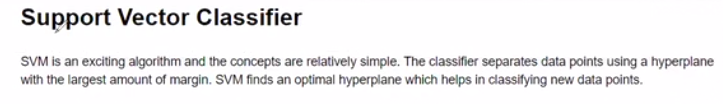

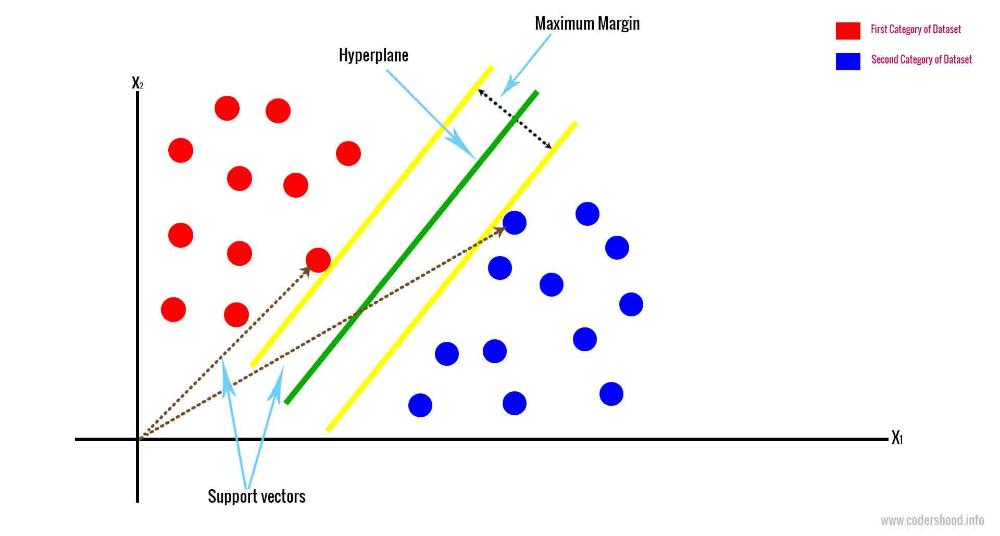

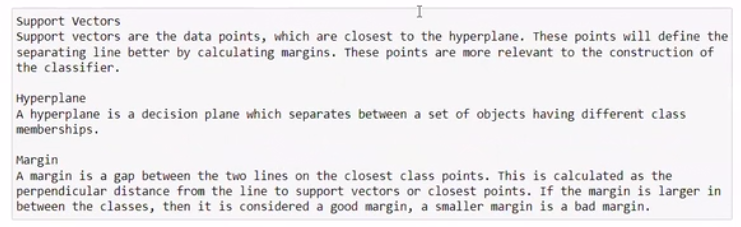

In [116]:
#svc=SVC()
svc=SVC(kernel='rbf')     #kernel='rbf'----default

In [117]:
svc.fit(z_train,a_train)

SVC()

In [119]:
predsvc=svc.predict(z_test)

In [120]:
predsvc

array([1, 0, 2, 1, 1, 0, 1, 2, 1, 1, 2, 0, 0, 0, 0, 1, 2, 1, 1, 2, 0, 2,
       0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 1])

In [121]:
accuracy_score(a_test,predsvc)

1.0

In [122]:
confusion_matrix(a_test,predsvc)

array([[12,  0,  0],
       [ 0, 10,  0],
       [ 0,  0, 11]], dtype=int64)

In [123]:
print(classification_report(a_test,predic))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        12
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        11

    accuracy                           1.00        33
   macro avg       1.00      1.00      1.00        33
weighted avg       1.00      1.00      1.00        33



In [ ]:
#another option
def svmkernel(ker):

svc=SVC(kernel=ker)
svc.fit(z_train,a_train)
svc.score(z_train,a_train)
predsvc=svc.predict(z_test)
print(accuracy_score(a_test,predsvc))
print(confusion_matrix(a_test,predsvc))
print(classification_report(a_test,predsvc))

In [ ]:
svmkernel('rbf')

In [ ]:
svmkernel('poly')

In [ ]:
svmkernel('linear')

# Regularization

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

from sklearn.metrics import mean_squared_error,mean_absolute_error

In [3]:
from sklearn.datasets import load_boston

In [4]:
boston=load_boston()

In [5]:
x=boston.data

In [6]:
x

array([[6.3200e-03, 1.8000e+01, 2.3100e+00, ..., 1.5300e+01, 3.9690e+02,
        4.9800e+00],
       [2.7310e-02, 0.0000e+00, 7.0700e+00, ..., 1.7800e+01, 3.9690e+02,
        9.1400e+00],
       [2.7290e-02, 0.0000e+00, 7.0700e+00, ..., 1.7800e+01, 3.9283e+02,
        4.0300e+00],
       ...,
       [6.0760e-02, 0.0000e+00, 1.1930e+01, ..., 2.1000e+01, 3.9690e+02,
        5.6400e+00],
       [1.0959e-01, 0.0000e+00, 1.1930e+01, ..., 2.1000e+01, 3.9345e+02,
        6.4800e+00],
       [4.7410e-02, 0.0000e+00, 1.1930e+01, ..., 2.1000e+01, 3.9690e+02,
        7.8800e+00]])

In [7]:
y=boston.target

In [8]:
y

array([24. , 21.6, 34.7, 33.4, 36.2, 28.7, 22.9, 27.1, 16.5, 18.9, 15. ,
       18.9, 21.7, 20.4, 18.2, 19.9, 23.1, 17.5, 20.2, 18.2, 13.6, 19.6,
       15.2, 14.5, 15.6, 13.9, 16.6, 14.8, 18.4, 21. , 12.7, 14.5, 13.2,
       13.1, 13.5, 18.9, 20. , 21. , 24.7, 30.8, 34.9, 26.6, 25.3, 24.7,
       21.2, 19.3, 20. , 16.6, 14.4, 19.4, 19.7, 20.5, 25. , 23.4, 18.9,
       35.4, 24.7, 31.6, 23.3, 19.6, 18.7, 16. , 22.2, 25. , 33. , 23.5,
       19.4, 22. , 17.4, 20.9, 24.2, 21.7, 22.8, 23.4, 24.1, 21.4, 20. ,
       20.8, 21.2, 20.3, 28. , 23.9, 24.8, 22.9, 23.9, 26.6, 22.5, 22.2,
       23.6, 28.7, 22.6, 22. , 22.9, 25. , 20.6, 28.4, 21.4, 38.7, 43.8,
       33.2, 27.5, 26.5, 18.6, 19.3, 20.1, 19.5, 19.5, 20.4, 19.8, 19.4,
       21.7, 22.8, 18.8, 18.7, 18.5, 18.3, 21.2, 19.2, 20.4, 19.3, 22. ,
       20.3, 20.5, 17.3, 18.8, 21.4, 15.7, 16.2, 18. , 14.3, 19.2, 19.6,
       23. , 18.4, 15.6, 18.1, 17.4, 17.1, 13.3, 17.8, 14. , 14.4, 13.4,
       15.6, 11.8, 13.8, 15.6, 14.6, 17.8, 15.4, 21

In [9]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.33,random_state=47)

In [10]:
x_train.shape

(339, 13)

In [11]:
y_train.shape

(339,)

In [12]:
x_test.shape

(167, 13)

In [13]:
y_test.shape

(167,)

In [14]:
lm=LinearRegression()

In [15]:
lm

LinearRegression()

In [16]:
lm.fit(x_train,y_train)

LinearRegression()

In [17]:
lm.coef_

array([-1.10843155e-01,  3.66995321e-02,  8.74460015e-03,  3.32218225e+00,
       -1.71846638e+01,  4.81511727e+00, -1.38022222e-02, -1.44146494e+00,
        2.63392383e-01, -1.17496784e-02, -9.25130518e-01,  9.07087108e-03,
       -4.12146398e-01])

In [18]:
boston.feature_names

array(['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD',
       'TAX', 'PTRATIO', 'B', 'LSTAT'], dtype='<U7')

<function matplotlib.pyplot.show(close=None, block=None)>

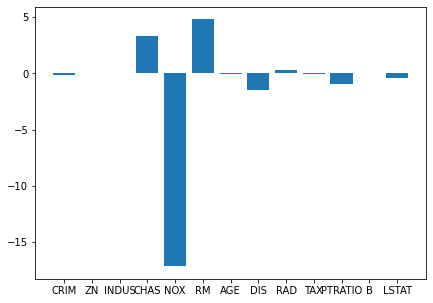

In [19]:
plt.figure(figsize=(7,5))
plt.bar(boston.feature_names,lm.coef_)
plt.show

In [20]:
#predict the value
pred=lm.predict(x_test)
print('Predicted result price:',pred)
print('actual price',y_test)

Predicted result price: [15.84192559 32.20569827 24.42230605 30.84928633 27.31927564 19.65311852
 23.05432432 31.7229619  32.45933432 22.63205367 24.91948411 27.15339443
 20.16729816 27.95837435 32.02171343 10.19889234 36.05901216 14.96179519
 11.66767994 15.55657875 35.22194463 22.20185653 38.8142947  20.4290284
 28.49163796 19.08044635 24.02797912 20.78907881 19.65030776 26.41697272
 14.14117934 25.89121978 17.77544803  8.02793933 32.83228276 19.02926719
 12.35104367 27.13926668 22.64549403 18.75190375 23.67614267 25.19654715
 37.31343761 21.2740326  32.30876439 20.32537386  7.41789113 28.06144027
 36.28142462 21.53339694 28.92419026 23.82647841  7.34739041 24.23067937
  6.12843722 21.90316166 18.29285279 13.19056989  5.99004693 30.08061674
 12.37541899 17.83046748 18.15297944 19.08005857 42.19993227 22.50076808
 20.52857282 23.9328331  25.64429237 27.51546185 29.74089548 19.64560651
 24.62720513 22.8048752  30.94928878 13.76556158 17.76806882 20.21873241
 16.61941218 17.13960152  2.

In [21]:
print('error:')
print(mean_squared_error(pred,y_test))

error:
27.42072820908459


# L1 and L2 Regularization

L1 ---Lasso Regression
L2 ---Ridge Regression

In [22]:
from sklearn.linear_model import Lasso,Ridge

In [23]:
# x_train,x_test,y_train,y_test

In [24]:
# will reduce the coefficient to zero (those features are not information)
# alpha value could be -----.0001,.001,.01,.1,1,10-----higher values reduce all coefficient towards 0 and impact output
# default value of alpha = 1.0
# alpha = .01
ls=Lasso(alpha=0.0001)
#ls=Lasso(alpha=1.0) # default
ls.fit(x_train,y_train)
ls.score(x_train,y_train)

0.7665529400345414

In [25]:
ls.coef_

array([-1.10824693e-01,  3.67066154e-02,  8.58729659e-03,  3.32038457e+00,
       -1.71509902e+01,  4.81528448e+00, -1.38318082e-02, -1.44099502e+00,
        2.63304303e-01, -1.17526095e-02, -9.24709393e-01,  9.07325563e-03,
       -4.12162696e-01])

In [26]:
# try to minimize the coefficient variance
rd=Ridge(alpha=0.0001)
#rd=Ridge()
rd.fit(x_train,y_train)
rd.score(x_train,y_train)

0.7665529828886577

In [27]:
ls.coef_

array([-1.10824693e-01,  3.67066154e-02,  8.58729659e-03,  3.32038457e+00,
       -1.71509902e+01,  4.81528448e+00, -1.38318082e-02, -1.44099502e+00,
        2.63304303e-01, -1.17526095e-02, -9.24709393e-01,  9.07325563e-03,
       -4.12162696e-01])

In [28]:
# ElasticNet is a combination of both Lasso and Ridge
from sklearn.linear_model import ElasticNet
enr=ElasticNet(alpha=0.0001)
#enr=ElasticNet()
enr.fit(x_train,y_train)
enrpred=enr.predict(x_test)
print(enr.score(x_train,y_train))

0.7665498739655398


In [34]:
# Support vector Regression
# manually
from sklearn.svm import SVR

svr=SVR(kernel='linear')
svr.fit(x_train,y_train)
svr.score(x_train,y_train)
pred_y=svr.predict(x_test)
print(svr.score(x_train,y_train))

svr=SVR(kernel='poly')
svr.fit(x_train,y_train)
svr.score(x_train,y_train)
pred_y=svr.predict(x_test)
print(svr.score(x_train,y_train))

svr=SVR(kernel='rbf')
svr.fit(x_train,y_train)
svr.score(x_train,y_train)
pred_y=svr.predict(x_test)
print(svr.score(x_train,y_train))

0.7390428007452163
0.21984205036201276
0.22924996554545518


In [32]:
# single list
from sklearn.svm import SVR
kernellist=['linear','poly','rbf']
for i in kernellist:
    sv=SVR(kernel=i)
    sv.fit(x_train,y_train)
    print(sv.score(x_train,y_train))
    

0.7390428007452163
0.21984205036201276
0.22924996554545518


In [35]:
#KNeighbors Regression
from sklearn.neighbors import KNeighborsRegressor
knr=KNeighborsRegressor()
knr.fit(x_train,y_train)
knr.score(x_train,y_train)
predknr=knr.predict(x_test)
print(predknr)

knr.score(x_test,y_test)


[23.76 38.74 20.   34.96 22.76 16.42 17.14 42.44 25.86 21.72 25.26 32.88
 17.96 21.1  18.66 18.42 24.82 20.32 22.5  17.42 26.82 20.9  39.94 12.7
 28.52 11.68 24.2  21.42 20.04 23.78 19.3  25.98 22.26 10.64 30.36 23.5
 12.62 23.18 21.58 24.08 26.06 22.02 38.96 22.38 39.16 25.64 15.46 22.64
 41.88 23.7  25.28 22.98 23.1  22.32 11.42 24.9  21.04 12.14 15.06 27.88
 13.46 21.92 23.1  15.8  38.74 19.68 22.88 21.42 29.22 18.54 22.14 17.14
 20.2  25.7  27.88 13.18 18.4  21.18 15.8  15.6  14.5  34.96 24.76 19.24
 25.68 17.08 25.6  25.88 20.04 20.2  12.94 18.7  18.42 22.88 23.64 17.36
 31.82 29.92 10.7  19.24 24.76 20.3  20.   11.06 15.8  27.04 21.7  22.8
 23.48 19.68 16.64 12.46 27.88 21.04 12.46 15.96 15.8  23.58 38.74 22.6
 11.08 19.64 24.54 23.82 10.26 20.62 29.22 15.36 25.02 15.8  20.22 11.16
 19.2  24.42 17.14 30.9  20.34 20.44 32.82 12.14 25.6  26.12 11.96 34.76
 27.26 18.68 21.96 12.66 27.94 41.88 23.06 21.66 23.04 11.08 25.64 20.44
 32.38 15.96 22.24 18.18 22.82 22.96 15.3  17.78 23.24 

0.4834542430836335

In [36]:
#Decision Tree Regression
from sklearn.tree import DecisionTreeRegressor
dtr=DecisionTreeRegressor()
dtr.fit(x_train,y_train)
dtrpred=dtr.predict(x_test)
print(dtrpred)

dtr.score(x_test,y_test)

[20.9 31.1 21.5 27.9 23.7 22.3 15.  29.8 21.  21.2 24.8 29.1 18.7 29.8
 23.1 19.9 33.2 17.5  5.  16.6 32.  20.  50.  14.3 21.6 27.5 20.1 20.3
 16.7 22.3 13.9 22.6 19.1 10.5 30.1 19.6 15.6 25.3 19.7 19.6 25.  21.
 50.  21.6 33.8 14.5 14.5 21.  36.5 22.9 24.8 20.1  5.6 20.1 13.8 18.7
 23.1 12.3 10.5 32.  23.2 20.  14.5 22.3 50.  18.5 24.3 28.1 25.  14.5
 20.6 18.4 26.5 21.2 32.  15.2 21.7 27.1 12.5 27.5 10.8 33.4 43.8 20.6
 37.3 13.3 24.8 21.  27.5 22.   9.6 20.4 14.5 19.3 29.  15.2 46.7 33.1
  8.4 21.7 26.6 17.3 18.6 15.6 20.  31.1 18.3 19.9 13.3 19.5 13.9 21.2
 37.3 20.3 10.4 20.  23.8 19.8 46.7 19.4 12.3 16.2 28.4 20.1 10.8 18.9
 37.2  8.8 31.1 17.1 17.5 10.4 19.4 22.5 12.5 33.1 27.5 19.3 19.6 13.4
 35.2 18.7  7.2 18.5 21.9 50.  17.6 15.1 25.  21.  23.4 50.  21.  11.8
 21.  18.5 50.  17.4 24.8 14.  20.2 27.5 16.7 11.8 25.3 32.9 33.1]


0.6455526547891168

In [1]:
import csv
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
from sklearn import metrics

In [38]:
#pd.read?

In [2]:
ds=pd.read_csv('ppp.csv')
ds

,SNo,Name,Age,City,Country,Salary
0,1,Tom,28.0,Toronto,Canada,20000.0
1,2,Lee,31.0,Edmonto,Canada,3900.0
2,3,Dave,34.0,Toronto,Canada,8000.0
3,4,Anik,26.0,HongKong,Asia,66672.0
4,5,kamal,30.0,NaN,America,NaN
5,6,Geet,NaN,HongKong,Asia,30007.0
6,7,Steven,43.0,BayArea,America,8300.0
7,8,Ram,38.0,Hyderabad,Asia,54666.0
8,9,hari,50.0,newyork,America,67666.0
9,11,yami,NaN,newyork,America,8888.0


In [3]:
df=pd.DataFrame(data=ds)
df

,SNo,Name,Age,City,Country,Salary
0,1,Tom,28.0,Toronto,Canada,20000.0
1,2,Lee,31.0,Edmonto,Canada,3900.0
2,3,Dave,34.0,Toronto,Canada,8000.0
3,4,Anik,26.0,HongKong,Asia,66672.0
4,5,kamal,30.0,NaN,America,NaN
5,6,Geet,NaN,HongKong,Asia,30007.0
6,7,Steven,43.0,BayArea,America,8300.0
7,8,Ram,38.0,Hyderabad,Asia,54666.0
8,9,hari,50.0,newyork,America,67666.0
9,11,yami,NaN,newyork,America,8888.0


In [4]:
df.describe()

,SNo,Age,Salary
count,22.000000,19.000000,19.000000
mean,12.090909,32.421053,33739.947368
std,6.927578,7.174924,23151.188084
min,1.000000,22.000000,3900.000000
25%,6.250000,27.000000,8888.000000
50%,12.500000,31.000000,33451.000000
75%,17.750000,36.000000,54666.000000
max,23.000000,50.000000,67666.000000


In [5]:
df.dtypes

SNo          int64
Name        object
Age        float64
City        object
Country     object
Salary     float64
dtype: object

In [6]:
df1=df.drop(['Name'],axis=1)
df1

,SNo,Age,City,Country,Salary
0,1,28.0,Toronto,Canada,20000.0
1,2,31.0,Edmonto,Canada,3900.0
2,3,34.0,Toronto,Canada,8000.0
3,4,26.0,HongKong,Asia,66672.0
4,5,30.0,NaN,America,NaN
5,6,NaN,HongKong,Asia,30007.0
6,7,43.0,BayArea,America,8300.0
7,8,38.0,Hyderabad,Asia,54666.0
8,9,50.0,newyork,America,67666.0
9,11,NaN,newyork,America,8888.0


In [7]:
#df.drop(['Name'],axis=1,implace=True) #it will be changed the original data
#df 

<AxesSubplot:>

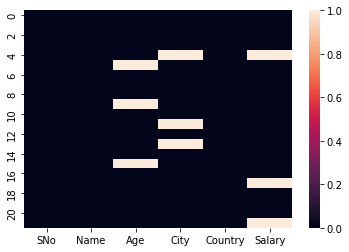

In [7]:
import seaborn as sns
sns.heatmap(df.isnull())

In [8]:
df.isnull().sum()

SNo        0
Name       0
Age        3
City       3
Country    0
Salary     3
dtype: int64

In [9]:
# sklearn.impute SimpleImputer class works for imputting null values in object or categorical data or object data type

from sklearn.impute import SimpleImputer
imp = SimpleImputer(strategy='most_frequent')
df['City']=imp.fit_transform(df['City'].values.reshape(-1,1))
df

,SNo,Name,Age,City,Country,Salary
0,1,Tom,28.0,Toronto,Canada,20000.0
1,2,Lee,31.0,Edmonto,Canada,3900.0
2,3,Dave,34.0,Toronto,Canada,8000.0
3,4,Anik,26.0,HongKong,Asia,66672.0
4,5,kamal,30.0,HongKong,America,NaN
5,6,Geet,NaN,HongKong,Asia,30007.0
6,7,Steven,43.0,BayArea,America,8300.0
7,8,Ram,38.0,Hyderabad,Asia,54666.0
8,9,hari,50.0,newyork,America,67666.0
9,11,yami,NaN,newyork,America,8888.0


In [10]:
import numpy as np
from sklearn.impute import SimpleImputer
imp=SimpleImputer(missing_values=np.nan,strategy='mean')

df['Age']=imp.fit_transform(df['Age'].values.reshape(-1,1))
df['Salary']=imp.fit_transform(df['Salary'].values.reshape(-1,1))

#imputer works for numericals data such as Age and Salary
# from sklearn.preprocessing import Imputer
# imp=Imputer(missing_values= 'NaN',strateegy='mean')
# df['Age']=imp.fit_transform(df['Age'].values.reshape(-1,1))
# df['Salary']=imp.fit_transform(df['Salary'].values.reshape(-1,1))

In [11]:
df['Age'].shape

(22,)

# Encoder

In [12]:
le=LabelEncoder()
df['City']=le.fit_transform(df['City'])   #change city and county into string data

list1=['City','Country']
for val in list1:
    df[val]=le.fit_transform(df[val].astype(str))
    
df   

,SNo,Name,Age,City,Country,Salary
0,1,Tom,28.000000,8,3,20000.000000
1,2,Lee,31.000000,3,3,3900.000000
2,3,Dave,34.000000,8,3,8000.000000
3,4,Anik,26.000000,5,2,66672.000000
4,5,kamal,30.000000,5,1,33739.947368
5,6,Geet,32.421053,5,2,30007.000000
6,7,Steven,43.000000,1,1,8300.000000
7,8,Ram,38.000000,6,2,54666.000000
8,9,hari,50.000000,9,1,67666.000000
9,11,yami,32.421053,9,1,8888.000000


In [13]:
import sklearn

from sklearn.preprocessing import LabelEncoder,OneHotEncoder
import pandas as pd

In [14]:
ds=pd.read_csv('age_salary.csv')
ds

,index,Nation,purchased_item,salary,age
0,0,India,No,66777.0,23.0
1,1,Russia,Yes,87878.0,24.0
2,2,Germany,No,34559.0,NaN
3,3,India,Yes,40000.0,26.0
4,4,Germany,Yes,NaN,21.0
5,5,Russia,No,45000.0,NaN
6,6,Germany,Yes,89993.0,62.0
7,7,India,No,55555.0,24.0
8,8,Russia,Yes,NaN,45.0
9,9,Germany,Yes,67222.0,53.0


In [15]:
ds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10 entries, 0 to 9
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   index           10 non-null     int64  
 1   Nation          10 non-null     object 
 2   purchased_item  10 non-null     object 
 3   salary          8 non-null      float64
 4   age             8 non-null      float64
dtypes: float64(2), int64(1), object(2)
memory usage: 528.0+ bytes


In [16]:
ds.isnull()

,index,Nation,purchased_item,salary,age
0,False,False,False,False,False
1,False,False,False,False,False
2,False,False,False,False,True
3,False,False,False,False,False
4,False,False,False,True,False
5,False,False,False,False,True
6,False,False,False,False,False
7,False,False,False,False,False
8,False,False,False,True,False
9,False,False,False,False,False


In [17]:
ds.isnull().sum()

index             0
Nation            0
purchased_item    0
salary            2
age               2
dtype: int64

In [18]:
ds['age']=ds['age'].fillna((ds['age'].median())) # replace the null value into median
ds

,index,Nation,purchased_item,salary,age
0,0,India,No,66777.0,23.0
1,1,Russia,Yes,87878.0,24.0
2,2,Germany,No,34559.0,25.0
3,3,India,Yes,40000.0,26.0
4,4,Germany,Yes,NaN,21.0
5,5,Russia,No,45000.0,25.0
6,6,Germany,Yes,89993.0,62.0
7,7,India,No,55555.0,24.0
8,8,Russia,Yes,NaN,45.0
9,9,Germany,Yes,67222.0,53.0


In [22]:
import numpy as np
ds['salary']=ds['salary'].fillna((ds['salary'].mean()))
ds

,index,Nation,purchased_item,salary,age
0,0,India,No,66777.0,23.0
1,1,Russia,Yes,87878.0,24.0
2,2,Germany,No,34559.0,25.0
3,3,India,Yes,40000.0,26.0
4,4,Germany,Yes,60873.0,21.0
5,5,Russia,No,45000.0,25.0
6,6,Germany,Yes,89993.0,62.0
7,7,India,No,55555.0,24.0
8,8,Russia,Yes,60873.0,45.0
9,9,Germany,Yes,67222.0,53.0


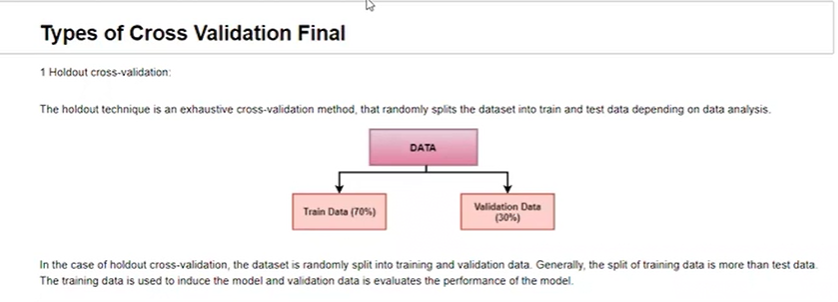

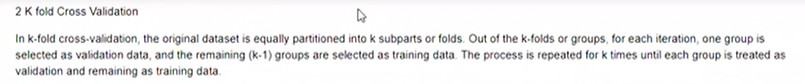

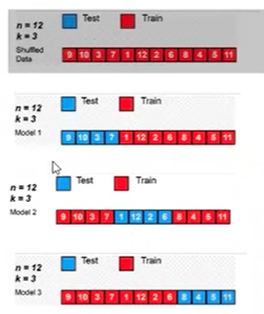

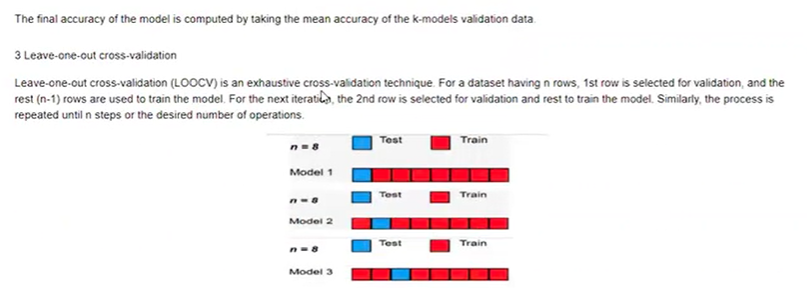

In [3]:
import pandas as pd
from sklearn.datasets import load_iris
import seaborn as sb
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB

from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
import warnings
warnings.filterwarnings('ignore')

In [4]:
iris=load_iris()
iris.keys()

dict_keys(['data', 'target', 'frame', 'target_names', 'DESCR', 'feature_names', 'filename'])

In [5]:
print(iris.data)
print(iris.feature_names)

[[5.1 3.5 1.4 0.2]
 [4.9 3.  1.4 0.2]
 [4.7 3.2 1.3 0.2]
 [4.6 3.1 1.5 0.2]
 [5.  3.6 1.4 0.2]
 [5.4 3.9 1.7 0.4]
 [4.6 3.4 1.4 0.3]
 [5.  3.4 1.5 0.2]
 [4.4 2.9 1.4 0.2]
 [4.9 3.1 1.5 0.1]
 [5.4 3.7 1.5 0.2]
 [4.8 3.4 1.6 0.2]
 [4.8 3.  1.4 0.1]
 [4.3 3.  1.1 0.1]
 [5.8 4.  1.2 0.2]
 [5.7 4.4 1.5 0.4]
 [5.4 3.9 1.3 0.4]
 [5.1 3.5 1.4 0.3]
 [5.7 3.8 1.7 0.3]
 [5.1 3.8 1.5 0.3]
 [5.4 3.4 1.7 0.2]
 [5.1 3.7 1.5 0.4]
 [4.6 3.6 1.  0.2]
 [5.1 3.3 1.7 0.5]
 [4.8 3.4 1.9 0.2]
 [5.  3.  1.6 0.2]
 [5.  3.4 1.6 0.4]
 [5.2 3.5 1.5 0.2]
 [5.2 3.4 1.4 0.2]
 [4.7 3.2 1.6 0.2]
 [4.8 3.1 1.6 0.2]
 [5.4 3.4 1.5 0.4]
 [5.2 4.1 1.5 0.1]
 [5.5 4.2 1.4 0.2]
 [4.9 3.1 1.5 0.2]
 [5.  3.2 1.2 0.2]
 [5.5 3.5 1.3 0.2]
 [4.9 3.6 1.4 0.1]
 [4.4 3.  1.3 0.2]
 [5.1 3.4 1.5 0.2]
 [5.  3.5 1.3 0.3]
 [4.5 2.3 1.3 0.3]
 [4.4 3.2 1.3 0.2]
 [5.  3.5 1.6 0.6]
 [5.1 3.8 1.9 0.4]
 [4.8 3.  1.4 0.3]
 [5.1 3.8 1.6 0.2]
 [4.6 3.2 1.4 0.2]
 [5.3 3.7 1.5 0.2]
 [5.  3.3 1.4 0.2]
 [7.  3.2 4.7 1.4]
 [6.4 3.2 4.5 1.5]
 [6.9 3.1 4.

In [6]:
iris.DESCR

'.. _iris_dataset:\n\nIris plants dataset\n--------------------\n\n**Data Set Characteristics:**\n\n    :Number of Instances: 150 (50 in each of three classes)\n    :Number of Attributes: 4 numeric, predictive attributes and the class\n    :Attribute Information:\n        - sepal length in cm\n        - sepal width in cm\n        - petal length in cm\n        - petal width in cm\n        - class:\n                - Iris-Setosa\n                - Iris-Versicolour\n                - Iris-Virginica\n                \n    :Summary Statistics:\n\n    ============== ==== ==== ======= ===== ====================\n                    Min  Max   Mean    SD   Class Correlation\n    ============== ==== ==== ======= ===== ====================\n    sepal length:   4.3  7.9   5.84   0.83    0.7826\n    sepal width:    2.0  4.4   3.05   0.43   -0.4194\n    petal length:   1.0  6.9   3.76   1.76    0.9490  (high!)\n    petal width:    0.1  2.5   1.20   0.76    0.9565  (high!)\n    ============== ==== =

In [7]:
iris.target

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2])

       0    1    2    3
0    5.1  3.5  1.4  0.2
1    4.9  3.0  1.4  0.2
2    4.7  3.2  1.3  0.2
3    4.6  3.1  1.5  0.2
4    5.0  3.6  1.4  0.2
..   ...  ...  ...  ...
145  6.7  3.0  5.2  2.3
146  6.3  2.5  5.0  1.9
147  6.5  3.0  5.2  2.0
148  6.2  3.4  5.4  2.3
149  5.9  3.0  5.1  1.8

[150 rows x 4 columns]


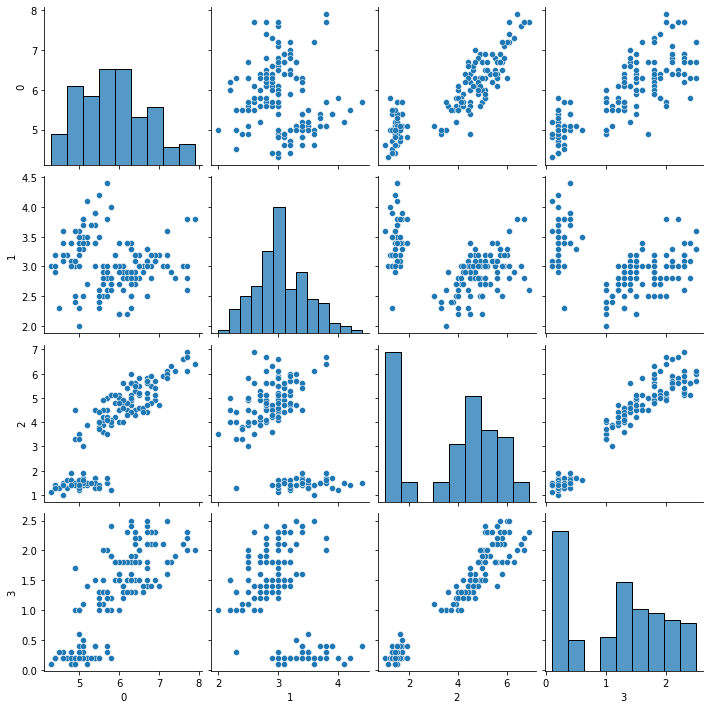

In [8]:
ds=pd.DataFrame(data=iris.data)
print(ds)
sb.pairplot(ds)

In [9]:
x=iris.data
y=iris.target

In [10]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.22,random_state=43)

In [11]:
mnb=MultinomialNB()
mnb.fit(x_train,y_train)
predmnb=mnb.predict(x_test)
print(confusion_matrix(y_test,predmnb))
print(accuracy_score(y_test,predmnb))
print(classification_report(y_test,predmnb))

[[14  0  0]
 [ 0 10  0]
 [ 0  0  9]]
1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        14
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00         9

    accuracy                           1.00        33
   macro avg       1.00      1.00      1.00        33
weighted avg       1.00      1.00      1.00        33



In [12]:
svc=SVC(kernel='rbf')     #kernel='rbf'-----default
svc.fit(x_train,y_train)
svc.score(x_train,y_train)
predsvc=svc.predict(x_test)
print(accuracy_score(y_test,predsvc))
print(confusion_matrix(y_test,predsvc))
print(classification_report(y_test,predsvc))

0.9393939393939394
[[14  0  0]
 [ 0 10  0]
 [ 0  2  7]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        14
           1       0.83      1.00      0.91        10
           2       1.00      0.78      0.88         9

    accuracy                           0.94        33
   macro avg       0.94      0.93      0.93        33
weighted avg       0.95      0.94      0.94        33



In [13]:
#DecisionTreeClassifier(criterian='gini')---------default
#DecisionTreeClassifier(criterian='entropy')
#Gini and entropy
dtc=DecisionTreeClassifier()
dtc.fit(x_train,y_train)
dtc.score(x_train,y_train)
preddtc=dtc.predict(x_test)
print(accuracy_score(y_test,preddtc))
print(confusion_matrix(y_test,preddtc))
print(classification_report(y_test,preddtc))

0.9393939393939394
[[14  0  0]
 [ 0 10  0]
 [ 0  2  7]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        14
           1       0.83      1.00      0.91        10
           2       1.00      0.78      0.88         9

    accuracy                           0.94        33
   macro avg       0.94      0.93      0.93        33
weighted avg       0.95      0.94      0.94        33



In [14]:
#k=10
knn=KNeighborsClassifier()
knn.fit(x_train,y_train)
knn.score(x_train,y_train)
predknn=knn.predict(x_test)
print(accuracy_score(y_test,predknn))
print(confusion_matrix(y_test,predknn))
print(classification_report(y_test,predknn))

1.0
[[14  0  0]
 [ 0 10  0]
 [ 0  0  9]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        14
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00         9

    accuracy                           1.00        33
   macro avg       1.00      1.00      1.00        33
weighted avg       1.00      1.00      1.00        33



In [15]:
from sklearn.model_selection import cross_val_score


score=cross_val_score(mnb,x,y,cv=5)   #score or accuracy,mnb=model,x=input,y=output,cv=cross validation=5
print(score)
print(score.mean())
print(score.std())

[1.         0.96666667 0.9        0.9        1.        ]
0.9533333333333334
0.04521553322083511


In [16]:
score=cross_val_score(svc,x,y,cv=5)  
print(score)
print(score.mean())
print(score.std())

[0.96666667 0.96666667 0.96666667 0.93333333 1.        ]
0.9666666666666666
0.02108185106778919


In [17]:
score=cross_val_score(knn,x,y,cv=5)  
print(score)
print(score.mean())
print(score.std())

[0.96666667 1.         0.93333333 0.96666667 1.        ]
0.9733333333333334
0.02494438257849294


In [42]:
score=cross_val_score(dtc,x,y,cv=5)  
print(score)
print(score.mean())
print(score.std())

[0.96666667 0.96666667 0.9        0.93333333 1.        ]
0.9533333333333334
0.03399346342395189


Prediction

In [18]:
import numpy as np
s=np.array([5.9,3.,5.1,1.8])
s

array([5.9, 3. , 5.1, 1.8])

In [44]:
s.shape

(4,)

In [45]:
s=s.reshape(1,-1)

In [47]:
s.shape

(1, 4)

In [48]:
predvalue=svc.predict(s)
predvalue

array([2])

In [49]:
def testpredict(s):
    s=s.reshape(1,-1)
    print('s.shape is',s.shape)
    predvalue=svc.predict(s)
    print(predvalue)

In [50]:
s=np.array([6.2,3.4,5.4,2.3])
testpredict(s)

s.shape is (1, 4)
[2]


# Saving the best model

First Method

In [20]:
# from sklearn.externals import joblib
import joblib

#save the model as a object file-------serialization
joblib.dump(svc,'svcfile.obj')       #svcfile.obj------created by developer

#load the model from the file----------Deserialization
dtc_from_joblib=joblib.load('svcfile.obj')

#use the loaded model to make predictions

dtc_from_joblib.predict(x_test)

array([0, 0, 1, 1, 2, 0, 2, 1, 1, 1, 0, 1, 2, 0, 1, 1, 0, 0, 2, 2, 0, 0,
       0, 2, 1, 2, 0, 1, 0, 0, 1, 0, 1])

Second Methond

In [21]:
import pickle

filename='pickledtcfile.pkl'
pickle.dump(dtc,open(filename,'wb')) #wb---write binanry
#load the model from disk
loaded_model=pickle.load(open(filename,'rb'))#rb---read binanry

loaded_model.predict(x_test)

array([0, 0, 1, 1, 2, 0, 2, 1, 1, 1, 0, 1, 2, 0, 1, 1, 0, 0, 2, 2, 0, 0,
       0, 2, 1, 2, 0, 1, 0, 0, 1, 0, 1])

In [23]:
#in single step find model

dtc=DecisionTreeClassifier()
sv=SVC()
knn=KNeighborsClassifier()
mnb=MultinomialNB()

model=[dtc,sv,knn,mnb]

for m in model:
    m.fit(x_train,y_train)
    m.score(x_train,y_train)
    predm=m.predict(x_test)
    print('Accuracy score of',m,'is')
    print(accuracy_score(y_test,predm))
    print(confusion_matrix(y_test,predm))
    print(classification_report(y_test,predm))
    print('\n')
    

Accuracy score of DecisionTreeClassifier() is
0.9393939393939394
[[14  0  0]
 [ 0 10  0]
 [ 0  2  7]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        14
           1       0.83      1.00      0.91        10
           2       1.00      0.78      0.88         9

    accuracy                           0.94        33
   macro avg       0.94      0.93      0.93        33
weighted avg       0.95      0.94      0.94        33



Accuracy score of SVC() is
0.9393939393939394
[[14  0  0]
 [ 0 10  0]
 [ 0  2  7]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        14
           1       0.83      1.00      0.91        10
           2       1.00      0.78      0.88         9

    accuracy                           0.94        33
   macro avg       0.94      0.93      0.93        33
weighted avg       0.95      0.94      0.94        33



Accuracy score of KNeighborsClassifier() is
1.0
[

# Scaling Techniques

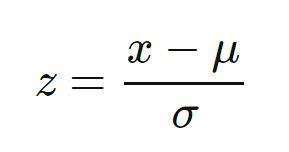

In [4]:
import numpy as np
import pandas as pd
import sklearn
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report

from sklearn.model_selection import train_test_split

import warnings
warnings.filterwarnings('ignore')

In [1]:
from sklearn.datasets import load_breast_cancer

In [2]:
dscancer=load_breast_cancer()

In [5]:
ds=pd.DataFrame(data=dscancer.data,columns=dscancer.feature_names)

In [6]:
ds

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [7]:
x=ds.iloc[:,0:30]

In [8]:
x

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [11]:
ds['target']=pd.DataFrame(data=dscancer.target)

In [12]:
ds

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890,0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902,0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758,0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300,0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,0
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,0
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,0
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,0


In [13]:
y=ds.iloc[:,-1]

In [14]:
y

0      0
1      0
2      0
3      0
4      0
      ..
564    0
565    0
566    0
567    0
568    1
Name: target, Length: 569, dtype: int32

In [15]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=45)

In [16]:
x_train

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
303,10.49,18.61,66.86,334.3,0.10680,0.06678,0.02297,0.01780,0.1482,0.06600,...,11.06,24.54,70.76,375.4,0.1413,0.10440,0.08423,0.06528,0.2213,0.07842
168,17.47,24.68,116.10,984.6,0.10490,0.16030,0.21590,0.10430,0.1538,0.06365,...,23.14,32.33,155.30,1660.0,0.1376,0.38300,0.48900,0.17210,0.2160,0.09300
388,11.27,15.50,73.38,392.0,0.08365,0.11140,0.10070,0.02757,0.1810,0.07252,...,12.04,18.93,79.73,450.0,0.1102,0.28090,0.30210,0.08272,0.2157,0.10430
550,10.86,21.48,68.51,360.5,0.07431,0.04227,0.00000,0.00000,0.1661,0.05948,...,11.66,24.77,74.08,412.3,0.1001,0.07348,0.00000,0.00000,0.2458,0.06592
485,12.45,16.41,82.85,476.7,0.09514,0.15110,0.15440,0.04846,0.2082,0.07325,...,13.78,21.03,97.82,580.6,0.1175,0.40610,0.48960,0.13420,0.3231,0.10340
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15,14.54,27.54,96.73,658.8,0.11390,0.15950,0.16390,0.07364,0.2303,0.07077,...,17.46,37.13,124.10,943.2,0.1678,0.65770,0.70260,0.17120,0.4218,0.13410
377,13.46,28.21,85.89,562.1,0.07517,0.04726,0.01271,0.01117,0.1421,0.05763,...,14.69,35.63,97.11,680.6,0.1108,0.14570,0.07934,0.05781,0.2694,0.07061
163,12.34,22.22,79.85,464.5,0.10120,0.10150,0.05370,0.02822,0.1551,0.06761,...,13.58,28.68,87.36,553.0,0.1452,0.23380,0.16880,0.08194,0.2268,0.09082
544,13.87,20.70,89.77,584.8,0.09578,0.10180,0.03688,0.02369,0.1620,0.06688,...,15.05,24.75,99.17,688.6,0.1264,0.20370,0.13770,0.06845,0.2249,0.08492


In [17]:
y_train

303    1
168    0
388    1
550    1
485    1
      ..
15     0
377    1
163    1
544    1
414    0
Name: target, Length: 398, dtype: int32

In [18]:
from sklearn.preprocessing import StandardScaler

In [20]:
st=StandardScaler()
x=st.fit_transform(x)
x

array([[ 1.09706398, -2.07333501,  1.26993369, ...,  2.29607613,
         2.75062224,  1.93701461],
       [ 1.82982061, -0.35363241,  1.68595471, ...,  1.0870843 ,
        -0.24388967,  0.28118999],
       [ 1.57988811,  0.45618695,  1.56650313, ...,  1.95500035,
         1.152255  ,  0.20139121],
       ...,
       [ 0.70228425,  2.0455738 ,  0.67267578, ...,  0.41406869,
        -1.10454895, -0.31840916],
       [ 1.83834103,  2.33645719,  1.98252415, ...,  2.28998549,
         1.91908301,  2.21963528],
       [-1.80840125,  1.22179204, -1.81438851, ..., -1.74506282,
        -0.04813821, -0.75120669]])

In [21]:
xf=pd.DataFrame(data=x)  
print(xf)
xf.to_csv('cancerstandard.csv')  #x data stored in cancerstandard.csv if we want

           0         1         2         3         4         5         6   \
0    1.097064 -2.073335  1.269934  0.984375  1.568466  3.283515  2.652874   
1    1.829821 -0.353632  1.685955  1.908708 -0.826962 -0.487072 -0.023846   
2    1.579888  0.456187  1.566503  1.558884  0.942210  1.052926  1.363478   
3   -0.768909  0.253732 -0.592687 -0.764464  3.283553  3.402909  1.915897   
4    1.750297 -1.151816  1.776573  1.826229  0.280372  0.539340  1.371011   
..        ...       ...       ...       ...       ...       ...       ...   
564  2.110995  0.721473  2.060786  2.343856  1.041842  0.219060  1.947285   
565  1.704854  2.085134  1.615931  1.723842  0.102458 -0.017833  0.693043   
566  0.702284  2.045574  0.672676  0.577953 -0.840484 -0.038680  0.046588   
567  1.838341  2.336457  1.982524  1.735218  1.525767  3.272144  3.296944   
568 -1.808401  1.221792 -1.814389 -1.347789 -3.112085 -1.150752 -1.114873   

           7         8         9   ...        20        21        22  \
0  

In [22]:
x.mean()  # -6.118909323768877e-16 it means 0

-6.118909323768877e-16

In [23]:
x.std()

1.0

In [24]:
train_x,test_x,train_y,test_y=train_test_split(x,y,test_size=.20,random_state=45)

In [25]:
train_x

array([[-0.67234446,  0.5376343 , -0.71049114, ..., -1.17939473,
        -0.75672612, -1.01498598],
       [-0.73482758, -1.99421473, -0.75126944, ..., -1.02712875,
         0.79148992, -0.53231421],
       [-0.71778673,  1.2101567 , -0.73067434, ..., -1.01190215,
         0.55529395, -0.9141292 ],
       ...,
       [-0.50761623,  0.68191246, -0.49918541, ..., -0.49739543,
        -1.02365992,  0.38093846],
       [-0.07307451,  0.32819826, -0.09057863, ..., -0.70280223,
        -1.05439775,  0.05398513],
       [ 0.28478338,  2.44815641,  0.19528136, ..., -0.74391404,
         0.53749837, -1.23554094]])

In [26]:
test_x

array([[-0.89671568, -0.48627523, -0.83364984, ...,  0.62267307,
        -0.5836236 ,  0.63030964],
       [ 0.89825404,  0.66096886,  0.92393601, ...,  0.58156126,
         0.26894679, -0.50460631],
       [ 1.75597692,  1.80821295,  1.68595471, ...,  0.83889076,
         0.40484036, -0.21921485],
       ...,
       [-0.47353452, -1.50320357, -0.54119942, ..., -1.33699001,
        -1.00424655, -0.75730243],
       [ 0.60571942,  0.60279218,  0.63972362, ..., -0.15083807,
        -0.2665386 , -0.24470612],
       [ 1.75029663, -1.15181643,  1.77657315, ...,  0.72925926,
        -0.86835298, -0.39709962]])

In [27]:
train_y

50     1
313    1
305    1
18     0
8      0
      ..
15     0
377    1
163    1
544    1
414    0
Name: target, Length: 455, dtype: int32

In [28]:
test_y

440    1
262    0
260    0
145    1
504    1
      ..
415    1
246    1
493    1
329    0
4      0
Name: target, Length: 114, dtype: int32

In [30]:
lg=LogisticRegression()

In [31]:
lg.fit(train_x,train_y)

LogisticRegression()

In [33]:
pred=lg.predict(test_x)
print(pred)

[1 0 0 1 1 1 1 1 1 1 1 0 1 1 1 0 1 1 1 1 1 1 1 1 0 1 1 1 0 1 1 1 1 0 1 1 1
 1 0 0 0 1 1 0 1 1 1 0 1 1 1 1 0 1 1 0 1 1 0 1 1 0 1 1 1 1 0 1 1 0 0 0 0 1
 1 0 1 0 1 1 0 0 0 1 0 1 0 1 0 0 0 1 1 1 0 0 0 1 1 1 1 1 0 0 1 0 0 1 1 1 1
 1 0 0]


In [48]:
print('accuracy_score:',accuracy_score(test_y,pred))

accuracy_score: 0.9824561403508771


In [37]:
print(confusion_matrix(test_y,pred))

[[40  2]
 [ 0 72]]


In [38]:
print(classification_report(test_y,pred))

              precision    recall  f1-score   support

           0       1.00      0.95      0.98        42
           1       0.97      1.00      0.99        72

    accuracy                           0.98       114
   macro avg       0.99      0.98      0.98       114
weighted avg       0.98      0.98      0.98       114



<AxesSubplot:>

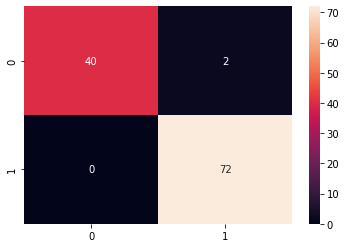

In [39]:
p=confusion_matrix(test_y,pred)
sns.heatmap(p,annot=True)

MinMax Scaler

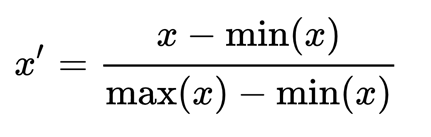

In [42]:
from sklearn.preprocessing import MinMaxScaler

st=MinMaxScaler()
x=st.fit_transform(x)
x

array([[0.52103744, 0.0226581 , 0.54598853, ..., 0.91202749, 0.59846245,
        0.41886396],
       [0.64314449, 0.27257355, 0.61578329, ..., 0.63917526, 0.23358959,
        0.22287813],
       [0.60149557, 0.3902604 , 0.59574321, ..., 0.83505155, 0.40370589,
        0.21343303],
       ...,
       [0.45525108, 0.62123774, 0.44578813, ..., 0.48728522, 0.12872068,
        0.1519087 ],
       [0.64456434, 0.66351031, 0.66553797, ..., 0.91065292, 0.49714173,
        0.45231536],
       [0.03686876, 0.50152181, 0.02853984, ..., 0.        , 0.25744136,
        0.10068215]])

In [43]:
sf=pd.DataFrame(data=x)
print(sf)

sf.to_csv('cancerMinMax.csv')

           0         1         2         3         4         5         6   \
0    0.521037  0.022658  0.545989  0.363733  0.593753  0.792037  0.703140   
1    0.643144  0.272574  0.615783  0.501591  0.289880  0.181768  0.203608   
2    0.601496  0.390260  0.595743  0.449417  0.514309  0.431017  0.462512   
3    0.210090  0.360839  0.233501  0.102906  0.811321  0.811361  0.565604   
4    0.629893  0.156578  0.630986  0.489290  0.430351  0.347893  0.463918   
..        ...       ...       ...       ...       ...       ...       ...   
564  0.690000  0.428813  0.678668  0.566490  0.526948  0.296055  0.571462   
565  0.622320  0.626987  0.604036  0.474019  0.407782  0.257714  0.337395   
566  0.455251  0.621238  0.445788  0.303118  0.288165  0.254340  0.216753   
567  0.644564  0.663510  0.665538  0.475716  0.588336  0.790197  0.823336   
568  0.036869  0.501522  0.028540  0.015907  0.000000  0.074351  0.000000   

           7         8         9   ...        20        21        22  \
0  

In [44]:
train_x,test_x,train_y,test_y=train_test_split(x,y,test_size=.20,random_state=45)

In [45]:
lg.fit(train_x,train_y)

print('accuracy_score:',accuracy_score(test_y,pred))

accuracy_score: 0.9824561403508771


In [46]:
print(confusion_matrix(test_y,pred))

[[40  2]
 [ 0 72]]


In [ ]:
p=np.array([])
cancerpredict(p)

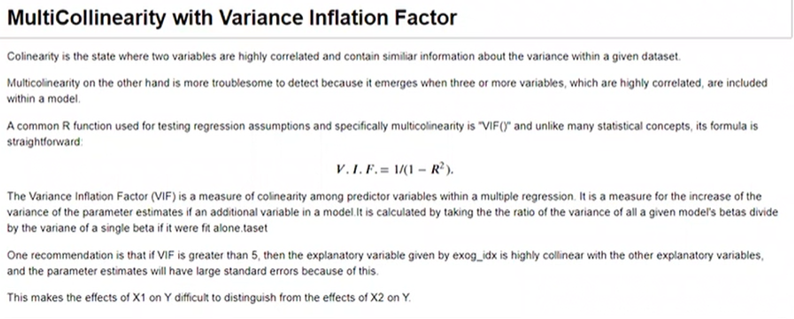

In [1]:
import numpy as np
import pandas as pd

In [20]:
data=pd.read_csv('abalone.csv')

In [21]:
data

,Sex,Length,Diameter,Height,Whole weight,Shucked weight,Viscera weight,Shell weight,Rings(Age)
0,M,0.455,0.365,0.095,0.5140,0.2245,0.1010,0.1500,15
1,M,0.350,0.265,0.090,0.2255,0.0995,0.0485,0.0700,7
2,F,0.530,0.420,0.135,0.6770,0.2565,0.1415,0.2100,9
3,M,0.440,0.365,0.125,0.5160,0.2155,0.1140,0.1550,10
4,I,0.330,0.255,0.080,0.2050,0.0895,0.0395,0.0550,7
...,...,...,...,...,...,...,...,...,...
4172,F,0.565,0.450,0.165,0.8870,0.3700,0.2390,0.2490,11
4173,M,0.590,0.440,0.135,0.9660,0.4390,0.2145,0.2605,10
4174,M,0.600,0.475,0.205,1.1760,0.5255,0.2875,0.3080,9
4175,F,0.625,0.485,0.150,1.0945,0.5310,0.2610,0.2960,10


In [22]:
data.keys()

Index(['Sex', 'Length', 'Diameter', 'Height', 'Whole weight', 'Shucked weight',
       'Viscera weight', 'Shell weight', 'Rings(Age)'],
      dtype='object')

In [23]:
df1=pd.DataFrame(data=data)

In [24]:
df1.shape

(4177, 9)

In [25]:
df1.corr()

,Length,Diameter,Height,Whole weight,Shucked weight,Viscera weight,Shell weight,Rings(Age)
Length,1.000000,0.986812,0.827554,0.925261,0.897914,0.903018,0.897706,0.556720
Diameter,0.986812,1.000000,0.833684,0.925452,0.893162,0.899724,0.905330,0.574660
Height,0.827554,0.833684,1.000000,0.819221,0.774972,0.798319,0.817338,0.557467
Whole weight,0.925261,0.925452,0.819221,1.000000,0.969405,0.966375,0.955355,0.540390
Shucked weight,0.897914,0.893162,0.774972,0.969405,1.000000,0.931961,0.882617,0.420884
Viscera weight,0.903018,0.899724,0.798319,0.966375,0.931961,1.000000,0.907656,0.503819
Shell weight,0.897706,0.905330,0.817338,0.955355,0.882617,0.907656,1.000000,0.627574
Rings(Age),0.556720,0.574660,0.557467,0.540390,0.420884,0.503819,0.627574,1.000000


<AxesSubplot:>

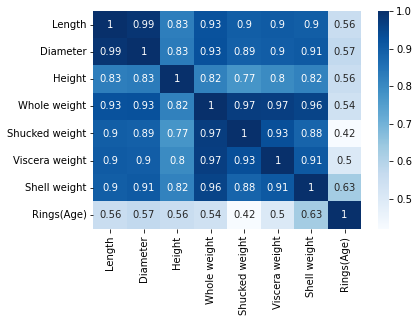

In [26]:
import seaborn as sns
sns.heatmap(df1.corr(),cmap='Blues',annot=True)

In [27]:
df1

,Sex,Length,Diameter,Height,Whole weight,Shucked weight,Viscera weight,Shell weight,Rings(Age)
0,M,0.455,0.365,0.095,0.5140,0.2245,0.1010,0.1500,15
1,M,0.350,0.265,0.090,0.2255,0.0995,0.0485,0.0700,7
2,F,0.530,0.420,0.135,0.6770,0.2565,0.1415,0.2100,9
3,M,0.440,0.365,0.125,0.5160,0.2155,0.1140,0.1550,10
4,I,0.330,0.255,0.080,0.2050,0.0895,0.0395,0.0550,7
...,...,...,...,...,...,...,...,...,...
4172,F,0.565,0.450,0.165,0.8870,0.3700,0.2390,0.2490,11
4173,M,0.590,0.440,0.135,0.9660,0.4390,0.2145,0.2605,10
4174,M,0.600,0.475,0.205,1.1760,0.5255,0.2875,0.3080,9
4175,F,0.625,0.485,0.150,1.0945,0.5310,0.2610,0.2960,10


In [28]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
df1['Sex']=le.fit_transform(df1['Sex'])   #change sex into string data
list1=['Sex']
for val in list1:
    df1[val]=le.fit_transform(df1[val].astype(str))
    
df1  

,Sex,Length,Diameter,Height,Whole weight,Shucked weight,Viscera weight,Shell weight,Rings(Age)
0,2,0.455,0.365,0.095,0.5140,0.2245,0.1010,0.1500,15
1,2,0.350,0.265,0.090,0.2255,0.0995,0.0485,0.0700,7
2,0,0.530,0.420,0.135,0.6770,0.2565,0.1415,0.2100,9
3,2,0.440,0.365,0.125,0.5160,0.2155,0.1140,0.1550,10
4,1,0.330,0.255,0.080,0.2050,0.0895,0.0395,0.0550,7
...,...,...,...,...,...,...,...,...,...
4172,0,0.565,0.450,0.165,0.8870,0.3700,0.2390,0.2490,11
4173,2,0.590,0.440,0.135,0.9660,0.4390,0.2145,0.2605,10
4174,2,0.600,0.475,0.205,1.1760,0.5255,0.2875,0.3080,9
4175,0,0.625,0.485,0.150,1.0945,0.5310,0.2610,0.2960,10


In [29]:
x1=df1.iloc[:,:-1]
y1=df1.iloc[:,-1]

In [30]:
x1

,Sex,Length,Diameter,Height,Whole weight,Shucked weight,Viscera weight,Shell weight
0,2,0.455,0.365,0.095,0.5140,0.2245,0.1010,0.1500
1,2,0.350,0.265,0.090,0.2255,0.0995,0.0485,0.0700
2,0,0.530,0.420,0.135,0.6770,0.2565,0.1415,0.2100
3,2,0.440,0.365,0.125,0.5160,0.2155,0.1140,0.1550
4,1,0.330,0.255,0.080,0.2050,0.0895,0.0395,0.0550
...,...,...,...,...,...,...,...,...
4172,0,0.565,0.450,0.165,0.8870,0.3700,0.2390,0.2490
4173,2,0.590,0.440,0.135,0.9660,0.4390,0.2145,0.2605
4174,2,0.600,0.475,0.205,1.1760,0.5255,0.2875,0.3080
4175,0,0.625,0.485,0.150,1.0945,0.5310,0.2610,0.2960


In [31]:
y1

0       15
1        7
2        9
3       10
4        7
        ..
4172    11
4173    10
4174     9
4175    10
4176    12
Name: Rings(Age), Length: 4177, dtype: int64

In [32]:
x1.shape

(4177, 8)

In [15]:
# display column------shape(rows,column)----  (4177,8)

x1.shape[1]  # 8 number of columns [1] means all columns

8

In [16]:
import statsmodels.api as sm
from scipy import stats
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [34]:
def calc_vif(x1):
    vif=pd.DataFrame()
    vif['variables']=x1.columns
    vif['VIF FACTOR']=[variance_inflation_factor(x1.values,i) for i in range(x1.shape[1])]
    return(vif)

In [35]:
x1.shape

(4177, 8)

In [36]:
calc_vif(x1)

,variables,VIF FACTOR
0,Sex,2.555356
1,Length,700.488988
2,Diameter,749.121626
3,Height,42.128924
4,Whole weight,421.652484
5,Shucked weight,101.674946
6,Viscera weight,63.585627
7,Shell weight,81.873737


In [37]:
x1=df1.drop(['Length'],axis=1)  #drop 

In [38]:
calc_vif(x1) #New Calculated VIF

,variables,VIF FACTOR
0,Sex,2.545465
1,Diameter,62.345278
2,Height,42.686825
3,Whole weight,435.305438
4,Shucked weight,117.303502
5,Viscera weight,64.541685
6,Shell weight,81.720804
7,Rings(Age),21.594824


In [39]:
x1=df1.drop(['Length','Whole weight'],axis=1)

In [40]:
calc_vif(x1)

,variables,VIF FACTOR
0,Sex,2.543582
1,Diameter,61.454335
2,Height,42.674117
3,Shucked weight,35.562914
4,Viscera weight,38.331831
5,Shell weight,30.867436
6,Rings(Age),20.891858


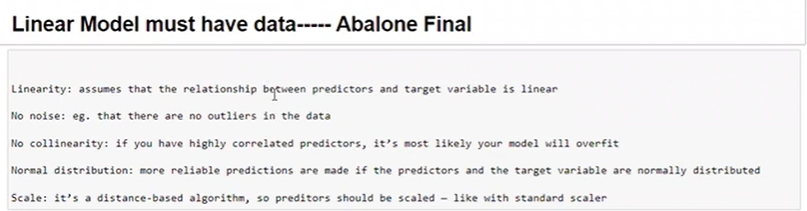

In [1]:

import pandas as pd
import numpy as np
import scipy
import sklearn
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error,r2_score

import warnings
warnings.filterwarnings('ignore')


In [43]:
# pandas.read_csv?

In [42]:
df=pd.read_csv('abalone.csv')
df.head(3)

,Sex,Length,Diameter,Height,Whole weight,Shucked weight,Viscera weight,Shell weight,Rings(Age)
0,M,0.455,0.365,0.095,0.5140,0.2245,0.1010,0.15,15
1,M,0.350,0.265,0.090,0.2255,0.0995,0.0485,0.07,7
2,F,0.530,0.420,0.135,0.6770,0.2565,0.1415,0.21,9


In [126]:
df.sample(3)

,Sex,Length,Diameter,Height,Whole weight,Shucked weight,Viscera weight,Shell weight,Rings(Age)
2542,F,0.695,0.53,0.200,2.0475,0.7500,0.4195,0.6095,14
1196,F,0.710,0.56,0.180,1.6520,0.7350,0.3810,0.4525,11
2229,M,0.370,0.28,0.095,0.2225,0.0805,0.0510,0.0750,7


In [127]:
df.tail(3)

,Sex,Length,Diameter,Height,Whole weight,Shucked weight,Viscera weight,Shell weight,Rings(Age)
4174,M,0.600,0.475,0.205,1.1760,0.5255,0.2875,0.308,9
4175,F,0.625,0.485,0.150,1.0945,0.5310,0.2610,0.296,10
4176,M,0.710,0.555,0.195,1.9485,0.9455,0.3765,0.495,12


In [43]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
df['Sex']=le.fit_transform(df['Sex'])   #change sex into string data
df

,Sex,Length,Diameter,Height,Whole weight,Shucked weight,Viscera weight,Shell weight,Rings(Age)
0,2,0.455,0.365,0.095,0.5140,0.2245,0.1010,0.1500,15
1,2,0.350,0.265,0.090,0.2255,0.0995,0.0485,0.0700,7
2,0,0.530,0.420,0.135,0.6770,0.2565,0.1415,0.2100,9
3,2,0.440,0.365,0.125,0.5160,0.2155,0.1140,0.1550,10
4,1,0.330,0.255,0.080,0.2050,0.0895,0.0395,0.0550,7
...,...,...,...,...,...,...,...,...,...
4172,0,0.565,0.450,0.165,0.8870,0.3700,0.2390,0.2490,11
4173,2,0.590,0.440,0.135,0.9660,0.4390,0.2145,0.2605,10
4174,2,0.600,0.475,0.205,1.1760,0.5255,0.2875,0.3080,9
4175,0,0.625,0.485,0.150,1.0945,0.5310,0.2610,0.2960,10


In [15]:
df.dtypes

Sex                 int32
Length            float64
Diameter          float64
Height            float64
Whole weight      float64
Shucked weight    float64
Viscera weight    float64
Shell weight      float64
Rings(Age)          int64
dtype: object

In [16]:
df=pd.DataFrame(data=df)
df

,Sex,Length,Diameter,Height,Whole weight,Shucked weight,Viscera weight,Shell weight,Rings(Age)
0,2,0.455,0.365,0.555176,0.5140,0.2245,0.1010,0.1500,15
1,2,0.350,0.265,0.547723,0.2255,0.0995,0.0485,0.0700,7
2,0,0.530,0.420,0.606155,0.6770,0.2565,0.1415,0.2100,9
3,2,0.440,0.365,0.594604,0.5160,0.2155,0.1140,0.1550,10
4,1,0.330,0.255,0.531830,0.2050,0.0895,0.0395,0.0550,7
...,...,...,...,...,...,...,...,...,...
4172,0,0.565,0.450,0.637340,0.8870,0.3700,0.2390,0.2490,11
4173,2,0.590,0.440,0.606155,0.9660,0.4390,0.2145,0.2605,10
4174,2,0.600,0.475,0.672881,1.1760,0.5255,0.2875,0.3080,9
4175,0,0.625,0.485,0.622333,1.0945,0.5310,0.2610,0.2960,10


In [17]:
df.shape

(4177, 9)

In [18]:
df.isnull().sum()

Sex               0
Length            0
Diameter          0
Height            0
Whole weight      0
Shucked weight    0
Viscera weight    0
Shell weight      0
Rings(Age)        0
dtype: int64

<AxesSubplot:>

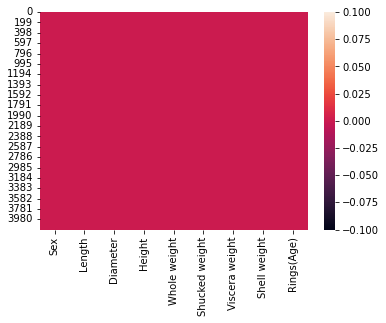

In [104]:
sns.heatmap(df.isnull())

<AxesSubplot:xlabel='Diameter', ylabel='Density'>

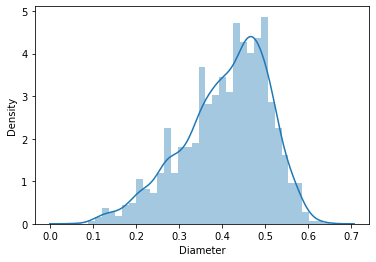

In [56]:
sns.distplot(df['Diameter'])

<AxesSubplot:xlabel='Shell weight', ylabel='Density'>

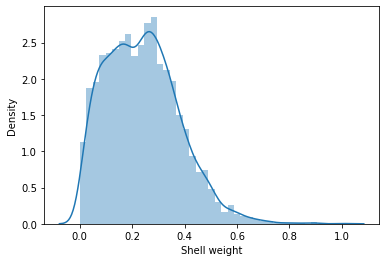

In [57]:
sns.distplot(df['Shell weight'])

In [97]:
df.columns

Index(['Sex', 'Length', 'Diameter', 'Height', 'Whole weight', 'Shucked weight',
       'Viscera weight', 'Shell weight', 'Rings(Age)'],
      dtype='object')

In [19]:
df.iloc[:,0]

0       2
1       2
2       0
3       2
4       1
       ..
4172    0
4173    2
4174    2
4175    0
4176    2
Name: Sex, Length: 4177, dtype: int32

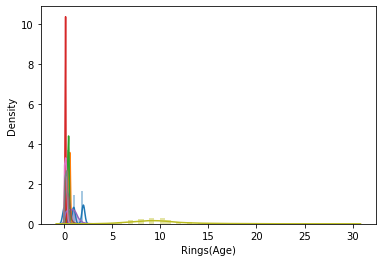

In [106]:
for i in df.columns:
    sns.distplot(df[i])

<AxesSubplot:xlabel='Height', ylabel='Density'>

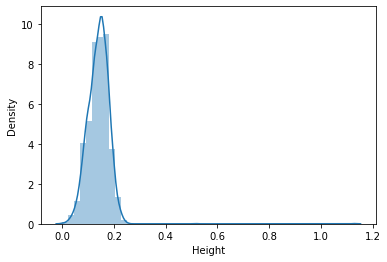

In [65]:
sns.distplot(df['Height'])

<AxesSubplot:xlabel='Height', ylabel='Count'>

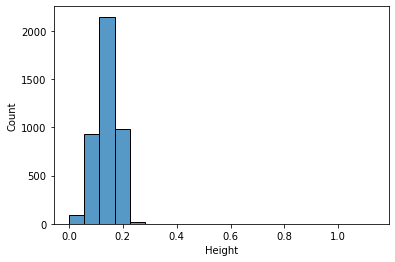

In [66]:
sns.histplot(df['Height'],bins=20)

<AxesSubplot:xlabel='Rings(Age)', ylabel='Count'>

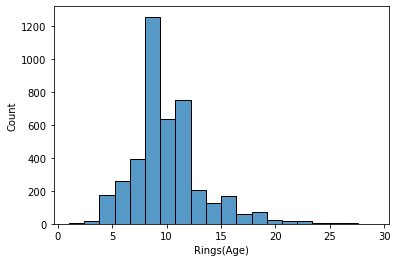

In [67]:
sns.histplot(df['Rings(Age)'],bins=20)

In [68]:
sns.kdeplot?

<AxesSubplot:xlabel='Whole weight', ylabel='Density'>

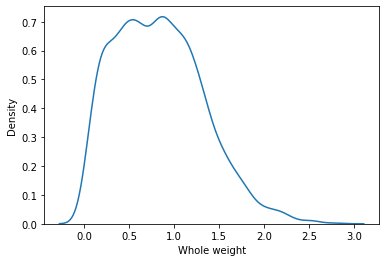

In [69]:
sns.kdeplot(df['Whole weight'])

In [70]:
sns.regplot?

<AxesSubplot:xlabel='Shell weight', ylabel='Height'>

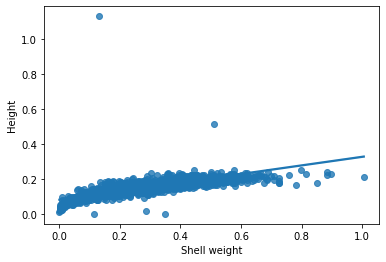

In [71]:
sns.regplot(x='Shell weight',y='Height',data=df)

<AxesSubplot:xlabel='Rings(Age)', ylabel='Diameter'>

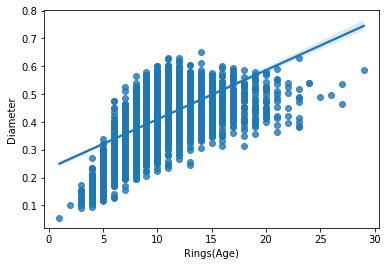

In [72]:
sns.regplot(x='Rings(Age)',y='Diameter',data=df)

<AxesSubplot:xlabel='Whole weight', ylabel='Diameter'>

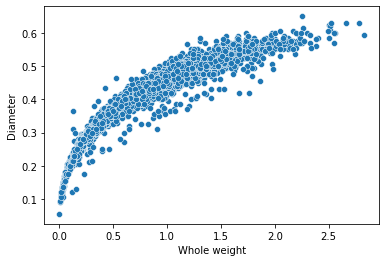

In [73]:
sns.scatterplot(x='Whole weight',y='Diameter',data=df)

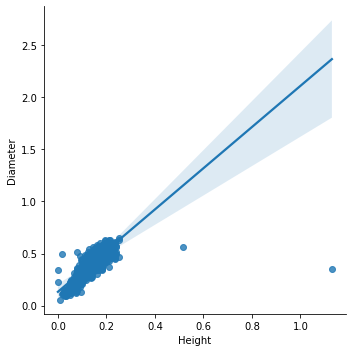

In [80]:
d=sns.lmplot(x='Height',y='Diameter',data=df)

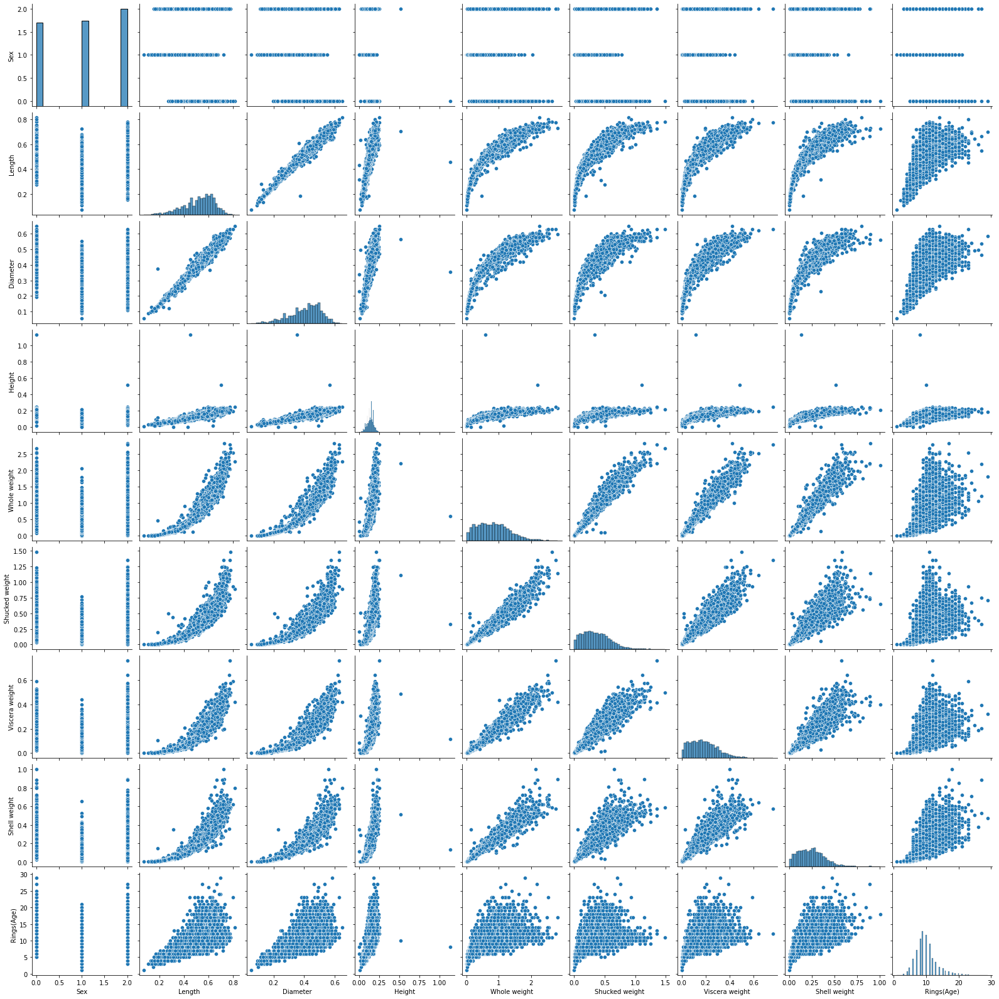

In [81]:
sns.pairplot(df)

In [32]:
df.describe()

,Sex,Length,Diameter,Height,Whole weight,Shucked weight,Viscera weight,Shell weight,Rings(Age)
count,4177.000000,4177.000000,4177.000000,4177.000000,4177.000000,4177.000000,4177.000000,4177.000000,4177.000000
mean,0.838621,0.718405,0.633180,0.881324,0.863197,0.566582,0.402094,0.464496,3.112643
std,0.591361,0.088813,0.083466,0.026301,0.289228,0.195860,0.137545,0.151921,0.495171
min,0.000000,0.273861,0.234521,0.000000,0.044721,0.031623,0.022361,0.038730,1.000000
25%,0.000000,0.670820,0.591608,0.873562,0.664455,0.431277,0.305778,0.360555,2.828427
50%,1.000000,0.738241,0.651920,0.884368,0.894148,0.579655,0.413521,0.483735,3.000000
75%,1.414214,0.784219,0.692820,0.893496,1.073778,0.708520,0.502991,0.573585,3.316625
max,1.414214,0.902774,0.806226,1.007668,1.680922,1.219836,0.871780,1.002497,5.385165


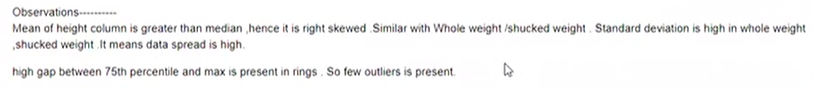

In [20]:
df.skew()

Sex              -0.098155
Length           -0.639873
Diameter         -0.609198
Height           -1.604618
Whole weight      0.530959
Shucked weight    0.719098
Viscera weight    0.591852
Shell weight      0.620927
Rings(Age)        1.114102
dtype: float64

In [21]:
import numpy as np
#df['Height']=np.log(df['Height'])

df['Height']=np.sqrt(df['Height'])
df.skew()

Sex              -0.098155
Length           -0.639873
Diameter         -0.609198
Height           -5.751077
Whole weight      0.530959
Shucked weight    0.719098
Viscera weight    0.591852
Shell weight      0.620927
Rings(Age)        1.114102
dtype: float64

In [22]:
df=np.sqrt(df)
df.skew()

Sex               -0.548920
Length            -1.020771
Diameter          -0.996014
Height           -18.393156
Whole weight      -0.236646
Shucked weight    -0.141443
Viscera weight    -0.183321
Shell weight      -0.222772
Rings(Age)         0.471366
dtype: float64

<AxesSubplot:xlabel='Height', ylabel='Count'>

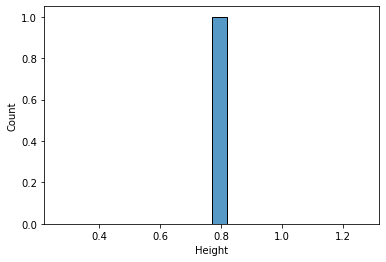

In [88]:
sns.histplot(df['Height'],bins=20)

In [23]:
#detecting the outliers

from scipy.stats import zscore
dfzscore=np.abs(zscore(df))
print(np.where(dfzscore>3))


(array([ 148,  148,  149,  149,  163,  166,  232,  236,  236,  236,  236,
        237,  237,  238,  238,  239,  239,  270,  275,  294,  305,  305,
        306,  306,  313,  314,  321,  321,  351,  433,  465,  465,  480,
        501,  523,  523,  525,  525,  526,  526,  611,  611,  674,  675,
        678,  694,  694,  694,  696,  696,  718,  718,  719,  719,  719,
        719,  720,  720,  720,  891,  892,  898, 1053, 1053, 1054, 1055,
       1055, 1056, 1174, 1209, 1210, 1257, 1429, 1429, 1528, 1763, 1763,
       1824, 1824, 1986, 1986, 1987, 1987, 1987, 2051, 2108, 2108, 2114,
       2114, 2115, 2115, 2161, 2169, 2169, 2169, 2171, 2171, 2201, 2209,
       2305, 2334, 2335, 2343, 2343, 2371, 2371, 2380, 2380, 2381, 2381,
       2381, 2436, 2458, 2458, 2711, 2711, 3141, 3141, 3143, 3149, 3190,
       3190, 3190, 3280, 3318, 3318, 3380, 3380, 3472, 3472, 3600, 3600,
       3716, 3837, 3837, 3899, 3899, 3902, 3902, 3902, 3994, 3994, 3996],
      dtype=int64), array([1, 2, 1, 2, 7, 7, 8, 1

In [33]:
dfnew=df[(dfzscore<3).all(axis=1)]
print('dfnew.shape=',dfnew.shape) 

df=dfnew

dfnew.shape= (4092, 9)


In [34]:
df.corr()

,Sex,Length,Diameter,Height,Whole weight,Shucked weight,Viscera weight,Shell weight,Rings(Age)
Sex,1.000000,-0.156899,-0.162651,-0.162761,-0.154799,-0.133407,-0.164280,-0.162081,-0.130958
Length,-0.156899,1.000000,0.987917,0.913247,0.964482,0.945619,0.944931,0.946329,0.591311
Diameter,-0.162651,0.987917,1.000000,0.917732,0.962592,0.939474,0.940572,0.950921,0.609125
Height,-0.162761,0.913247,0.917732,1.000000,0.912919,0.874944,0.896778,0.917088,0.637377
Whole weight,-0.154799,0.964482,0.962592,0.912919,1.000000,0.977985,0.975504,0.971027,0.598352
Shucked weight,-0.133407,0.945619,0.939474,0.874944,0.977985,1.000000,0.948531,0.921372,0.501027
Viscera weight,-0.164280,0.944931,0.940572,0.896778,0.975504,0.948531,1.000000,0.938881,0.575130
Shell weight,-0.162081,0.946329,0.950921,0.917088,0.971027,0.921372,0.938881,1.000000,0.667489
Rings(Age),-0.130958,0.591311,0.609125,0.637377,0.598352,0.501027,0.575130,0.667489,1.000000


<AxesSubplot:>

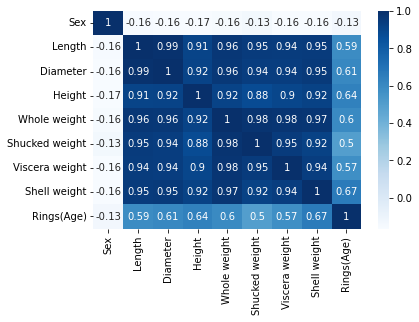

In [114]:
sns.heatmap(df.corr(),cmap='Blues',annot=True)

In [35]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [36]:
x=df.iloc[:,0:-1]

In [37]:
x

,Sex,Length,Diameter,Height,Whole weight,Shucked weight,Viscera weight,Shell weight
0,1.414214,0.674537,0.604152,0.863193,0.716938,0.473814,0.317805,0.387298
1,1.414214,0.591608,0.514782,0.860281,0.474868,0.315436,0.220227,0.264575
2,0.000000,0.728011,0.648074,0.882360,0.822800,0.506458,0.376165,0.458258
3,1.414214,0.663325,0.604152,0.878126,0.718331,0.464220,0.337639,0.393700
4,1.000000,0.574456,0.504975,0.853971,0.452769,0.299166,0.198746,0.234521
...,...,...,...,...,...,...,...,...
4172,0.000000,0.751665,0.670820,0.893496,0.941807,0.608276,0.488876,0.498999
4173,1.414214,0.768115,0.663325,0.882360,0.982853,0.662571,0.463141,0.510392
4174,1.414214,0.774597,0.689202,0.905701,1.084435,0.724914,0.536190,0.554977
4175,0.000000,0.790569,0.696419,0.888190,1.046184,0.728697,0.510882,0.544059


In [38]:
x.shape

(4092, 8)

In [39]:
x.shape[1]

8

In [44]:
y=df.iloc[:,-1]

In [45]:
y

0       15
1        7
2        9
3       10
4        7
        ..
4172    11
4173    10
4174     9
4175    10
4176    12
Name: Rings(Age), Length: 4177, dtype: int64

In [46]:
def vif_calc():
    vif=pd.DataFrame()
    vif['VIF FACTOR']=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    vif['features']=x.columns
    print(vif)

In [47]:
vif_calc()

    VIF FACTOR        features
0     3.105949             Sex
1  3722.622257          Length
2  3186.726478        Diameter
3   627.956063          Height
4  1584.201924    Whole weight
5   383.106277  Shucked weight
6   238.115613  Viscera weight
7   342.000671    Shell weight


feature engineering-----selection of features/variance/columns

detect outliers/remove

In [48]:
df.drop(['Length','Shucked weight'],axis=1,inplace=True)

In [49]:
df

,Sex,Diameter,Height,Whole weight,Viscera weight,Shell weight,Rings(Age)
0,2,0.365,0.095,0.5140,0.1010,0.1500,15
1,2,0.265,0.090,0.2255,0.0485,0.0700,7
2,0,0.420,0.135,0.6770,0.1415,0.2100,9
3,2,0.365,0.125,0.5160,0.1140,0.1550,10
4,1,0.255,0.080,0.2050,0.0395,0.0550,7
...,...,...,...,...,...,...,...
4172,0,0.450,0.165,0.8870,0.2390,0.2490,11
4173,2,0.440,0.135,0.9660,0.2145,0.2605,10
4174,2,0.475,0.205,1.1760,0.2875,0.3080,9
4175,0,0.485,0.150,1.0945,0.2610,0.2960,10


In [50]:
x=df.iloc[:,:-1]

In [51]:
x

,Sex,Diameter,Height,Whole weight,Viscera weight,Shell weight
0,2,0.365,0.095,0.5140,0.1010,0.1500
1,2,0.265,0.090,0.2255,0.0485,0.0700
2,0,0.420,0.135,0.6770,0.1415,0.2100
3,2,0.365,0.125,0.5160,0.1140,0.1550
4,1,0.255,0.080,0.2050,0.0395,0.0550
...,...,...,...,...,...,...
4172,0,0.450,0.165,0.8870,0.2390,0.2490
4173,2,0.440,0.135,0.9660,0.2145,0.2605
4174,2,0.475,0.205,1.1760,0.2875,0.3080
4175,0,0.485,0.150,1.0945,0.2610,0.2960


In [52]:
x.shape

(4177, 6)

In [53]:
vif_calc()

   VIF FACTOR        features
0    2.532536             Sex
1   46.978990        Diameter
2   41.650431          Height
3  123.993316    Whole weight
4   59.292682  Viscera weight
5   49.403495    Shell weight


<AxesSubplot:>

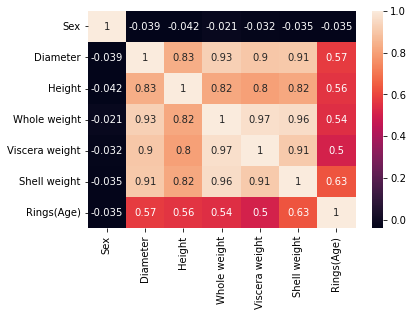

In [159]:
sns.heatmap(df.corr(),annot=True)

In [54]:
x=df.iloc[:,0:-1]

In [55]:
x

,Sex,Diameter,Height,Whole weight,Viscera weight,Shell weight
0,2,0.365,0.095,0.5140,0.1010,0.1500
1,2,0.265,0.090,0.2255,0.0485,0.0700
2,0,0.420,0.135,0.6770,0.1415,0.2100
3,2,0.365,0.125,0.5160,0.1140,0.1550
4,1,0.255,0.080,0.2050,0.0395,0.0550
...,...,...,...,...,...,...
4172,0,0.450,0.165,0.8870,0.2390,0.2490
4173,2,0.440,0.135,0.9660,0.2145,0.2605
4174,2,0.475,0.205,1.1760,0.2875,0.3080
4175,0,0.485,0.150,1.0945,0.2610,0.2960


In [56]:
x.shape

(4177, 6)

In [57]:
y.shape

(4177,)

In [58]:
scale=StandardScaler()
x=scale.fit_transform(x)
x

array([[ 1.15198011, -0.43214879, -1.06442415, -0.64189823, -0.72621157,
        -0.63821689],
       [ 1.15198011, -1.439929  , -1.18397831, -1.23027711, -1.20522124,
        -1.21298732],
       [-1.28068972,  0.12213032, -0.10799087, -0.30946926, -0.35668983,
        -0.20713907],
       ...,
       [ 1.15198011,  0.67640943,  1.56576738,  0.70821206,  0.97541324,
         0.49695471],
       [-1.28068972,  0.77718745,  0.25067161,  0.54199757,  0.73362741,
         0.41073914],
       [ 1.15198011,  1.48263359,  1.32665906,  2.28368063,  1.78744868,
         1.84048058]])

In [59]:
xtrain,xtest,ytrain,ytest=train_test_split(x,y,test_size=.30,random_state=55)

In [60]:
xtrain.shape

(2923, 6)

In [61]:
ytrain.shape

(2923,)

In [62]:
xtest.shape

(1254, 6)

In [63]:
ytest.shape

(1254,)

In [64]:
ir=LinearRegression()
ir.fit(xtrain,ytrain)
ir.coef_

array([ 0.01570564,  0.90236923,  0.44997775, -2.65910799, -0.2842277 ,
        3.66554767])

In [65]:
#pd.DataFrame?

In [73]:
features=['Sex','Diameter','Height','Whole weight','Viscera weight','Shell weight']
list(zip(ir.coef_,features))

[(0.01570564234842386, 'Sex'),
 (0.902369226024518, 'Diameter'),
 (0.44997775271504525, 'Height'),
 (-2.6591079894896863, 'Whole weight'),
 (-0.28422770499507527, 'Viscera weight'),
 (3.665547671674027, 'Shell weight')]

In [74]:
cfdf=pd.DataFrame(data=ir.coef_,index=features)
cfdf

,0
Sex,0.015706
Diameter,0.902369
Height,0.449978
Whole weight,-2.659108
Viscera weight,-0.284228
Shell weight,3.665548


In [75]:
ir.intercept_

9.933995724435169

In [76]:
ir.score(xtrain,ytrain)

0.462821964719886

In [77]:
pred=ir.predict(xtest)
pred

array([ 9.2099225 ,  8.61770017,  8.73854749, ...,  7.80188546,
        9.29680373, 12.71369604])

In [78]:
print('Predicted values',pred)

Predicted values [ 9.2099225   8.61770017  8.73854749 ...  7.80188546  9.29680373
 12.71369604]


In [79]:
preddf=pd.DataFrame(data=pred)
preddf

,0
0,9.209923
1,8.617700
2,8.738547
3,11.175686
4,10.956363
...,...
1249,10.960814
1250,8.580090
1251,7.801885
1252,9.296804


In [80]:
ir.score(xtest,ytest)

0.44662324060474823

In [81]:
print('error:')
print('Mean absolute error:',mean_absolute_error(ytest,pred))
print('Mean squared error:',mean_squared_error(ytest,pred))

print('Root Mean Squared Error:',np.sqrt(mean_squared_error(ytest,pred)))

error:
Mean absolute error: 1.7206561899146018
Mean squared error: 5.7930363079889835
Root Mean Squared Error: 2.4068727236787955


In [82]:
print('R2 score::',r2_score(ytest,pred))

R2 score:: 0.44662324060474823


In [83]:
t=np.array([2,0.365,0.095,0.5140,0.1010,0.1500])
t

array([2.   , 0.365, 0.095, 0.514, 0.101, 0.15 ])

In [84]:
t.shape

(6,)

In [87]:
t=t.reshape(1,-1)

In [88]:
ir.predict(t)

array([9.49186331])

# Regularization

In [89]:
from sklearn.linear_model import Lasso,Ridge,ElasticNet
from sklearn.metrics import r2_score
rdg=Ridge(alpha=.0001,random_state=45)
rdg.fit(xtrain,ytrain)
rdg.score(xtrain,ytrain)

0.4628219647198113

In [90]:
rdg.coef_

array([ 0.01570557,  0.90236877,  0.44997788, -2.65910315, -0.28422959,
        3.66554495])

In [91]:
cfdf=pd.DataFrame(data=ir.coef_,index=features)

In [92]:
cfdf

,0
Sex,0.015706
Diameter,0.902369
Height,0.449978
Whole weight,-2.659108
Viscera weight,-0.284228
Shell weight,3.665548


In [93]:
predict=rdg.predict(xtest)


In [94]:
r2_score(ytest,predict)

0.4466232307279868

In [96]:
iso=Lasso(alpha=.0001,random_state=47)
iso.fit(xtrain,ytrain)
iso.score(xtrain,ytrain)

0.46282190160190406

In [97]:
predict1=iso.predict(xtest)

In [98]:
r2_score(ytest,predict1)

0.44661779257192225

# Approaching more Regressors

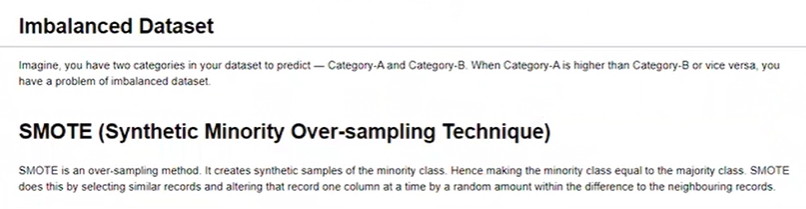

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.linear_model import LogisticRegression

import warnings
warnings.filterwarnings('ignore')

In [2]:
ds=pd.read_csv('pima_indian_diabetes.csv',header=0,names=range(0,8)) # header=change the header name because there is no header data, Range=whatever we want

In [3]:
ds

,0,1,2,3,4,5,6,7
1,85,66,29,0,26.6,0.351,31,0
8,183,64,0,0,23.3,0.672,32,1
1,89,66,23,94,28.1,0.167,21,0
0,137,40,35,168,43.1,2.288,33,1
5,116,74,0,0,25.6,0.201,30,0
...,...,...,...,...,...,...,...,...
10,101,76,48,180,32.9,0.171,63,0
2,122,70,27,0,36.8,0.340,27,0
5,121,72,23,112,26.2,0.245,30,0
1,126,60,0,0,30.1,0.349,47,1


In [5]:
df=pd.DataFrame(data=ds)
df

,0,1,2,3,4,5,6,7
1,85,66,29,0,26.6,0.351,31,0
8,183,64,0,0,23.3,0.672,32,1
1,89,66,23,94,28.1,0.167,21,0
0,137,40,35,168,43.1,2.288,33,1
5,116,74,0,0,25.6,0.201,30,0
...,...,...,...,...,...,...,...,...
10,101,76,48,180,32.9,0.171,63,0
2,122,70,27,0,36.8,0.340,27,0
5,121,72,23,112,26.2,0.245,30,0
1,126,60,0,0,30.1,0.349,47,1


In [6]:
dfx=df.iloc[:,0:7]

In [7]:
dfx

,0,1,2,3,4,5,6
1,85,66,29,0,26.6,0.351,31
8,183,64,0,0,23.3,0.672,32
1,89,66,23,94,28.1,0.167,21
0,137,40,35,168,43.1,2.288,33
5,116,74,0,0,25.6,0.201,30
...,...,...,...,...,...,...,...
10,101,76,48,180,32.9,0.171,63
2,122,70,27,0,36.8,0.340,27
5,121,72,23,112,26.2,0.245,30
1,126,60,0,0,30.1,0.349,47


In [11]:
dfy=df.iloc[:,-1]
dfy

1     0
8     1
1     0
0     1
5     0
     ..
10    0
2     0
5     0
1     1
1     0
Name: 7, Length: 767, dtype: int64

In [13]:
dfy.value_counts()

0    500
1    267
Name: 7, dtype: int64

1----total number of high(1) values are 267 that is not equivalant to 0. Hence lets just make it balanced by using SMOTE technique

<AxesSubplot:xlabel='7', ylabel='count'>

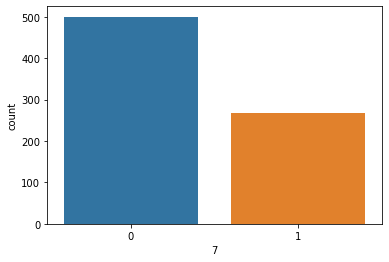

In [20]:
sns.countplot(dfy)

# Applying SMOTE

In [23]:
import sklearn
sklearn.__version__

'1.1.2'

pip install --user scikit-learn

In [ ]:
!pip install scikit-learn

In [24]:
import numpy
numpy.__version__

'1.20.3'

In [17]:
# pip install --upgrade   (#upgrade numpy or sql, if less than 1.20.3' then we need to upgrade)
# pip install --upgrade --ignore-installed

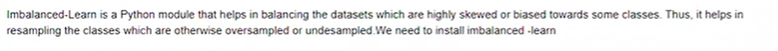

In [ ]:
!pip install --user imblanced-learn
!pip install --user imblearn             # wehn we need  

In [ ]:
!pip install imblearn --user             # wehn we need, it markdwon never run it again, do not run after the installation

pip install imblearn

In [25]:
from imblearn.over_sampling import SMOTE

In [26]:
smt=SMOTE()
trainx,trainy=smt.fit_resample(dfx,dfy)   # both equally distributed like 0-500 and 1=500. 

In [27]:
#dfy.value_counts()
trainx.value_counts()   #smote is adding artificial number afeter 267 in 1

0    1   2   3    4          5         6 
0    48  20  0    24.700000  0.140000  22    1
137  68  14  148  24.800000  0.143000  21    1
136  58  35  167  34.444235  0.585283  21    1
     70  0   0    31.200000  1.182000  22    1
         32  110  37.100000  0.153000  43    1
                                            ..
108  80  0   0    27.000000  0.259000  52    1
         44  216  43.273652  0.534636  38    1
     88  19  0    27.100000  0.400000  24    1
109  38  18  120  23.100000  0.407000  26    1
199  76  43  0    42.900000  1.394000  22    1
Length: 1000, dtype: int64

In [32]:
trainx.shape

(1000, 7)

In [28]:
trainy.value_counts()

0    500
1    500
Name: 7, dtype: int64

In [29]:
trainy

0      0
1      1
2      0
3      1
4      0
      ..
995    1
996    1
997    1
998    1
999    1
Name: 7, Length: 1000, dtype: int64

<AxesSubplot:xlabel='7', ylabel='count'>

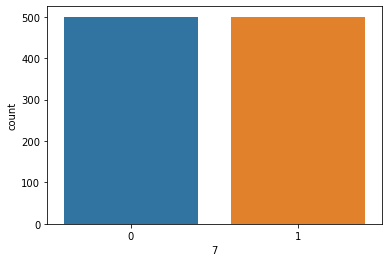

In [31]:
sns.countplot(trainy)

In [33]:
from sklearn.model_selection import train_test_split

In [35]:
train_x,test_x,train_y,test_y=train_test_split(trainx,trainy,test_size=.30,random_state=45)

In [37]:
train_x.shape

(700, 7)

In [38]:
train_y.shape

(700,)

In [40]:
lg=LogisticRegression()
lg.fit(train_x,train_y)
lg.score(train_x,train_y)

pred=lg.predict(test_x)

from sklearn.metrics import accuracy_score
print(round(accuracy_score(test_y,pred),2))

0.72


In [41]:
dfiris=pd.read_csv('iris.csv')
dfiris.head()

,sepal length,sepal width,petal length,petal width,class
0,5.1,3.5,1.4,0.2,Iris-setosa
1,4.9,3.0,1.4,0.2,Iris-setosa
2,4.7,3.2,1.3,0.2,Iris-setosa
3,4.6,3.1,1.5,0.2,Iris-setosa
4,5.0,3.6,1.4,0.2,Iris-setosa


In [42]:
dfiris.sample(3)

,sepal length,sepal width,petal length,petal width,class
112,6.8,3.0,5.5,2.1,Iris-virginica
118,7.7,2.6,6.9,2.3,Iris-virginica
124,6.7,3.3,5.7,2.1,Iris-virginica


In [43]:
dfiris['class'].value_counts()

Iris-setosa        50
Iris-versicolor    50
Iris-virginica     50
Name: class, dtype: int64

<AxesSubplot:xlabel='class', ylabel='count'>

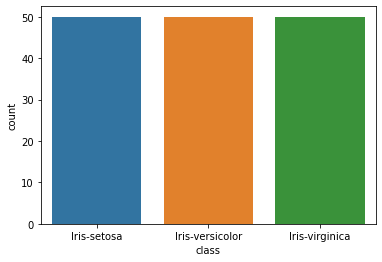

In [45]:
sns.countplot(dfiris['class'])

# IMBALANCED WINE QUALITY DATASET

In [47]:
winedf=pd.read_csv('winequality-red.csv')
winedf.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [48]:
winedf.sample(3)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
1218,8.2,0.40,0.31,1.9,0.082,8.0,24.0,0.99600,3.24,0.69,10.6,6
1520,6.5,0.53,0.06,2.0,0.063,29.0,44.0,0.99489,3.38,0.83,10.3,6
328,13.4,0.27,0.62,2.6,0.082,6.0,21.0,1.00020,3.16,0.67,9.7,6


In [49]:
winedf['quality'].value_counts()

5    681
6    638
7    199
4     53
8     18
3     10
Name: quality, dtype: int64

<AxesSubplot:xlabel='quality', ylabel='count'>

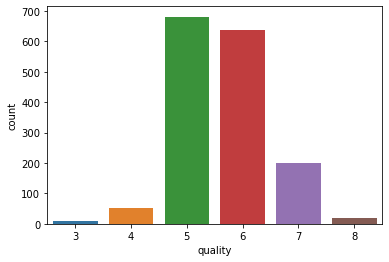

In [51]:
sns.countplot(winedf['quality'])

In [54]:
x=winedf.iloc[:,0:-1]
y=winedf.iloc[:,-1]

In [55]:
y

0       5
1       5
2       5
3       6
4       5
       ..
1594    5
1595    6
1596    6
1597    5
1598    6
Name: quality, Length: 1599, dtype: int64

In [56]:
y.shape

(1599,)

In [57]:
from imblearn.over_sampling import SMOTE
sm=SMOTE()
xtrainw,ytrainw=sm.fit_resample(x,y)    #synthetic rows are artifical rows which are being added with the help of SMOTE
ytrainw

0       5
1       5
2       5
3       6
4       5
       ..
4081    8
4082    8
4083    8
4084    8
4085    8
Name: quality, Length: 4086, dtype: int64

In [58]:
ytrainw.value_counts()

5    681
6    681
7    681
4    681
8    681
3    681
Name: quality, dtype: int64

<AxesSubplot:xlabel='quality', ylabel='count'>

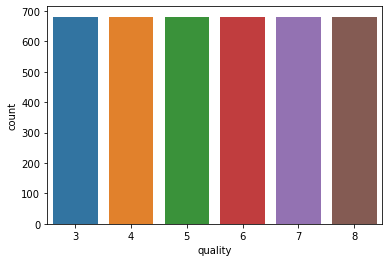

In [59]:
sns.countplot(ytrainw)

In [65]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,confusion_matrix
xtrain,xtest,ytrain,ytest=train_test_split(xtrainw,ytrainw,test_size=.30,random_state=45)

dtc=DecisionTreeClassifier()
dtc.fit(xtrain,ytrain)
pred=dtc.predict(xtest)

print('Accuracy::', round(accuracy_score(ytest,pred),2))
confusion_matrix(ytest,pred)



Accuracy:: 0.78


array([[213,   2,   4,   1,   0,   0],
       [  2, 162,  15,  14,   3,   0],
       [  4,  32, 122,  37,   3,   1],
       [  2,  11,  45, 103,  38,   8],
       [  0,   1,  12,  25, 157,   5],
       [  0,   0,   0,   4,   6, 194]], dtype=int64)

In [66]:
pred

array([4, 8, 5, ..., 3, 3, 7], dtype=int64)

# Curse of Dimensionality

In [67]:
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report

import warnings
warnings.filterwarnings('ignore')

In [68]:
data=pd.read_csv('sonar.csv',names=range(0,61),header=0)

In [70]:
data=pd.DataFrame(data=data)

In [71]:
data

,0,1,2,3,4,5,6,7,8,9,...,51,52,53,54,55,56,57,58,59,60
0,0.0453,0.0523,0.0843,0.0689,0.1183,0.2583,0.2156,0.3481,0.3337,0.2872,...,0.0084,0.0089,0.0048,0.0094,0.0191,0.0140,0.0049,0.0052,0.0044,R
1,0.0262,0.0582,0.1099,0.1083,0.0974,0.2280,0.2431,0.3771,0.5598,0.6194,...,0.0232,0.0166,0.0095,0.0180,0.0244,0.0316,0.0164,0.0095,0.0078,R
2,0.0100,0.0171,0.0623,0.0205,0.0205,0.0368,0.1098,0.1276,0.0598,0.1264,...,0.0121,0.0036,0.0150,0.0085,0.0073,0.0050,0.0044,0.0040,0.0117,R
3,0.0762,0.0666,0.0481,0.0394,0.0590,0.0649,0.1209,0.2467,0.3564,0.4459,...,0.0031,0.0054,0.0105,0.0110,0.0015,0.0072,0.0048,0.0107,0.0094,R
4,0.0286,0.0453,0.0277,0.0174,0.0384,0.0990,0.1201,0.1833,0.2105,0.3039,...,0.0045,0.0014,0.0038,0.0013,0.0089,0.0057,0.0027,0.0051,0.0062,R
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
202,0.0187,0.0346,0.0168,0.0177,0.0393,0.1630,0.2028,0.1694,0.2328,0.2684,...,0.0116,0.0098,0.0199,0.0033,0.0101,0.0065,0.0115,0.0193,0.0157,M
203,0.0323,0.0101,0.0298,0.0564,0.0760,0.0958,0.0990,0.1018,0.1030,0.2154,...,0.0061,0.0093,0.0135,0.0063,0.0063,0.0034,0.0032,0.0062,0.0067,M
204,0.0522,0.0437,0.0180,0.0292,0.0351,0.1171,0.1257,0.1178,0.1258,0.2529,...,0.0160,0.0029,0.0051,0.0062,0.0089,0.0140,0.0138,0.0077,0.0031,M
205,0.0303,0.0353,0.0490,0.0608,0.0167,0.1354,0.1465,0.1123,0.1945,0.2354,...,0.0086,0.0046,0.0126,0.0036,0.0035,0.0034,0.0079,0.0036,0.0048,M


In [72]:
x=data.iloc[:,0:-1]
x.shape

(207, 60)

In [73]:
pca=PCA(n_components=10)
#pca=PCA(25)

In [74]:
y=data.iloc[:,-1]

In [75]:
x=pca.fit_transform(x)

In [76]:
x.shape

(207, 10)

In [77]:
pd.DataFrame(data=x)

,0,1,2,3,4,5,6,7,8,9
0,-0.970285,1.017654,0.830432,0.120147,0.299120,0.202682,-0.226988,0.384837,0.004329,-0.082679
1,-0.324435,0.876876,0.228203,0.868926,0.098053,-0.269122,-0.421778,0.081072,0.014185,-0.432334
2,0.853571,0.697734,-0.023602,-0.123425,-0.584388,0.351808,0.478187,-0.215424,-0.533955,-0.425182
3,-0.061337,0.226034,0.635198,0.152907,0.150982,0.081111,-0.374523,0.070143,0.119454,-0.427480
4,-0.605423,0.901962,0.804550,0.271896,0.496832,0.464410,-0.224909,0.105504,-0.202842,-0.235048
...,...,...,...,...,...,...,...,...,...,...
202,0.049918,-1.028980,0.265634,0.026018,-0.014738,0.097506,0.012021,0.178998,0.029362,-0.268631
203,0.228374,-1.149870,0.200437,0.043461,0.182020,0.010158,0.084858,0.266152,-0.068963,-0.307679
204,0.306763,-1.147756,0.248975,-0.058557,0.161337,0.013778,0.049391,0.227866,-0.070132,-0.313294
205,-0.038083,-0.994049,0.201938,-0.060790,-0.147673,-0.088874,0.018656,0.069504,-0.024406,-0.165303


In [78]:
y

0      R
1      R
2      R
3      R
4      R
      ..
202    M
203    M
204    M
205    M
206    M
Name: 60, Length: 207, dtype: object

In [79]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
y=le.fit_transform(y)
y

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0])

In [80]:
from sklearn.preprocessing import StandardScaler

In [81]:
scale=StandardScaler()

In [82]:
x=scale.fit_transform(x)

In [83]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.22,random_state=45)

In [84]:
ir=LogisticRegression()

In [87]:
ir.fit(x_train,y_train)
ir.score(x_train,y_train)

predir=ir.predict(x_test)
print(accuracy_score(y_test,predir))
print(confusion_matrix(y_test,predir))
print(classification_report(y_test,predir))      

0.8043478260869565
[[23  1]
 [ 8 14]]
              precision    recall  f1-score   support

           0       0.74      0.96      0.84        24
           1       0.93      0.64      0.76        22

    accuracy                           0.80        46
   macro avg       0.84      0.80      0.80        46
weighted avg       0.83      0.80      0.80        46



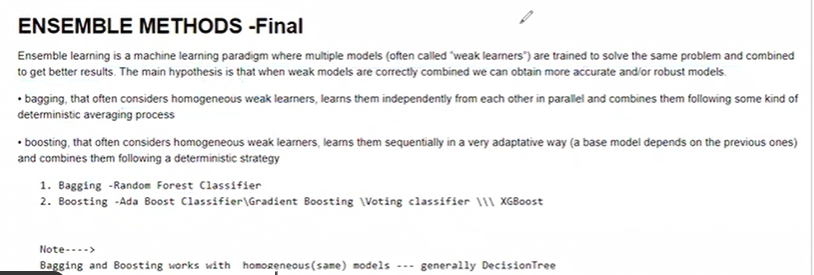

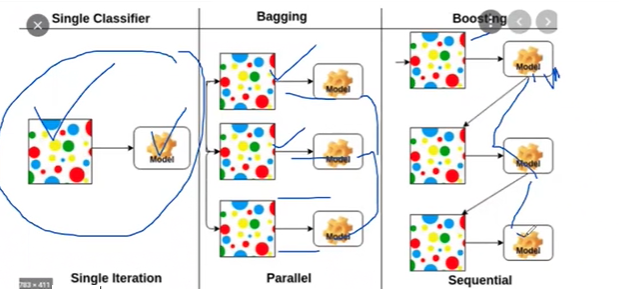

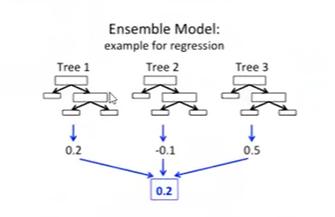

In [1]:
import sklearn
print(sklearn.__version__)

1.1.2


Type Markdown and LaTex: a2

In [2]:
# from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
#from sklearn.Linear_model import LogisticRegression
#from sklearn.navie_boys import GaussianNB
from sklearn.datasets import load_iris
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.model_selection import train_test_split

import warnings
warnings.filterwarnings('ignore')

In [26]:
#loading iris dataset
iris=load_iris()
#print(iris)
x=iris.data[:,:4]
y=iris.target

#train_test_split

x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.33,random_state=42)

# Bagging

In [12]:
from sklearn.ensemble import RandomForestClassifier
rf=RandomForestClassifier(n_estimators=100,random_state=42)  #we can also check for 50,150, 200
#RandomForestClassifier(100)-----Default
rf.fit(x_train,y_train)
predrf=rf.predict(x_test)
print(accuracy_score(y_test,predrf))
print(confusion_matrix(y_test,predrf))
print(classification_report(y_test,predrf))

0.98
[[19  0  0]
 [ 0 15  0]
 [ 0  1 15]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        19
           1       0.94      1.00      0.97        15
           2       1.00      0.94      0.97        16

    accuracy                           0.98        50
   macro avg       0.98      0.98      0.98        50
weighted avg       0.98      0.98      0.98        50



# Boosting

In [5]:
from sklearn.ensemble import AdaBoostClassifier
#AdaBoostClassifier(base_estimator=DecisionTreeClassifier(),n_estimators=50,Learning_rate=1.0)
ad=AdaBoostClassifier()
ad.fit(x_train,y_train)
ad_pred=ad.predict(x_test)
print(accuracy_score(y_test,ad_pred))       #by deafaul process
print(confusion_matrix(y_test,ad_pred))
print(classification_report(y_test,ad_pred))

0.92
[[19  0  0]
 [ 0 15  0]
 [ 0  4 12]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        19
           1       0.79      1.00      0.88        15
           2       1.00      0.75      0.86        16

    accuracy                           0.92        50
   macro avg       0.93      0.92      0.91        50
weighted avg       0.94      0.92      0.92        50



In [6]:
ad=AdaBoostClassifier(n_estimators=50)
ad.fit(x_train,y_train)
ad_pred=ad.predict(x_test)
print(accuracy_score(y_test,ad_pred))
print(confusion_matrix(y_test,ad_pred))
print(classification_report(y_test,ad_pred))

0.92
[[19  0  0]
 [ 0 15  0]
 [ 0  4 12]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        19
           1       0.79      1.00      0.88        15
           2       1.00      0.75      0.86        16

    accuracy                           0.92        50
   macro avg       0.93      0.92      0.91        50
weighted avg       0.94      0.92      0.92        50



In [7]:
#Import Support Vector Classifier
from sklearn.svm import SVC
svc=SVC()

#Create adaboost clasifier object
ad=AdaBoostClassifier(n_estimators=50,base_estimator=svc,algorithm='SAMME')
ad.fit(x_train,y_train)

ad_pred=ad.predict(x_test)

print(accuracy_score(y_test,ad_pred))
print(confusion_matrix(y_test,ad_pred))
print(classification_report(y_test,ad_pred))

0.3
[[ 0 19  0]
 [ 0 15  0]
 [ 0 16  0]]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        19
           1       0.30      1.00      0.46        15
           2       0.00      0.00      0.00        16

    accuracy                           0.30        50
   macro avg       0.10      0.33      0.15        50
weighted avg       0.09      0.30      0.14        50



In [8]:
from sklearn.svm import SVC
svc=SVC(kernel='linear')

#Create adaboost clasifier object

ad=AdaBoostClassifier(n_estimators=50,base_estimator=svc,algorithm='SAMME')
ad.fit(x_train,y_train)

ad_pred=ad.predict(x_test)

print(accuracy_score(y_test,ad_pred))
print(confusion_matrix(y_test,ad_pred))
print(classification_report(y_test,ad_pred))

1.0
[[19  0  0]
 [ 0 15  0]
 [ 0  0 16]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        19
           1       1.00      1.00      1.00        15
           2       1.00      1.00      1.00        16

    accuracy                           1.00        50
   macro avg       1.00      1.00      1.00        50
weighted avg       1.00      1.00      1.00        50



In [9]:
from sklearn.ensemble import GradientBoostingClassifier
gb=GradientBoostingClassifier()

gb.fit(x_train,y_train)

gb_pred=gb.predict(x_test)

print(accuracy_score(y_test,gb_pred))
print(confusion_matrix(y_test,gb_pred))
print(classification_report(y_test,gb_pred))

0.98
[[19  0  0]
 [ 0 15  0]
 [ 0  1 15]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        19
           1       0.94      1.00      0.97        15
           2       1.00      0.94      0.97        16

    accuracy                           0.98        50
   macro avg       0.98      0.98      0.98        50
weighted avg       0.98      0.98      0.98        50



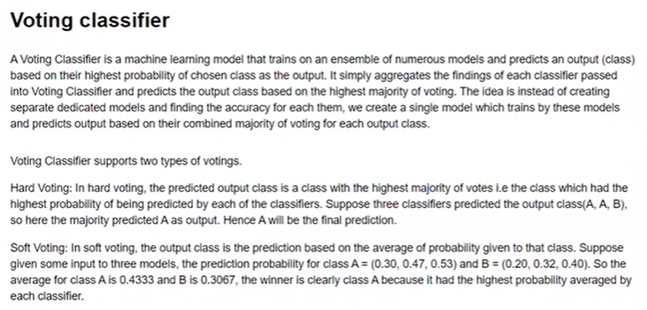

In [14]:
# importing Libraries
from sklearn.ensemble import VotingClassifier

In [16]:
from sklearn.neighbors import KNeighborsClassifier

Hard Voting

In [17]:
#group/ensemble of models                 #these three are hetrogeneous model
estimator=[]
estimator.append(('LR',KNeighborsClassifier()))
estimator.append(('SVC',SVC(gamma='auto',probability=True)))
estimator.append(('DTC',DecisionTreeClassifier()))

In [18]:
estimator

[('LR', KNeighborsClassifier()),
 ('SVC', SVC(gamma='auto', probability=True)),
 ('DTC', DecisionTreeClassifier())]

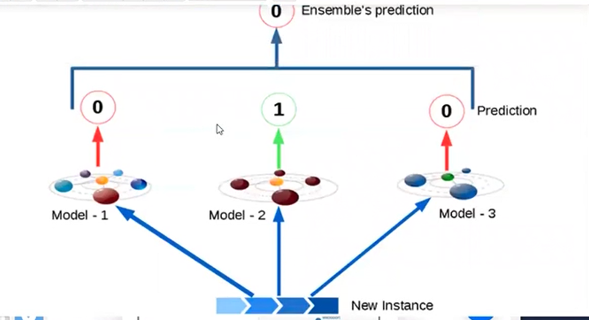

In [28]:
#Voting classifier with hard voting
vot_hard=VotingClassifier(estimators=estimator,voting='hard')
vot_hard.fit(x_train,y_train)
y_pred=vot_hard.predict(x_test)

print(y_pred)
#using accuracy_score metric to predict accuracy
score=accuracy_score(y_test,y_pred)
print('Hard Voting Score % d' % score)          #hard voting score 1 means 100% correct

[1 0 2 1 1 0 1 2 1 1 2 0 0 0 0 1 2 1 1 2 0 2 0 2 2 2 2 2 0 0 0 0 1 0 0 2 1
 0 0 0 2 1 1 0 0 1 1 2 1 2]
Hard Voting Score  0


Soft Voting

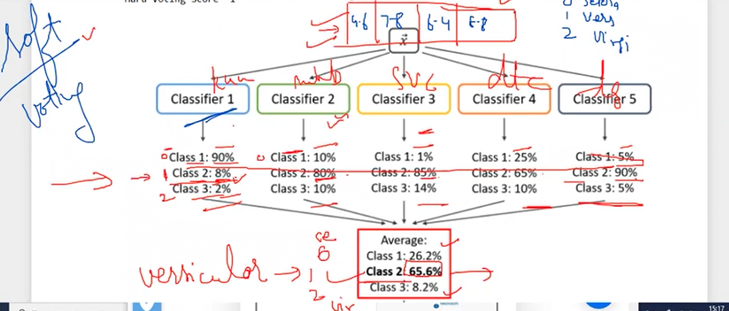

In [27]:
#Voting Classifier with soft Voting
vot_soft=VotingClassifier(estimators=estimator, voting='soft')
vot_soft.fit(x_train,y_train)
y_pred=vot_soft.predict(x_test)

print(y_pred)
#using accuracy_score
score=accuracy_score(y_test,y_pred)
print("Soft Voting Score % d" % score) 

[1 0 2 1 1 0 1 2 1 1 2 0 0 0 0 1 2 1 1 2 0 2 0 2 2 2 2 2 0 0 0 0 1 0 0 2 1
 0 0 0 2 1 1 0 0 1 2 2 1 2]
Soft Voting Score  1


# Pipeline

The purpose of the pipeline is to assemble several steps that can be cross-validated together while setting different parameters.

In [42]:
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline

x,y = make_classification(random_state=0)
x_train, x_test, y_train, y_test = train_test_split(x, y,random_state=0)
                                                    
pipe = Pipeline([('scaler', StandardScaler()), ('svc', SVC())])
# The pipeline can be used as any other estimator
# and avoids leaking the test set into the train set
pipe.fit(x_train, y_train)
Pipeline(steps=[('scaler', StandardScaler()), ('svc', SVC())])
pipe.score(x_test, y_test)

0.88

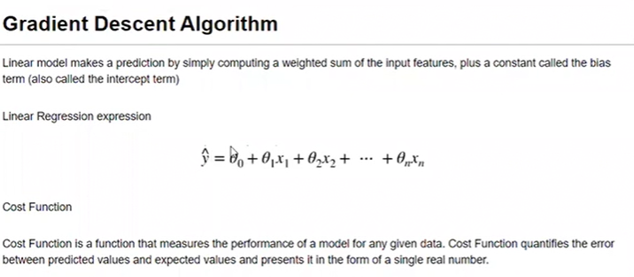

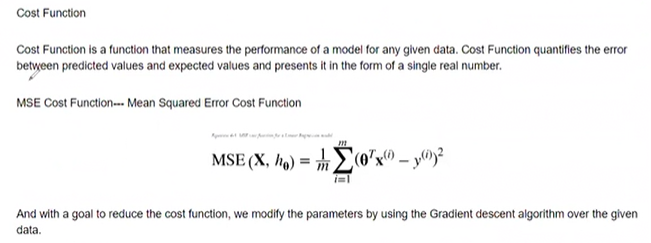

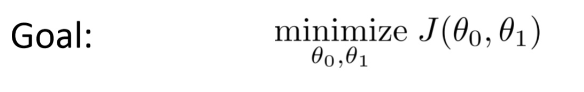

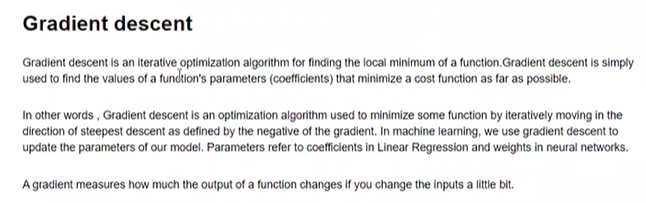

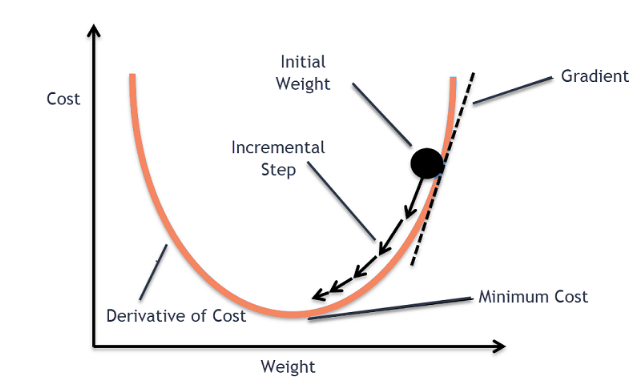

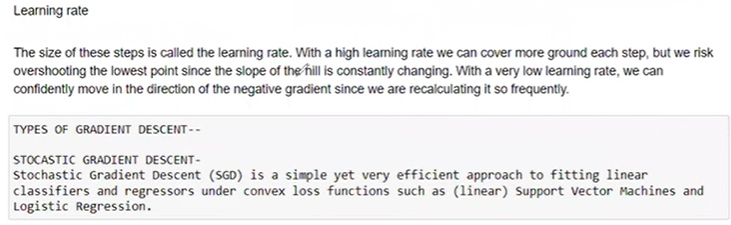

In [39]:
#importing Libraries
from sklearn import linear_model
from sklearn.datasets import load_boston
from sklearn.linear_model import SGDRegressor

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.pipeline import Pipeline

import numpy as np
import pandas as pd

#loading the data
x=load_boston()
data=pd.DataFrame(x.data,columns=x.feature_names)
y=x.target

#Creating A model

pipe=[]
pipe.append(('SC',StandardScaler()))
pipe.append(('PCA',PCA(n_components=8)))
pipe.append(('SGD',SGDRegressor(alpha=0.1,learning_rate='optimal',max_iter=400,penalty='l2')))  #L2
model=Pipeline(pipe)

#cross validation score
cv_results=cross_val_score(model,data,y,cv=5)
msg='%s: %f (%f)' %('SGDRegressor',cv_results.mean(),cv_results.std())
print(msg)

SGDRegressor: 0.491190 (0.260861)


In [40]:
from sklearn.linear_model import SGDClassifier
from sklearn.datasets import load_iris
x=load_iris()
data=pd.DataFrame(x.data,columns=x.feature_names)
y=x.target

#creating a model
model=SGDClassifier()

#cross validation score

cv_results=cross_val_score(model,data,y,cv=5)
msg='%s: %f (%f)' %('SGDClassifier',cv_results.mean(),cv_results.std())

print(msg)

SGDClassifier: 0.840000 (0.128927)


# Entropy and Gini

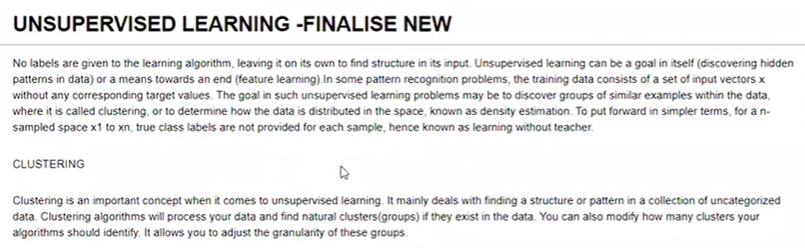

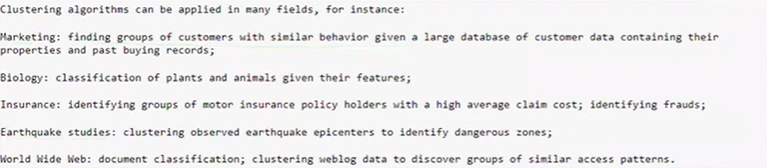

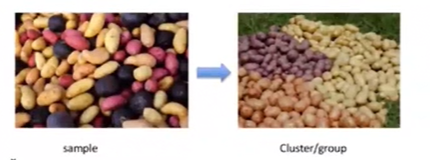

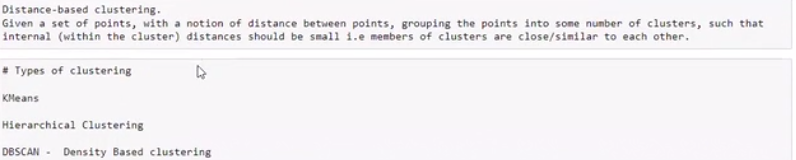

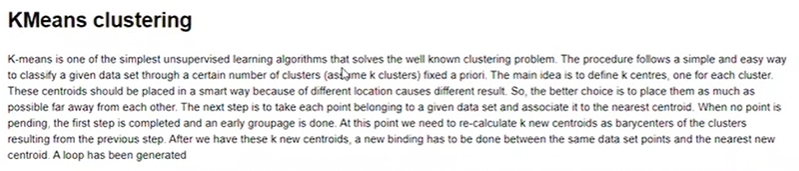

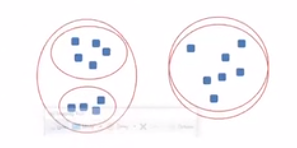

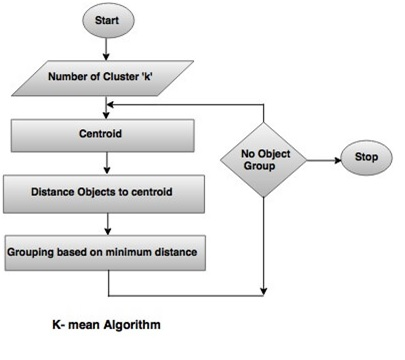

Let's work with KMeans clustering

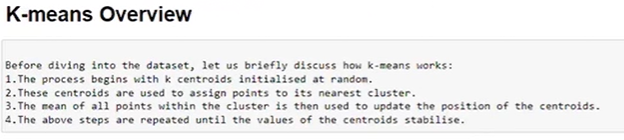

In [6]:
#importing libraries
import pandas as pd
import matplotlib.pyplot as plt
from sklearn import preprocessing
from sklearn.cluster import KMeans

import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_csv('iris.csv')      #no need of class only require input data
df.head()

,sepal length,sepal width,petal length,petal width,class
0,5.1,3.5,1.4,0.2,Iris-setosa
1,4.9,3.0,1.4,0.2,Iris-setosa
2,4.7,3.2,1.3,0.2,Iris-setosa
3,4.6,3.1,1.5,0.2,Iris-setosa
4,5.0,3.6,1.4,0.2,Iris-setosa


In [3]:
df=df[['petal length','sepal length']]  # we can choose any data
df.head(3)

,petal length,sepal length
0,1.4,5.1
1,1.4,4.9
2,1.3,4.7


In [7]:
model=KMeans(n_clusters=3) #number of 3 clusters
y_model=model.fit_predict(df)
y_model

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 2, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 2, 1, 2, 2, 2, 2, 1, 2, 2, 2,
       2, 2, 2, 1, 1, 2, 2, 2, 2, 1, 2, 1, 2, 1, 2, 2, 1, 1, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 1, 2, 2, 2, 1, 2, 2, 1])

In [8]:
model.labels_

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 2, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 2, 1, 2, 2, 2, 2, 1, 2, 2, 2,
       2, 2, 2, 1, 1, 2, 2, 2, 2, 1, 2, 1, 2, 1, 2, 2, 1, 1, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 1, 2, 2, 2, 1, 2, 2, 1])

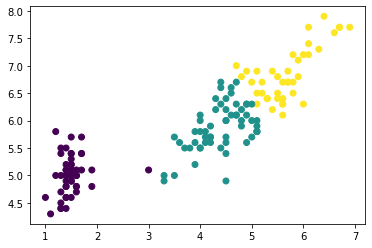

In [9]:
plt.scatter(df.iloc[:,0],df.iloc[:,1],c=model.labels_,cmap='viridis') #different color, cmap=color map 

In [10]:
pd.value_counts(y_model)

1    58
0    51
2    41
dtype: int64

In [11]:
# looking at the points which belong to cluster0
df[y_model==0]

,petal length,sepal length
0,1.4,5.1
1,1.4,4.9
2,1.3,4.7
3,1.5,4.6
4,1.4,5.0
5,1.7,5.4
6,1.4,4.6
7,1.5,5.0
8,1.4,4.4
9,1.5,4.9


In [13]:
# looking at the points which belong to cluster1
df[y_model==1]

,petal length,sepal length
51,4.5,6.4
53,4.0,5.5
54,4.6,6.5
55,4.5,5.7
56,4.7,6.3
57,3.3,4.9
58,4.6,6.6
59,3.9,5.2
60,3.5,5.0
61,4.2,5.9


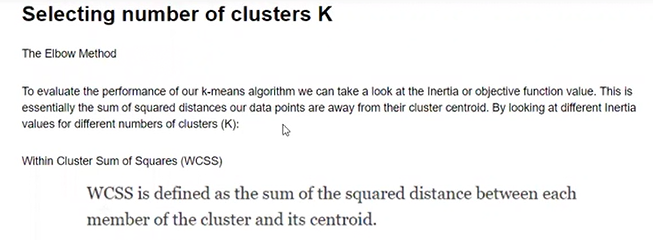

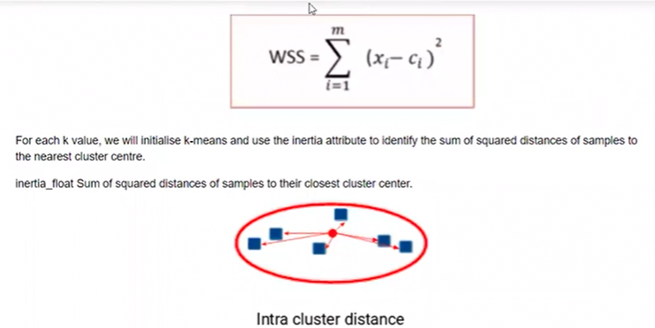

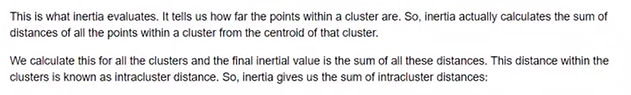

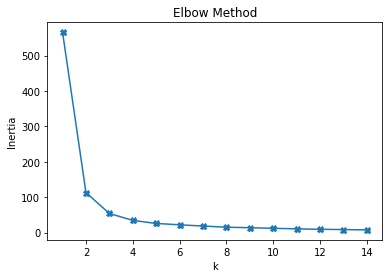

In [17]:
wcss=[]
K=range(1,15)
for k in K:
    km=KMeans(n_clusters=k)
    km=km.fit(df)
    wcss.append(km.inertia_)
    
plt.plot(K,wcss,marker='X')    #X is marker of box
plt.xlabel('k')
plt.ylabel('Inertia')
plt.title('Elbow Method')      # elobow method kind of find the number of cluster
plt.show()

Number of cluster=3        #because elbow trun on 3

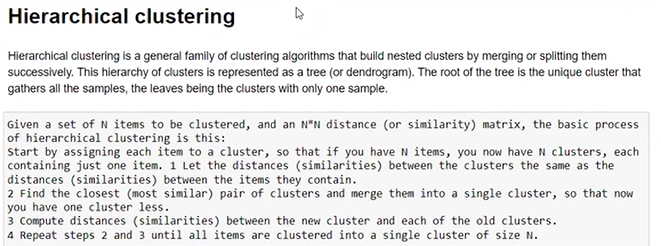

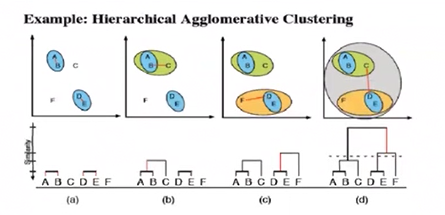

                                                    Dendrogram Graph

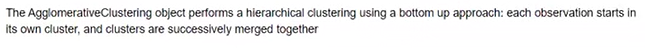

In [19]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.datasets import load_iris
iris=load_iris()

clustering = AgglomerativeClustering().fit(iris.data)
clustering

clustering.labels_

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int64)

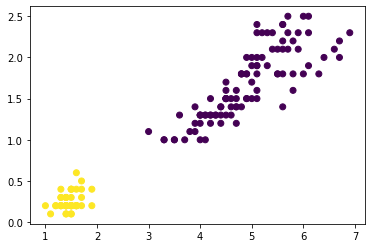

In [20]:
plt.scatter(iris.data[:,2],iris.data[:,3],c=clustering.labels_,cmap='viridis')

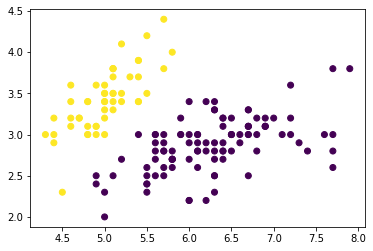

In [21]:
plt.scatter(iris.data[:,0],iris.data[:,1],c=clustering.labels_,cmap='viridis')

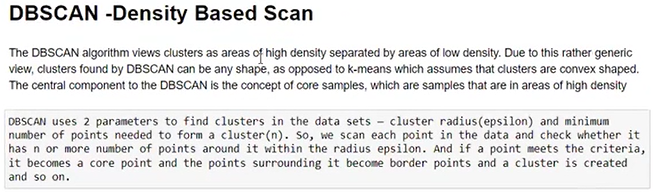

In [22]:
from sklearn.cluster import DBSCAN
from sklearn.datasets import load_iris

iris=load_iris()

db=DBSCAN().fit(iris.data)

db.labels_

#-1---noise samples

array([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0,  0,  1,
        1,  1,  1,  1,  1,  1, -1,  1,  1, -1,  1,  1,  1,  1,  1,  1,  1,
       -1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1, -1,  1,  1,  1,  1,  1, -1,  1,  1,  1,  1, -1,  1,  1,  1,
        1,  1,  1, -1, -1,  1, -1, -1,  1,  1,  1,  1,  1,  1,  1, -1, -1,
        1,  1,  1, -1,  1,  1,  1,  1,  1,  1,  1,  1, -1,  1,  1, -1, -1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1],
      dtype=int64)

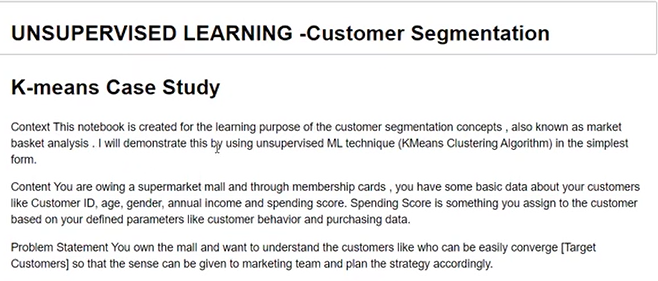

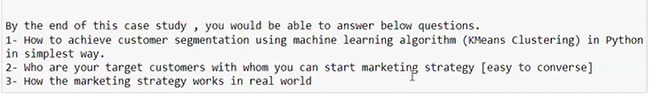

In [1]:
#Importing libararies
import pandas as pd
import matplotlib.pyplot as plt
from sklearn import preprocessing

from sklearn.cluster import KMeans

import warnings
warnings.filterwarnings('ignore')

In [2]:
dataset=pd.read_csv('Mall_customers.csv')
dataset.head(10)

,CustomerID,Genre,Age,Annual Income (k$),Spending Score (1-100)
0,1,Male,19,15,39
1,2,Male,21,15,81
2,3,Female,20,16,6
3,4,Female,23,16,77
4,5,Female,31,17,40
5,6,Female,22,17,76
6,7,Female,35,18,6
7,8,Female,23,18,94
8,9,Male,64,19,3
9,10,Female,30,19,72


In [3]:
#dataset
x=dataset.iloc[:,3:]
x

,Annual Income (k$),Spending Score (1-100)
0,15,39
1,15,81
2,16,6
3,16,77
4,17,40
...,...,...
195,120,79
196,126,28
197,126,74
198,137,18


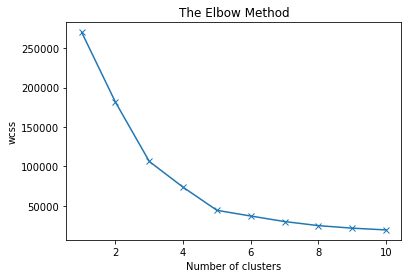

In [4]:
# Elbow Method
# k+means++ : selects initial cluster centers for k-mean clustering in a smart way to speed up convergence

wcss=[]
for i in range(1,11):
    kmeans=KMeans(n_clusters=i,init='k-means++')  #k+means++ default
    kmeans.fit(x)
    wcss.append(kmeans.inertia_)
    
plt.plot(range(1,11),wcss,marker='x')    #X is marker of box
plt.xlabel('Number of clusters')
plt.ylabel('wcss')
plt.title('The Elbow Method')      
plt.show()


In [9]:
# Fitting K-Means to the dataset

kmeans=KMeans(n_clusters=5,init='k-means++')
y_kmeans=kmeans.fit_predict(x)
print(y_kmeans)

[2 0 2 0 2 0 2 0 2 0 2 0 2 0 2 0 2 0 2 0 2 0 2 0 2 0 2 0 2 0 2 0 2 0 2 0 2
 0 2 0 2 0 2 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 4 3 4 1 4 3 4 3 4 1 4 3 4 3 4 3 4 3 4 1 4 3 4 3 4
 3 4 3 4 3 4 3 4 3 4 3 4 3 4 3 4 3 4 3 4 3 4 3 4 3 4 3 4 3 4 3 4 3 4 3 4 3
 4 3 4 3 4 3 4 3 4 3 4 3 4 3 4]


In [11]:
kmeans.labels_

array([2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0,
       2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 1,
       2, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 4, 3, 4, 1, 4, 3, 4, 3, 4,
       1, 4, 3, 4, 3, 4, 3, 4, 3, 4, 1, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4,
       3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4,
       3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4,
       3, 4])

In [12]:
# cluster centers

kmeans.cluster_centers_

array([[25.72727273, 79.36363636],
       [55.2962963 , 49.51851852],
       [26.30434783, 20.91304348],
       [88.2       , 17.11428571],
       [86.53846154, 82.12820513]])

In [14]:
# looking at the points which belong to cluster0
x[y_kmeans==0]

,Annual Income (k$),Spending Score (1-100)
1,15,81
3,16,77
5,17,76
7,18,94
9,19,72
11,19,99
13,20,77
15,20,79
17,21,66
19,23,98


In [15]:
# looking at the points which belong to cluster2 # as per result it is not spendinng high, hence it is not involve into the target marketing
x[y_kmeans==2]

,Annual Income (k$),Spending Score (1-100)
0,15,39
2,16,6
4,17,40
6,18,6
8,19,3
10,19,14
12,20,15
14,20,13
16,21,35
18,23,29


In [16]:
# looking at the points which belong to cluster1
x[y_kmeans==1]

,Annual Income (k$),Spending Score (1-100)
43,39,61
46,40,55
47,40,47
48,40,42
49,40,42
...,...,...
121,67,40
122,69,58
126,71,35
132,72,34


In [18]:
dataset.to_csv('finalkmean_group2.csv')

In [20]:
# saving the model to the local file system
import pickle
filename='finalkmean.pickle'
pickle.dump(kmeans,open(filename,'wb'))

In [21]:
dataset

,CustomerID,Genre,Age,Annual Income (k$),Spending Score (1-100)
0,1,Male,19,15,39
1,2,Male,21,15,81
2,3,Female,20,16,6
3,4,Female,23,16,77
4,5,Female,31,17,40
...,...,...,...,...,...
195,196,Female,35,120,79
196,197,Female,45,126,28
197,198,Male,32,126,74
198,199,Male,32,137,18


In [22]:
ds=pd.DataFrame(data=dataset)
ds

,CustomerID,Genre,Age,Annual Income (k$),Spending Score (1-100)
0,1,Male,19,15,39
1,2,Male,21,15,81
2,3,Female,20,16,6
3,4,Female,23,16,77
4,5,Female,31,17,40
...,...,...,...,...,...
195,196,Female,35,120,79
196,197,Female,45,126,28
197,198,Male,32,126,74
198,199,Male,32,137,18


In [26]:
ds['Facebook']=pd.DataFrame(data=kmeans.labels_)  # create separate group to which customer following in which group and also identify the which group is peforming good.
ds

,CustomerID,Genre,Age,Annual Income (k$),Spending Score (1-100),Facebook,group_cluster
0,1,Male,19,15,39,2,2
1,2,Male,21,15,81,0,0
2,3,Female,20,16,6,2,2
3,4,Female,23,16,77,0,0
4,5,Female,31,17,40,2,2
...,...,...,...,...,...,...,...
195,196,Female,35,120,79,4,4
196,197,Female,45,126,28,3,3
197,198,Male,32,126,74,4,4
198,199,Male,32,137,18,3,3


In [27]:
ds.to_csv('facebook_customer.csv',index=False) #to see all rows or complete data

In [28]:
# for see the above file but we can show the complete data

myds=pd.read_csv('facebook_customer.csv')
myds

,CustomerID,Genre,Age,Annual Income (k$),Spending Score (1-100),Facebook,group_cluster
0,1,Male,19,15,39,2,2
1,2,Male,21,15,81,0,0
2,3,Female,20,16,6,2,2
3,4,Female,23,16,77,0,0
4,5,Female,31,17,40,2,2
...,...,...,...,...,...,...,...
195,196,Female,35,120,79,4,4
196,197,Female,45,126,28,3,3
197,198,Male,32,126,74,4,4
198,199,Male,32,137,18,3,3


# Tuning the model: Hyperparameter tuning : GridSearchCV

In [32]:
# Grid Search for Algorithm Tuning

import numpy as np
from sklearn import datasets
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

import warnings
warnings.filterwarnings('ignore')

#load the diabetes datasets
dataset=datasets.load_diabetes()

#prepare a range of alpha values to test
#alpha =np.array([1,0.1,0.01,0.001,0.0001,0])
alphavalue={'alpha':[1,0.1,0.01,0.001,0.0001,0]}
model=Ridge()

#grid=GridSearchCV(estimator=model,param_grid=dict(alpha=alphas))

grid=GridSearchCV(estimator=model,param_grid=alphavalue)

grid.fit(dataset.data,dataset.target)
print(grid)
#summarize the results of the grid search
print(grid.best_score_)
print(grid.best_estimator_.alpha)
print(grid.best_params_)


GridSearchCV(estimator=Ridge(),
             param_grid={'alpha': [1, 0.1, 0.01, 0.001, 0.0001, 0]})
0.4823214545225419
0.0001
{'alpha': 0.0001}


In [35]:
from sklearn.linear_model import LinearRegression,Lasso,Ridge
from sklearn import datasets
from sklearn.model_selection import GridSearchCV

ds=datasets.load_diabetes()
x=ds.data
y=ds.target

ir=LinearRegression()
ir.fit(x,y)

print('Score:',ir.score(x,y))
rd=Ridge(alpha=.0001)
rd.fit(x,y)
print(rd.coef_) 
print('Score:',rd.score(x,y))

Score: 0.5177484222203499
[  -9.9599668  -239.73847277  519.90790158  324.3246984  -783.36095429
  469.74463276   97.14958563  176.00307904  747.93105798   67.67944396]
Score: 0.5177479163759708


In [37]:
from sklearn import svm,datasets
from sklearn.model_selection import GridSearchCV
iris=datasets.load_iris()
parameters={'kernel':('linear','rbf'),'C':[1,10]}
svc=svm.SVC()
clf=GridSearchCV(svc,parameters)

clf.fit(iris.data,iris.target)

#GridSearchCV(estimator=SVC())
#param_grid={'C':[1,10],'kernel':('linear','rbf')}

#sorted(clf.cv_results_.keys())
print(clf.best_score_)
print(clf.best_estimator_.kernel)
print(clf.best_params_)


0.9800000000000001
linear
{'C': 1, 'kernel': 'linear'}


In [39]:
sv=svm.SVC(kernel='linear',C=1)
sv.fit(iris.data,iris.target)
t=sv.score(iris.data,iris.target)
print(round(t,2))

0.99


In [43]:
from sklearn import datasets
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV

dtc=DecisionTreeClassifier()
iris=datasets.load_iris()

grid_param={'criterion':['gini','entropy']}
#gridk={'kernel':['linear','rbf','poly']}

gd_sr=GridSearchCV(estimator=dtc,param_grid=grid_param,scoring='accuracy',cv=5)

gd_sr.fit(iris.data,iris.target)

best_parameters=gd_sr.best_params_

print(best_parameters)
best_result=gd_sr.best_score_
print(best_result)
print(round(best_result,2))

{'criterion': 'gini'}
0.9666666666666668
0.97


In [46]:
dtc=DecisionTreeClassifier(criterion='gini')
dtc.fit(iris.data,iris.target)
dtc.score(iris.data,iris.target)

1.0

In [48]:
#Randomized Search for Algorithm Tning

import numpy as np

from sklearn import datasets
from sklearn.linear_model import Ridge
from sklearn.model_selection import RandomizedSearchCV

# load the diabetes datasets

dataset = datasets.load_diabetes()
# prepare a uniform distribution to sample for the alpha parameter
param_grid={'alpha':[1,0.1,0.01,0.001,0.0001,0]}
#create and fit a ridge regression model,testing random alpha values

model=Ridge()
rsearch=RandomizedSearchCV(estimator=model,param_distributions=param_grid)
rsearch.fit(dataset.data,dataset.target)

print(rsearch)

#summarize the results of the ramdom parameter search
print(rsearch.best_score_)
print(rsearch.best_estimator_.alpha)


RandomizedSearchCV(estimator=Ridge(),
                   param_distributions={'alpha': [1, 0.1, 0.01, 0.001, 0.0001,
                                                  0]})
0.4823214545225419
0.0001
